In [1]:
%load_ext autoreload
%autoreload 2
#python v3.11.3

In [2]:

import warnings
#to suppress seaborn palette warnings
warnings.filterwarnings("ignore", category=UserWarning)
#to suppress seaborn error estimation NaN warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

import os
import datetime

import numpy as np #v1.25.0
import pandas as pd #v2.0.3

import scipy #v1.10.1
import scipy.stats as stats
from scipy.optimize import curve_fit
import pingouin as pg

import seaborn as sns #v0.13.0
import matplotlib as mpl #v3.8.1
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.dates as mdates

from matplotlib.patches import Rectangle
from matplotlib.collections import LineCollection


# these files should be in the same directory as this Jupyter notebook
from format_arduino_data import *
from lickfrequency_analysis import *
from plot_data import *

# to set styles for plotting
mpl.style.use(r"C:\Users\swind\Documents\lab_work\Barth\behavior_analysis\mouse_analysis\full_trial_analysis\mouse_analysis.mplstyle")

#to suppress inaccurate pandas reassignment warnings
pd.options.mode.chained_assignment = None  # default='warn'

### Lick frequency heatmap analysis

In [3]:
def load_data(path, data_type, data_name, conds, dtype_map, cols):
    dataset  = []
    cols = cols.copy()
    for cond in conds:
        o_data = pd.read_csv(path + cond + '\\' + data_type + '_' + cond + '_' + data_name + '.txt', dtype=dtype_map)
        rm = []
        for c in cols:
            if c not in o_data.columns:
                rm.append(c)
        for c in rm:
            cols.remove(c)
        o_data = o_data[cols]
        dataset.append(o_data)
    dataset = pd.concat(dataset)
    dataset = dataset.replace({pd.NA:'u'})
    return dataset

def format_strain(df):
    df.loc[(df['Strain'] == 'SSTcre/Ai32-')|(df['Strain'] == 'Sscre x Ai32 -'), 'Strain'] = 'SSTcre x Ai32-'
    df.loc[(df['Strain'] == 'SSTcre x Ai32')|(df['Strain'] == 'Sscre x Ai32'), 'Strain'] = 'SSTcre x Ai32'
    df.loc[(df['Strain'] == 'SSTcre')|(df['Strain'] == 'Sscre'), 'Strain'] = 'SSTcre'
    df.loc[(df['Strain']=='Scnn-cre')|(df['Strain']=='Scnn-cre + 6OHDA')|(df['Strain']=='Scnn-cre+6OHDA partial'), 'Strain'] = 'Scnn-cre'
    df.loc[(df['Strain']=='.1-3/sscre'), 'Strain'] = '.1-3 x SSTcre'
    df.loc[df['Strain'] == '1-3 x Scnn-cre (1-3 WT)', 'Strain'] = '.1-3- x Scnn-cre'
    df.loc[df['Strain'] == '1-3 x Scnn-cre (1-3 Het)', 'Strain'] = '.1-3+ x Scnn-cre'

def format_condition(df):
    df["cond"] = df["condition"].replace({"hm4di_cno": "hM4Di + CNO", "mcherry_cno": "mCherry + CNO", 
                            '0.1 mg DCZ hm4di': "hM4Di + DCZ", 
                            '0.1 mg DCZ mcherry': "mCherry + DCZ", 
                            '0.5 mg DCZ mcherry':"mCherry + DCZ",  
                            '0.5 mg DCZ hm4di': "hM4Di + DCZ",
                            '100acc80acc':'100ACC80ACC',
                            "all_reward": "100ACC80SAT",
                            "SAT": "SAT", 'sat1':'SAT', 'sat5':'SAT', 
                            'SAT1':'SAT', 'SAT2':'SAT','SAT5':'SAT',
                            'acc2':'ACC', 'acc3':'ACC', 'acc7':'ACC',
                            'Ipsi-lesion':'Ipsi-lesion', 
                            'Contra-lesion':'Contra-lesion'})
    df['test_time'] = 'train'
    df.loc[df['condition'].str.contains('train'), 'cond'] = df.loc[df['condition'].str.contains('train'), 'condition'].str.rstrip('retrain').str.rstrip(' ')
    df.loc[df['condition'].str.contains('ipsi'), 'cond'] = 'ipsi lesion'
    df.loc[df['condition'].str.contains('sham'), 'cond'] = 'sham lesion'
    df.loc[df['condition'].str.contains('train'), 'test_time'] = df.loc[df['condition'].str.contains('train'), 'condition'].str.lstrip('contrlaipshm').str.lstrip(' ').str.lstrip('lesion').str.lstrip(' ')
    df.loc[df['test_time'].str.contains('retrain'), 'test_time'] = '5d test'
    df.loc[df['condition'].str.contains('test'), 'cond'] = df.loc[df['condition'].str.contains('test'), 'condition'].str.rstrip('test').str.rstrip(' ')
    df.loc[df['condition'].str.contains('test'), 'test_time'] = '21d test'

def format_cage(df):
    df['Cage'] = df['Cage'].str.upper()
    df.loc[df['Cage'] == 'UNKNOWN', 'Cage'] = 'U'
    df.loc[df['Cage'].isna(), 'Cage'] = 'U'

def format_all(df):
    if df['Day'].all():
        df['Day'] = df['Day'].apply(day_to_label)
    format_cage(df)
    format_strain(df)
    format_condition(df)



In [4]:
dtype_map = {'condition':str,'animal':str, 'stimulus':str, 'lick':float, 'Strain':str, 'Cage':str, 'type':str, 'Time (ms)':float, 'Time (hr)':float, 'Day':float, 'water':str}
perf_cols = ['condition', 'animal', 'Strain', 'Age', 'Cage', 'Date', 'acc', 'Time (hr)', 'Day']
lf_cols = perf_cols + ['stimulus', 'water', 'type']
conds = ['eunsol', 'dcz', 'joe', 'retrain', 'lesion']
data_path = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\behavior_data\\analyzed\\'
to_load = {'full means_filtered':'', 'full performance_filtered':'', 'anticipatory means_filtered':'', 'anticipatory performance_filtered':'',
           'anticipatory trial_counts':'', 'anticipatory trials_summed_day':'', 'last20 means':''}
for type_name in to_load:
    data_type, data_name = type_name.split(' ')
    val = ['trial no'] if 'trial' in data_name else ['lick']
    cols = perf_cols if 'performance' in data_name else lf_cols
    ms = ['Time (ms)']  if 'full' in data_type else []
    to_load[type_name] = load_data(data_path, data_type, data_name, conds, dtype_map, cols + ms + val)
    format_all(to_load[type_name])

means_full = to_load['full means_filtered']
trials_day = to_load['anticipatory trials_summed_day']
perf_full = to_load['full performance_filtered']
ant_perf = to_load['anticipatory performance_filtered']
ant_means = to_load['anticipatory means_filtered']
trials = to_load['anticipatory trial_counts']
last20_means = to_load['last20 means']

C:\Users\swind\AppData\Local\Temp\ipykernel_31392\1146329409.py:5: DtypeWarning: Columns (2,4) have mixed types. Specify dtype option on import or set low_memory=False.
  o_data = pd.read_csv(path + cond + '\\' + data_type + '_' + cond + '_' + data_name + '.txt', dtype=dtype_map)


C:\Users\swind\AppData\Local\Temp\ipykernel_31392\1146329409.py:5: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  o_data = pd.read_csv(path + cond + '\\' + data_type + '_' + cond + '_' + data_name + '.txt', dtype=dtype_map)
C:\Users\swind\AppData\Local\Temp\ipykernel_31392\1146329409.py:5: DtypeWarning: Columns (4,7) have mixed types. Specify dtype option on import or set low_memory=False.
  o_data = pd.read_csv(path + cond + '\\' + data_type + '_' + cond + '_' + data_name + '.txt', dtype=dtype_map)


In [5]:
means_full.loc[means_full['animal'] == 'PB715 test', 'Time (ms)'] -= 1
perf_full.loc[perf_full['animal'] == 'PB715 test', 'Time (ms)'] -= 1

In [6]:
def is_cage(df, cage):
    cage_upper = cage.upper()
    df[f'is{cage}'] = (df['Cage'] == cage_upper).replace({True:cage, False:f'not {cage}'})

In [7]:
is_cage(means_full, 'Kourtney')
is_cage(means_full, 'Dream')

In [8]:
is_cage(perf_full, 'Kourtney')
is_cage(perf_full, 'Dream')

In [9]:
def get_means(df, gpcols):
    means = df.groupby(gpcols)['lick'].mean()
    kpcols = df.columns.drop(gpcols + ['lick'])
    kp  = df.groupby(gpcols)[kpcols].first()
    means = pd.concat([means, kp], axis=1).reset_index()
    return means

In [10]:
trials_day['Day'] = trials_day['Day'].apply(day_to_label)

In [11]:
gpcols = ['cond', 'test_time', 'Time (hr)', 'Time (ms)']
perf_full_means = get_means(perf_full, gpcols)
gpcols = gpcols + ['stimulus']
means_full_means = get_means(means_full, gpcols)

Text(0.5, 1.01, 'Lick to blank')

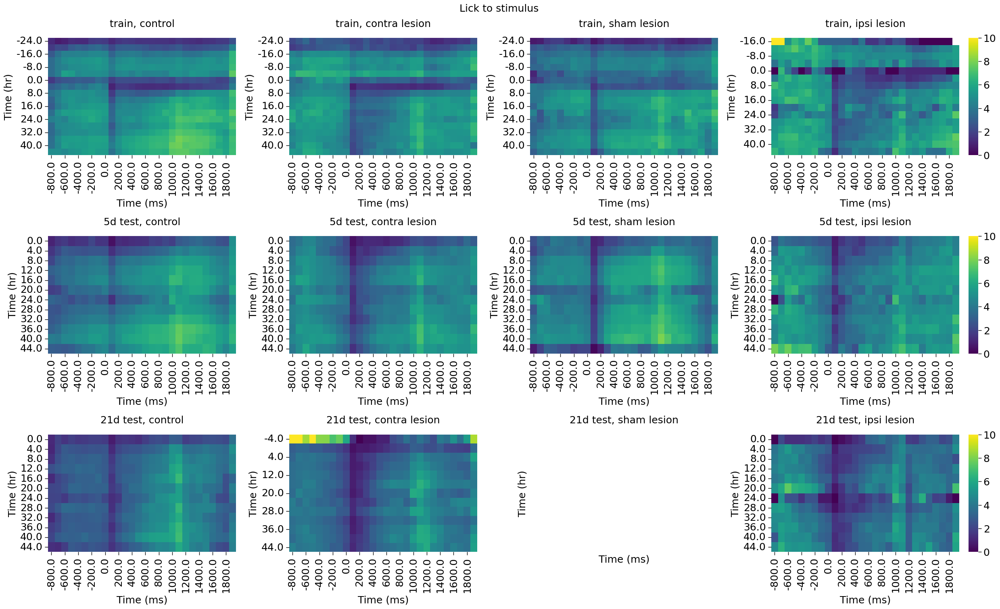

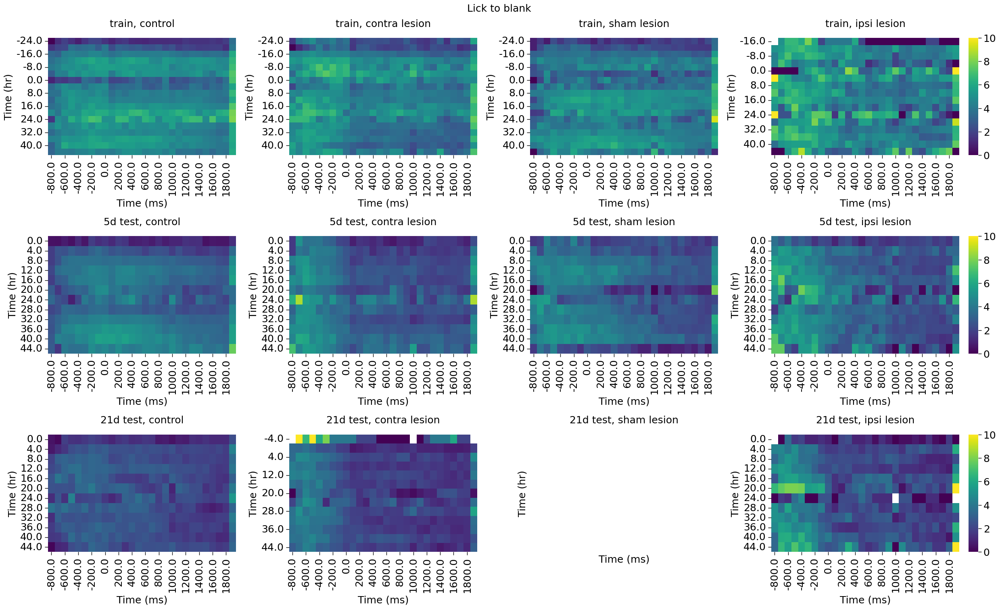

In [12]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
heatmap_data = means_full_means[(means_full_means['Time (hr)'] >= -24) & (means_full_means['Time (hr)'] < 48) 
                             & (means_full_means.apply(lambda x: x['cond'] in conds, axis=1))
                             & (means_full_means['Time (ms)'] < 2000) 
                             ]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])

htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'stimulus'], htmp_args, draw_heatmap, col='cond',row='test_time',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                row_order=['train', '5d test', '21d test'],
                cmap='viridis', vmin=0, vmax=10)
fg.suptitle('Lick to stimulus', y=1.01)

fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'blank'], htmp_args, draw_heatmap, col='cond',row='test_time',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                row_order=['train', '5d test', '21d test'],
                cmap='viridis', vmin=0, vmax=10)
fg.suptitle('Lick to blank', y=1.01)

Text(0.5, 1.01, 'performance')

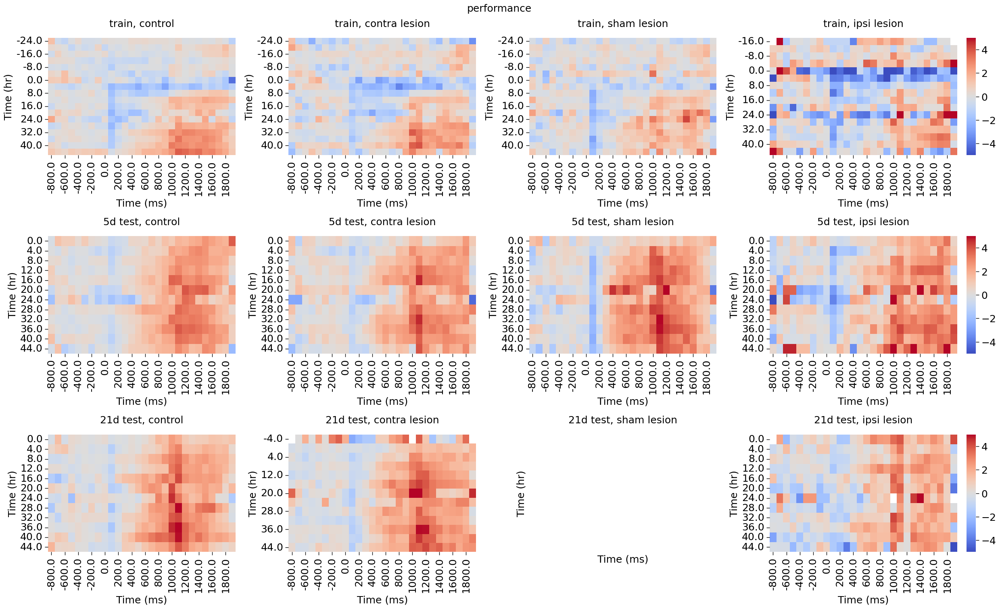

In [13]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
heatmap_data = perf_full_means[(perf_full_means['Time (hr)'] >= -24) & (perf_full_means['Time (hr)'] < 48) 
                             & (perf_full_means.apply(lambda x: x['cond'] in conds, axis=1))
                             & (perf_full_means['Time (ms)'] < 2000)]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])
htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data, htmp_args, draw_heatmap,row='test_time', col='cond',
                row_order=['train', '5d test', '21d test'],
                col_order=['control', 'contra lesion', 'sham lesion', 'ipsi lesion'],
                cmap='coolwarm', vmin=-5, vmax=5)
fg.suptitle('performance', y=1.01)

### Control animals show greater consummatory licking in SAT than lesioned animals

Text(0.5, 1.01, 'Lick to stimulus')

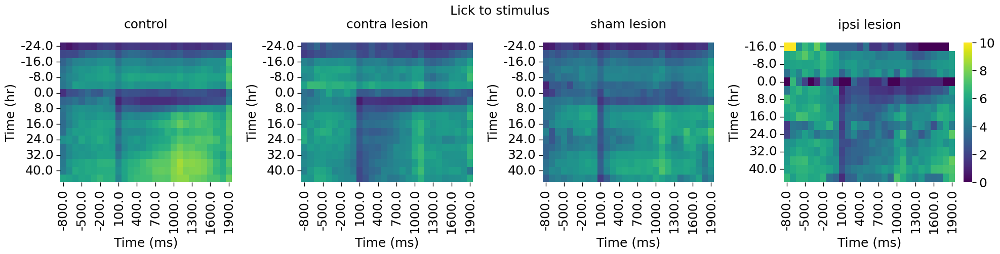

In [97]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
heatmap_data = means_full_means[(means_full_means['Time (hr)'] >= -24) & (means_full_means['Time (hr)'] < 48) 
                             & (means_full_means.apply(lambda x: x['cond'] in conds, axis=1))
                             & (means_full_means['Time (ms)'] < 2000) 
                             & (means_full_means['test_time'] == 'train')
                             ]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])

htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'stimulus'], htmp_args, draw_heatmap, col='cond',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                cmap='viridis', vmin=0, vmax=10)
fg.suptitle('Lick to stimulus', y=1.01)

#### Higher control lick frequency is not due to control animals drinking more water at SAT2

In [123]:
water_drank_data = pd.read_excel(r'C:\Users\swind\Documents\lab_work\Barth\behavior_analysis\behavior_data\retrain_metadata.xlsx').iloc[0:92, 0:20]

In [145]:
water_drank = water_drank_data.melt(id_vars=['Animal ID', 'animal', 'Sex', 'Strain', 'lesion','Cage', 'Date', 'Age', 'birth date','acc', 'droplet size'], value_vars=['water ACC', 'water SAT1', 'water SAT2'], var_name='day', value_name='water drank (mL)')
water_drank['calc droplet size (ul)'] = water_drank_data.melt(value_vars=['calc. drop ACC0', 'calc drop SAT1', 'calc drop SAT2'], var_name='day', value_name='droplet size (ul)')['droplet size (ul)']
water_drank['trial no'] = water_drank_data.melt(value_vars=['trial no ACC 0', 'trial no SAT 1', 'trial no SAT2'], var_name='day', value_name='trial no')['trial no']
water_drank['test_time'] = water_drank['Animal ID'].str.lstrip('PWBXTEHSNL123456789 ')
water_drank = water_drank[water_drank['trial no'] >= 100]
water_drank['day'] = water_drank['day'].str.lstrip('water ')
water_drank['lesion'] = water_drank['lesion'].replace({'no': 'control', 'contra':'contra lesion', 'sham':'sham lesion', 'ipsi':'ipsi lesion'})

In [146]:
water_drank['Animal ID'].sort_values()

184    PB713 retrain
92     PB713 retrain
186      PB713 train
94       PB713 train
2        PB713 train
           ...      
160     PTE6 retrain
252     PTE6 retrain
70        PTE6 train
162       PTE6 train
254       PTE6 train
Name: Animal ID, Length: 126, dtype: object

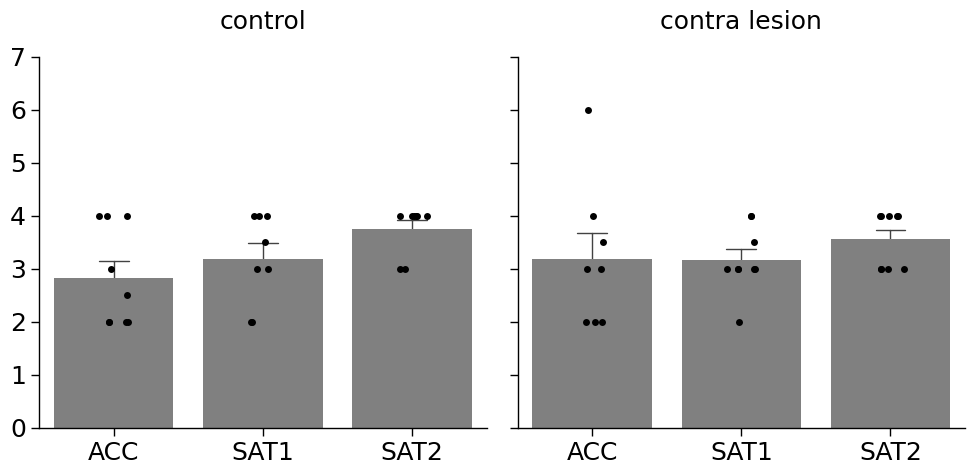

In [100]:
plot_bar_strip(water_drank[water_drank['test_time'] == 'train'], x='day', y='water drank (mL)', col='lesion',col_order=['control', 'contra lesion'],
               errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2, color='grey', pt_color='k',
                ylim=[0, 7],xlim=[-0.5, 2.5], connect=False, jitter=True)

#### Control animals did more trials than lesioned animals, so difference in licking frequency could be related to a difference in trial number

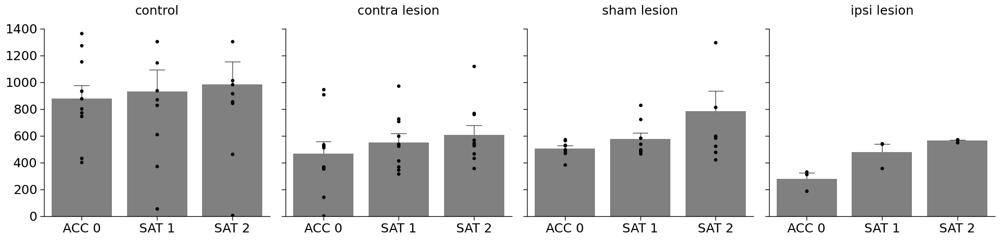

In [101]:
days = ['ACC 0', 'SAT 1', 'SAT 2']
plot_bar_strip(trials_day[(trials_day['test_time'] == 'train')
                        & (trials_day.apply(lambda x: x['Day'] in days, axis=1))],
                x='Day', y='trial no', col='cond', color='grey', pt_color='k',ylim=[0,1400],
               col_order=['control', 'contra lesion', 'sham lesion', 'ipsi lesion'],
               order=days, xlim=[-0.5, 2.5])

#### Difference in trial number is not due to different sets of cages being used for different conditions

In [102]:
def get_cage_counts(df, gpcols):
    counts = df.groupby(['cond', 'test_time', 'animal']).first().groupby(gpcols).count()['stimulus']
    kpcols = df.columns.drop(gpcols + ['animal', 'stimulus'])
    kp = df.groupby(gpcols)[kpcols].first()
    return pd.concat([counts, kp], axis=1).reset_index()

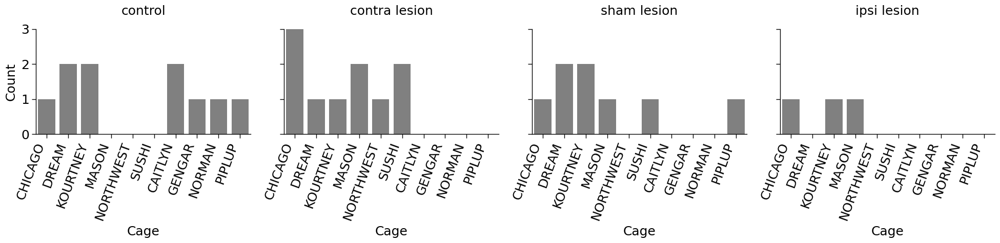

In [103]:
cage_counts = get_cage_counts(trials_day,['cond', 'test_time', 'Cage'])
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']

g = sns.catplot(cage_counts[(cage_counts['test_time']=='train')
                          & (cage_counts.apply(lambda x: x['cond'] in conds, axis=1))], 
                y='stimulus', x='Cage',kind='bar', col='cond', color='grey', col_order=conds)

for name, ax in g.axes_dict.items():
    g.axes_dict[name].set_title(name)
    g.axes_dict[name].set_ylabel('Count')
    g.axes_dict[name].tick_params(labelbottom=True, labeltop=False)
    g.axes_dict[name].set_xticklabels(g.axes_dict[name].get_xticklabels(), rotation=70, ha='right')
g.tight_layout()

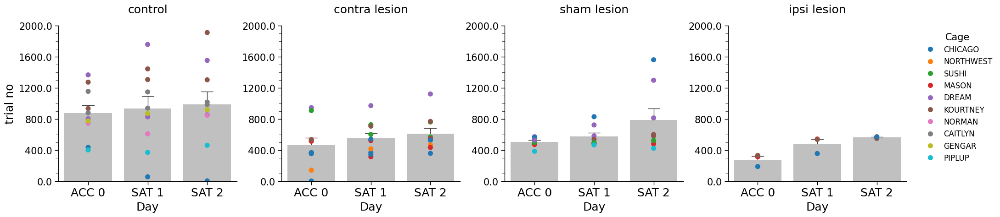

In [104]:
ordr = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
ordr1 = ['ACC 0', 'SAT 1', 'SAT 2']
cages = trials_day[trials_day.apply(lambda x: x['cond'] in ordr, axis=1)]['Cage'].unique()
g = plot_bar(trials_day[(trials_day.apply(lambda x: x['cond'] in ordr, axis=1)) & (trials_day['test_time'] == 'train')
                              & (trials_day.apply(lambda x: x['Day'] in ordr1, axis=1))],
                   y='trial no', x='Day', col='cond', native_scale=False, sharex=True, sharey=True,
                   order=ordr1,aspect=1,xlim=None,col_order=ordr,color='silver',
                   dodge='auto', legend=True,fill=True, linewidth=1,
                   #palette=['#DBDBDB', '#C8CFFF', '#FCAEF3'],
                   width=.8, ylim=[0, 2000], ymajmult=400, yminmult=100,alpha=1)
i=0
for name, ax in g.axes_dict.items():
    g.axes_dict[name].set_title(name)
    g.axes_dict[name].set_xticklabels(g.axes_dict[name].get_xticklabels())
    f = sns.stripplot(trials_day[(trials_day['cond'] == name) & (trials_day['Strain'] != 'u')& (trials_day['test_time'] == 'train' )
                  ], ax=g.axes_dict[name],hue_order=cages,
                x="Day", y="trial no",size=8, dodge=False, legend=(i==0), hue='Cage',
                order=['ACC 0', 'SAT 1', 'SAT 2'], jitter=False)
    if i==0:
       sns.move_legend(g.axes_dict[name], 'upper left', ncol=1, bbox_to_anchor=(4.8,1), fontsize=12)
    i+=1
    g.axes_dict[name].yaxis.set_tick_params(labelleft=True)
    g.axes_dict[name].set_yticklabels(g.axes_dict[name].get_yticks(), fontsize=15)

#### Difference in trial number is not due to strain differences

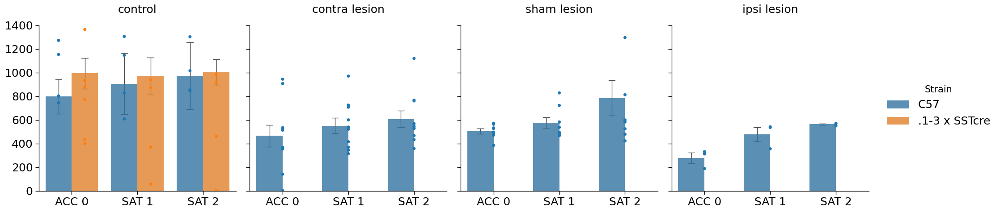

In [105]:
days = ['ACC 0', 'SAT 1', 'SAT 2']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
plot_bar_strip(trials_day[(trials_day['test_time'] == 'train')
                        & (trials_day.apply(lambda x: x['Day'] in days, axis=1))
                        &(trials_day.apply(lambda x: x['cond'] in conds, axis=1))],
                x='Day', y='trial no', col='cond',ylim=[0,1400],
               col_order=conds,dodge=True,alpha=0.8,
               order=days, xlim=[-0.5, 2.5], hue='Strain')

### Lick frequency is different across cages

#### Animals trained in Kourtney (n2) have higher lick frequency

In [23]:
gpcols = ['cond', 'test_time', 'Time (hr)', 'Time (ms)', 'isKourtney']
perf_full_means = get_means(perf_full, gpcols)
gpcols = gpcols + ['stimulus']
means_full_means = get_means(means_full, gpcols)

Text(0.5, 1.01, 'Lick to blank')

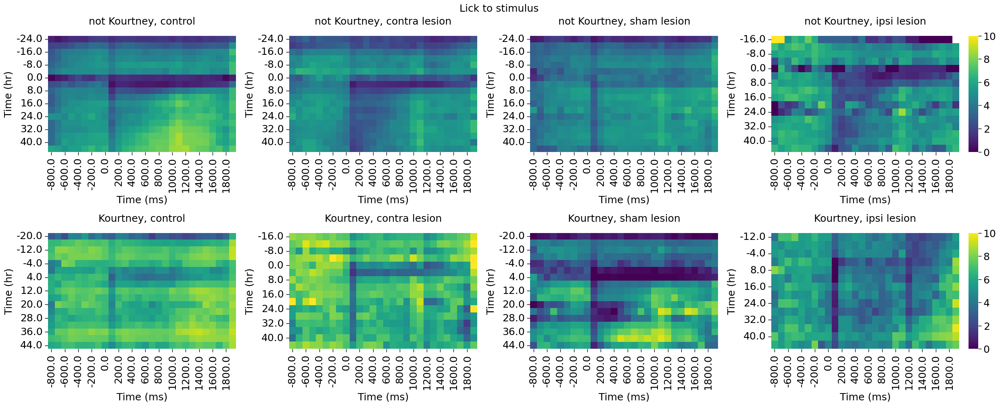

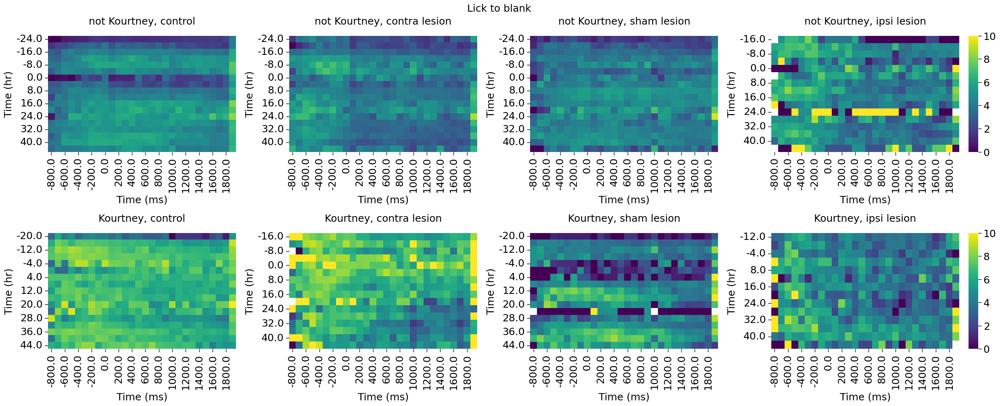

In [24]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
heatmap_data = means_full_means[(means_full_means['Time (hr)'] >= -24) & (means_full_means['Time (hr)'] < 48) 
                             & (means_full_means.apply(lambda x: x['cond'] in conds, axis=1))
                             & (means_full_means['Time (ms)'] < 2000) 
                             & (means_full_means['test_time'] == 'train')
                             ]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])

htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'stimulus'], htmp_args, draw_heatmap, col='cond',row='isKourtney',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                row_order=['not Kourtney', 'Kourtney'],
                cmap='viridis', vmin=0, vmax=10)
fg.suptitle('Lick to stimulus', y=1.01)

fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'blank'], htmp_args, draw_heatmap, col='cond',row='isKourtney',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                row_order=['not Kourtney', 'Kourtney'],
                cmap='viridis', vmin=0, vmax=10)
fg.suptitle('Lick to blank', y=1.01)

Text(0.5, 1.01, 'performance')

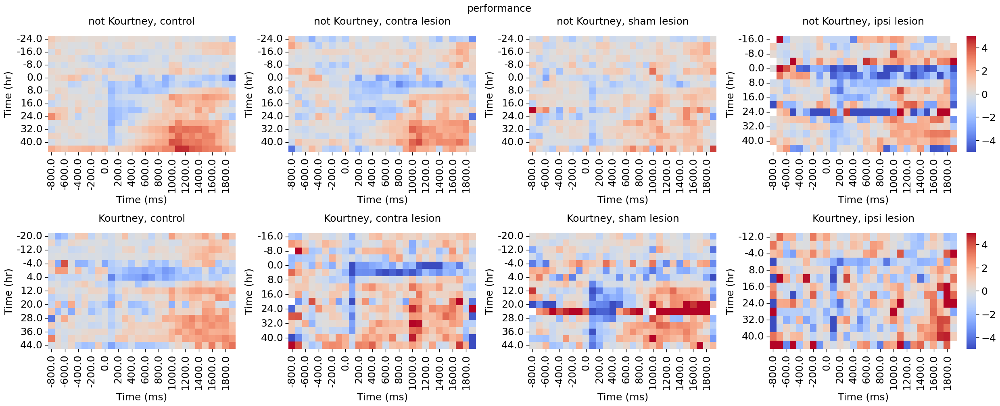

In [25]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
heatmap_data = perf_full_means[(perf_full_means['Time (hr)'] >= -24) & (perf_full_means['Time (hr)'] < 48) 
                             & (perf_full_means.apply(lambda x: x['cond'] in conds, axis=1))
                             & (perf_full_means['Time (ms)'] < 2000)
                             & (perf_full_means['test_time'] == 'train')]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])
htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data, htmp_args, draw_heatmap,row='isKourtney', col='cond',
                row_order=['not Kourtney', 'Kourtney'],
                col_order=['control', 'contra lesion', 'sham lesion', 'ipsi lesion'],
                cmap='coolwarm', vmin=-5, vmax=5)
fg.suptitle('performance', y=1.01)

#### Control animals trained in Dream (n2) have higher consummatory lick to stimulus in SAT

In [26]:
gpcols = ['cond', 'test_time', 'Time (hr)', 'Time (ms)', 'isDream']
perf_full_means = get_means(perf_full, gpcols)
gpcols = gpcols + ['stimulus']
means_full_means = get_means(means_full, gpcols)

Text(0.5, 1.01, 'Lick to blank')

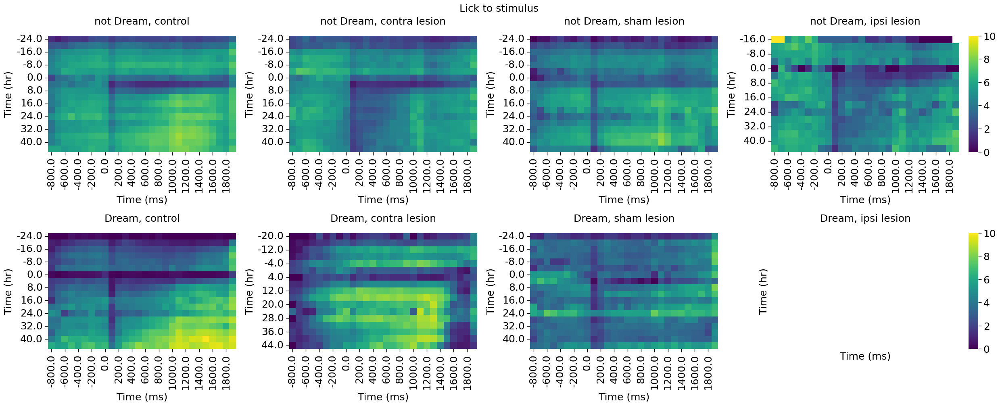

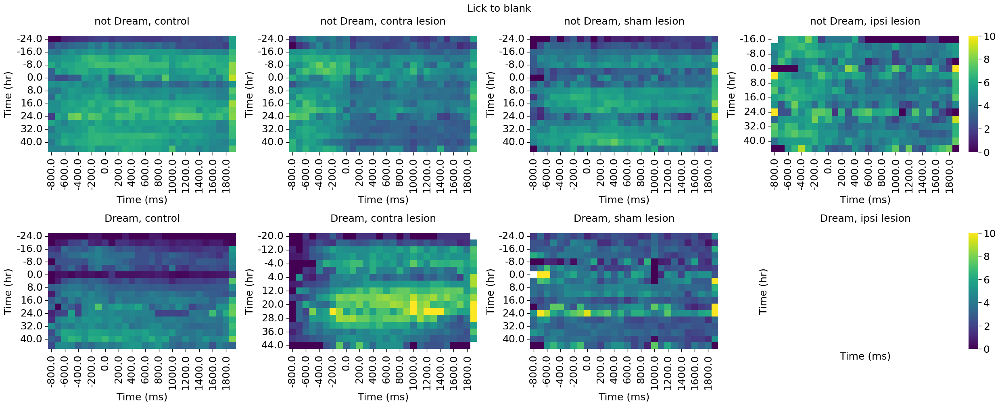

In [27]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
heatmap_data = means_full_means[(means_full_means['Time (hr)'] >= -24) & (means_full_means['Time (hr)'] < 48) 
                             & (means_full_means.apply(lambda x: x['cond'] in conds, axis=1))
                             & (means_full_means['Time (ms)'] < 2000) 
                             & (means_full_means['test_time'] == 'train')
                             ]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])

htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'stimulus'], htmp_args, draw_heatmap, col='cond',row='isDream',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                row_order=['not Dream', 'Dream'],
                cmap='viridis', vmin=0, vmax=10)
fg.suptitle('Lick to stimulus', y=1.01)

fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'blank'], htmp_args, draw_heatmap, col='cond',row='isDream',
                col_order=['control', 'contra lesion', 'sham lesion','ipsi lesion'],
                row_order=['not Dream', 'Dream'],
                cmap='viridis', vmin=0, vmax=10)
fg.suptitle('Lick to blank', y=1.01)

Text(0.5, 1.01, 'performance')

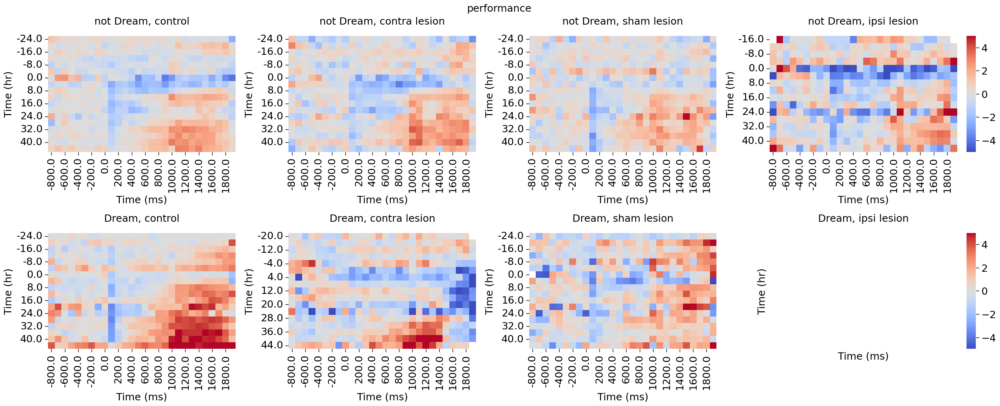

In [28]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
heatmap_data = perf_full_means[(perf_full_means['Time (hr)'] >= -24) & (perf_full_means['Time (hr)'] < 48) 
                             & (perf_full_means.apply(lambda x: x['cond'] in conds, axis=1))
                             & (perf_full_means['Time (ms)'] < 2000)
                             & (perf_full_means['test_time'] == 'train')]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])
htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data, htmp_args, draw_heatmap,row='isDream', col='cond',
                row_order=['not Dream', 'Dream'],
                col_order=['control', 'contra lesion', 'sham lesion', 'ipsi lesion'],
                cmap='coolwarm', vmin=-5, vmax=5)
fg.suptitle('performance', y=1.01)

#### Lick frequency and response to puff appears similar across cages, but has high variation

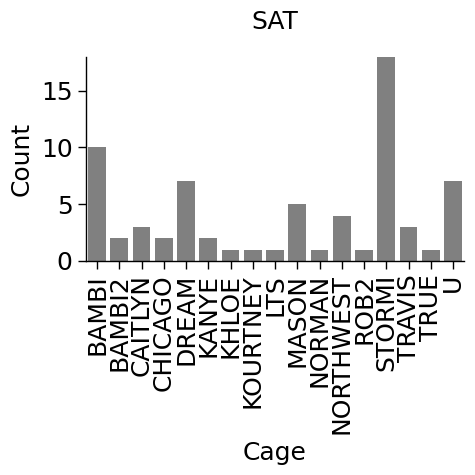

In [29]:
conds = ['SAT']
g = sns.catplot(cage_counts[(cage_counts['test_time']=='train')
                          & (cage_counts.apply(lambda x: x['cond'] in conds, axis=1))], 
                y='stimulus', x='Cage',kind='bar', col='cond', color='grey', col_order=conds)

for name, ax in g.axes_dict.items():
    g.axes_dict[name].set_title(name)
    g.axes_dict[name].set_ylabel('Count')
    g.axes_dict[name].tick_params(labelbottom=True, labeltop=False)
    g.axes_dict[name].set_xticklabels(g.axes_dict[name].get_xticklabels(), rotation=90, ha='center')
g.tight_layout()

In [32]:
gpcols = ['cond', 'test_time', 'Time (hr)', 'Time (ms)', 'stimulus', 'Cage']
means_full_means = get_means(means_full, gpcols)

Text(0.5, 1.01, 'Lick to stimulus')

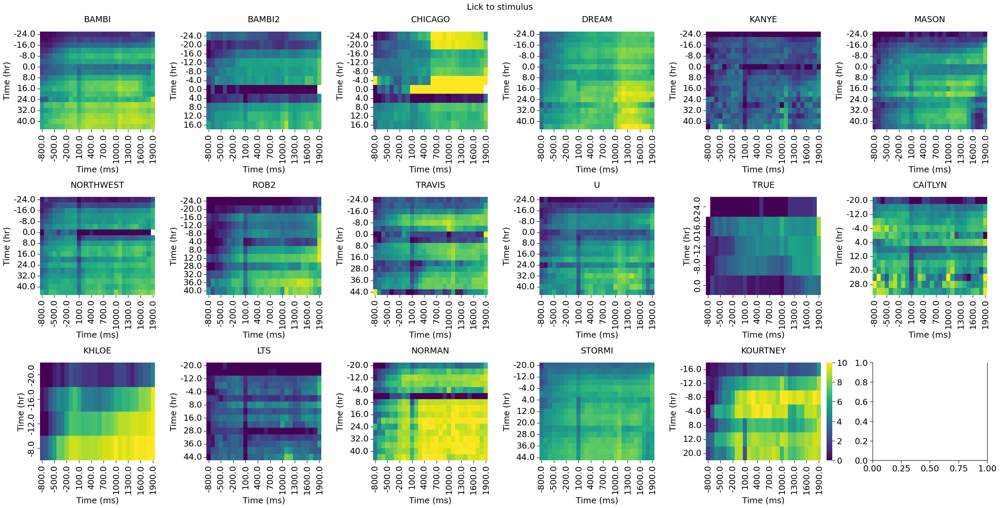

In [33]:
conds = ['SAT']
heatmap_data = means_full_means[(means_full_means['Time (hr)'] >= -24) & (means_full_means['Time (hr)'] < 48) 
                             & (means_full_means['cond'] == 'SAT')
                             & (means_full_means['Time (ms)'] < 2000) 
                             & (means_full_means['test_time'] == 'train')
                             ]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])

htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'stimulus'], htmp_args, draw_heatmap, col='Cage',col_wrap=6,
                cmap='viridis', vmin=0, vmax=10)
fg.suptitle('Lick to stimulus', y=1.01)

#### Lick frequency and response to puff appears similar across different strains in the same cage

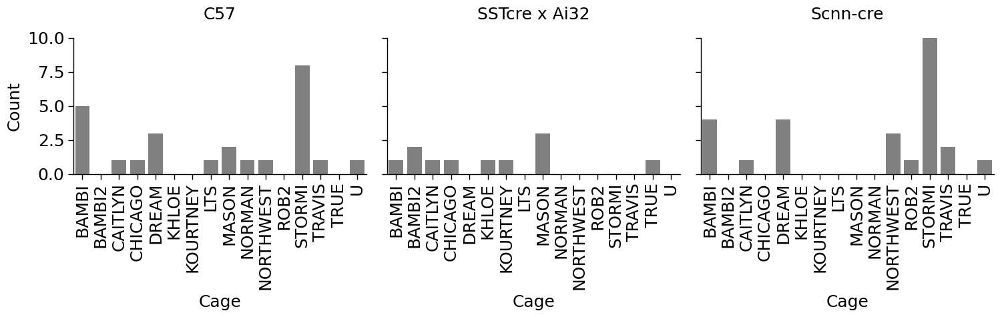

In [64]:
conds = ['SAT']
strains = ['C57', 'SSTcre x Ai32', 'Scnn-cre']
cage_counts = get_cage_counts(trials_day, ['cond', 'test_time', 'Cage', 'Strain'])
g = sns.catplot(cage_counts[(cage_counts['test_time']=='train')
                          & (cage_counts.apply(lambda x: x['cond'] in conds, axis=1))
                          & (cage_counts.apply(lambda x: x['Strain'] in strains, axis=1))], 
                y='stimulus', x='Cage',kind='bar', col='Strain', color='grey', col_order=strains)

for name, ax in g.axes_dict.items():
    g.axes_dict[name].set_title(name)
    g.axes_dict[name].set_ylabel('Count')
    g.axes_dict[name].tick_params(labelbottom=True, labeltop=False)
    g.axes_dict[name].set_xticklabels(g.axes_dict[name].get_xticklabels(), rotation=90, ha='center')
g.tight_layout()

In [75]:
gpcols = ['cond', 'test_time', 'Time (hr)', 'Time (ms)', 'stimulus', 'Cage', 'Strain']
means_full_means = get_means(means_full, gpcols)

Text(0.5, 1.01, 'Lick to stimulus')

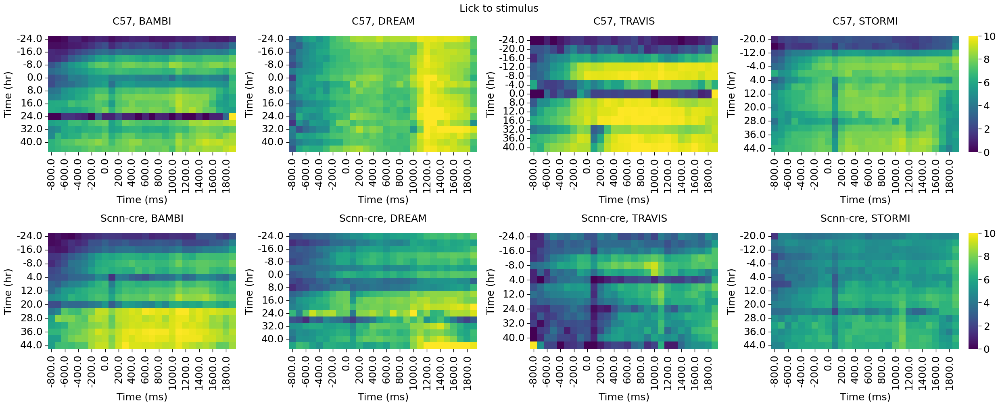

In [80]:
strains = ['C57', 'Scnn-cre']
cages = ['BAMBI', 'DREAM', 'TRAVIS', 'STORMI']
heatmap_data = means_full_means[(means_full_means['Time (hr)'] >= -24) & (means_full_means['Time (hr)'] < 48) 
                             & (means_full_means['cond'] == 'SAT')
                             & (means_full_means['Time (ms)'] < 2000) 
                             & (means_full_means['test_time'] == 'train')
                             & (means_full_means.apply(lambda x: x['Strain'] in strains, axis=1))
                             & (means_full_means.apply(lambda x: x['Cage'] in cages, axis=1))
                             ]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])

htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data[heatmap_data['stimulus'] == 'stimulus'], htmp_args, draw_heatmap, col='Cage',row='Strain',
                cmap='viridis', vmin=0, vmax=10, col_order=cages, row_order=strains
                )
fg.suptitle('Lick to stimulus', y=1.01)

### Greater consummatory licking in control animals is correlated with faster recovery to air puff

#### Control animals show greater consummatory licking in SAT than lesioned animals

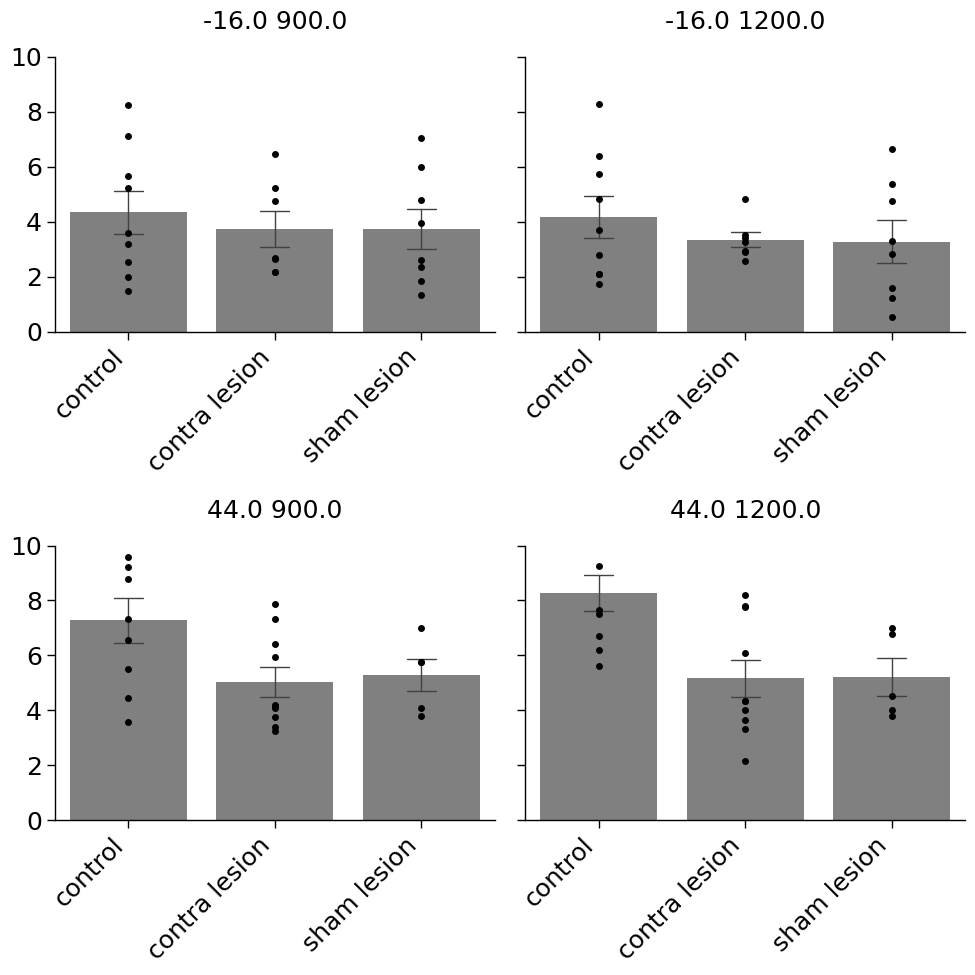

In [94]:
conds = [ 'control', 'contra lesion', 'sham lesion']
times = [900, 1200]
bins = [-16, 44]
g  = plot_bar_strip(means_full[(means_full['test_time'] == 'train')
                             & (means_full.apply(lambda x: x['cond'] in conds, axis=1)) 
                             & (means_full.apply(lambda x: x['Time (hr)'] in bins, axis=1)) 
                             & (means_full['stimulus'] == 'stimulus')
                             & (means_full.apply(lambda x: x['Time (ms)'] in times, axis=1))], 
                    order=['control', 'contra lesion', 'sham lesion'],
                    y='lick', x='cond', col='Time (ms)',row='Time (hr)', xlim=[-0.5, 2.5],
                    color='grey', errorbar='se', err_kws={'lw':1}, pt_color='k', 
                    xlab_kws={'rotation':45, 'ha':'right'})

#### Anticipatory and consummatory licking of contra lesioned animals is lower at SAT2

In [95]:
def get_time_group(x):
    if x in range(-700, -300, 100):
        return 'baseline'
    elif x in range(700, 1000, 100):
        return 'anticipatory'
    elif x in range(1100, 1400, 100):
        return 'consummatory'
def get_bin_group(x):
    if x in [-12, -8, -4]:
        return 'ACC'
    elif x in [4, 8, 12]:
        return 'SAT1'
    elif x in [36, 40, 44]:
        return 'SAT2'

In [96]:
means_full['time (ms) group'] = means_full['Time (ms)'].apply(get_time_group)
means_full['time (hr) group'] = means_full['Time (hr)'].apply(get_bin_group)
means_subset = means_full.groupby(['cond', 'test_time','animal', 'stimulus', 'time (ms) group', 'time (hr) group'])['lick'].mean().reset_index()
means_subset

,cond,test_time,animal,stimulus,time (ms) group,time (hr) group,lick
0,100ACC80ACC,train,PNL1,blank,anticipatory,ACC,5.552170
1,100ACC80ACC,train,PNL1,blank,anticipatory,SAT1,4.906603
2,100ACC80ACC,train,PNL1,blank,baseline,ACC,4.567352
3,100ACC80ACC,train,PNL1,blank,baseline,SAT1,3.760056
4,100ACC80ACC,train,PNL1,blank,consummatory,ACC,5.214153
...,...,...,...,...,...,...,...
3703,sham lesion,train,PWH9 train,stimulus,baseline,SAT1,0.736016
3704,sham lesion,train,PWH9 train,stimulus,baseline,SAT2,2.453782
3705,sham lesion,train,PWH9 train,stimulus,consummatory,ACC,1.062402
3706,sham lesion,train,PWH9 train,stimulus,consummatory,SAT1,2.545934


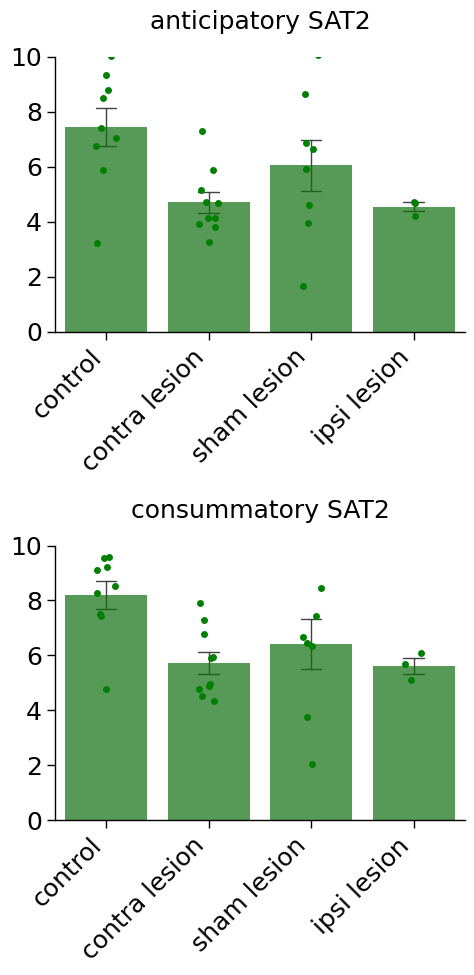

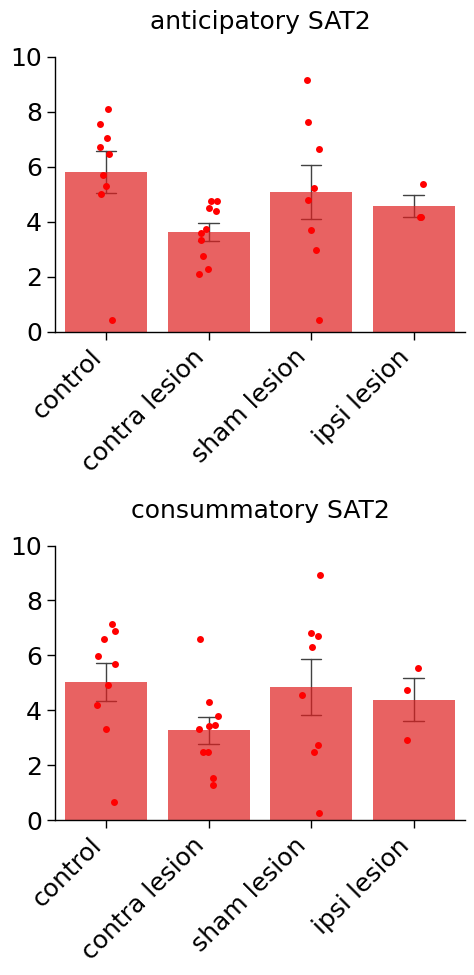

In [103]:
g = plot_bar_strip(means_subset[(means_subset['test_time'] =='train') 
                              & (means_subset['stimulus'] =='stimulus')], 
                col_order=['SAT2'], row_order=['anticipatory', 'consummatory'],
                y='lick', x='cond', col='time (hr) group', row='time (ms) group', 
                order=['control','contra lesion', 'sham lesion', 'ipsi lesion'],alpha=0.7,
                errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                jitter=True, dodge=True,xlab_kws={'rotation':45, 'ha':'right'}, 
                color='green', pt_color='green')

g = plot_bar_strip(means_subset[(means_subset['test_time'] =='train') 
                              & (means_subset['stimulus'] =='blank')], 
                col_order=['SAT2'], row_order=['anticipatory', 'consummatory'],
                y='lick', x='cond', col='time (hr) group', row='time (ms) group', 
                order=['control','contra lesion', 'sham lesion', 'ipsi lesion'],alpha=0.7,
                errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                jitter=True, dodge=True,xlab_kws={'rotation':45, 'ha':'right'}, 
                color='red', pt_color='red')

#### Lower licking frequency of contra lesioned animals is not due to lower overall licking frequency

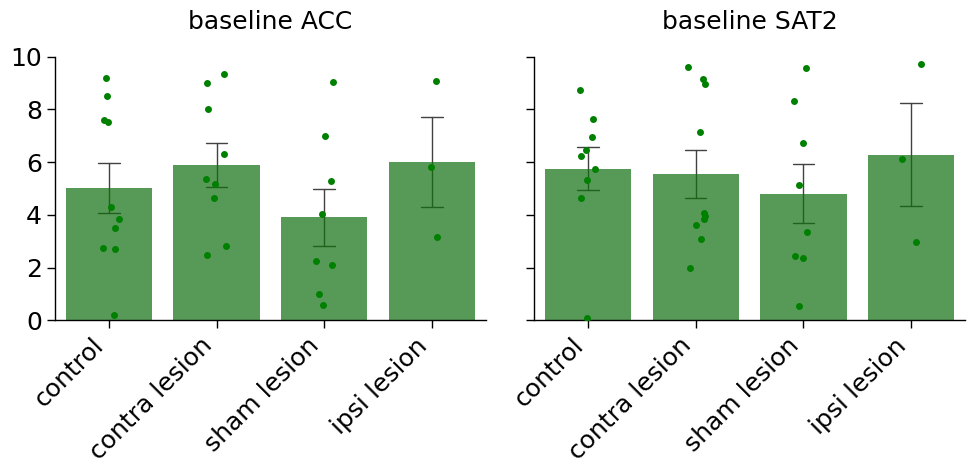

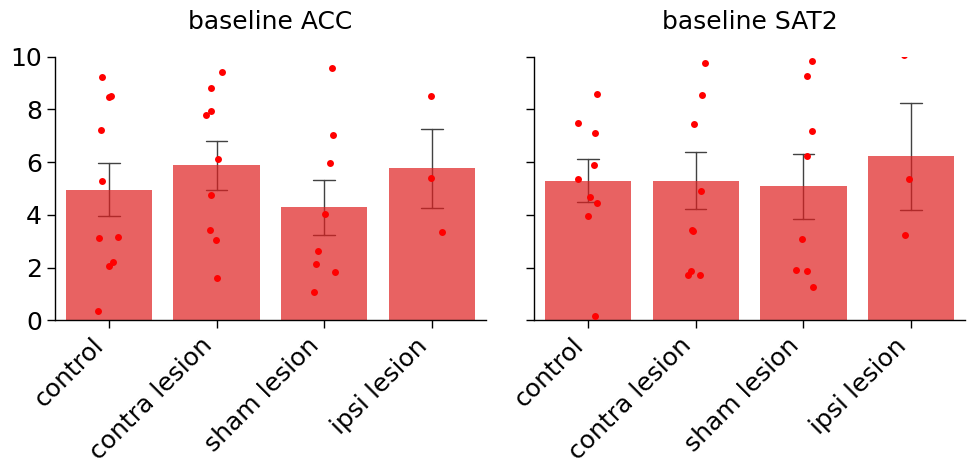

In [106]:
g = plot_bar_strip(means_subset[(means_subset['test_time'] =='train') 
                              & (means_subset['stimulus'] =='stimulus')], 
                col_order=['ACC', 'SAT2'], row_order=['baseline'],
                y='lick', x='cond', col='time (hr) group', row='time (ms) group', 
                order=['control','contra lesion', 'sham lesion', 'ipsi lesion'],alpha=0.7,
                errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                jitter=True, dodge=True,xlab_kws={'rotation':45, 'ha':'right'}, 
                color='green', pt_color='green')

g = plot_bar_strip(means_subset[(means_subset['test_time'] =='train') 
                              & (means_subset['stimulus'] =='blank')], 
                col_order=['ACC', 'SAT2'], row_order=['baseline'],
                y='lick', x='cond', col='time (hr) group', row='time (ms) group', 
                order=['control','contra lesion', 'sham lesion', 'ipsi lesion'],alpha=0.7,
                errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                jitter=True, dodge=True,xlab_kws={'rotation':45, 'ha':'right'}, 
                color='red', pt_color='red')

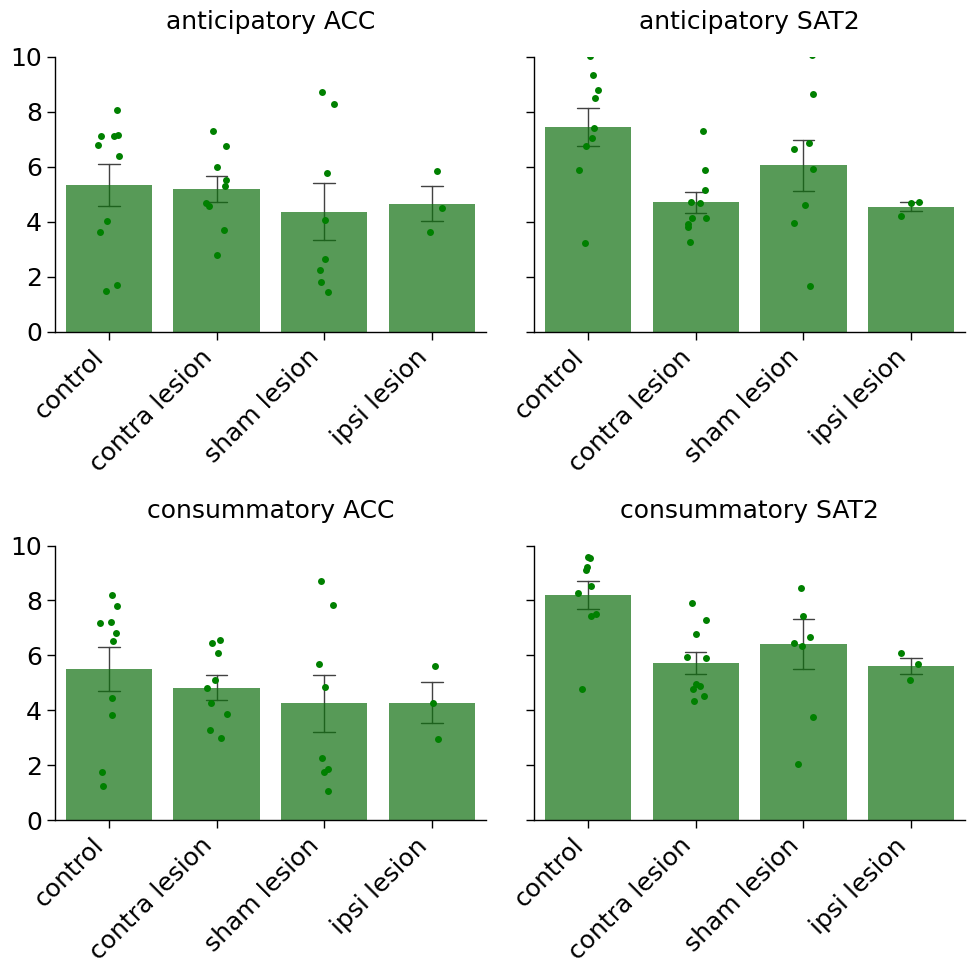

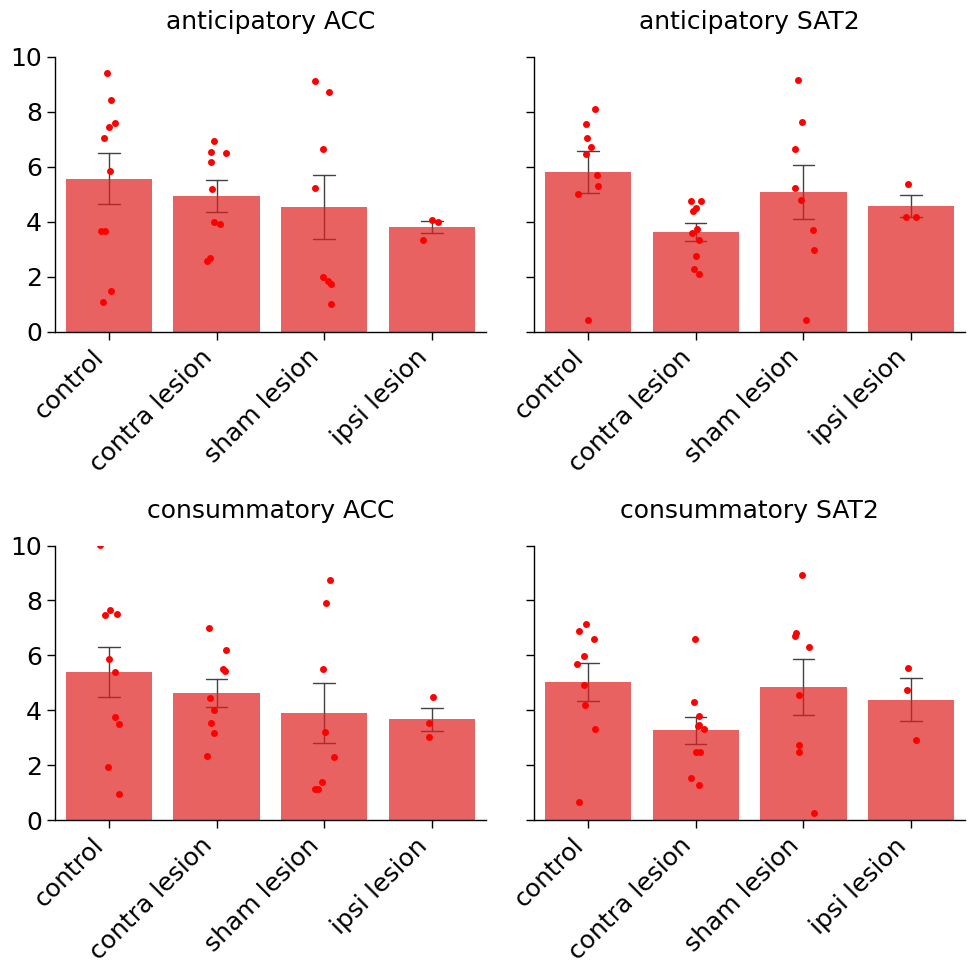

In [107]:
g = plot_bar_strip(means_subset[(means_subset['test_time'] =='train') 
                              & (means_subset['stimulus'] =='stimulus')], 
                col_order=['ACC', 'SAT2'], row_order=['anticipatory', 'consummatory'],
                y='lick', x='cond', col='time (hr) group', row='time (ms) group', 
                order=['control','contra lesion', 'sham lesion', 'ipsi lesion'],alpha=0.7,
                errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                jitter=True, dodge=True,xlab_kws={'rotation':45, 'ha':'right'}, 
                color='green', pt_color='green')

g = plot_bar_strip(means_subset[(means_subset['test_time'] =='train') 
                              & (means_subset['stimulus'] =='blank')], 
                col_order=['ACC', 'SAT2'], row_order=['anticipatory', 'consummatory'],
                y='lick', x='cond', col='time (hr) group', row='time (ms) group', 
                order=['control','contra lesion', 'sham lesion', 'ipsi lesion'],alpha=0.7,
                errorbar='se', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                jitter=True, dodge=True,xlab_kws={'rotation':45, 'ha':'right'}, 
                color='red', pt_color='red')

#### Lower licking  frequency of contra lesioned animals is due to failure to recover licking frequency after air puff

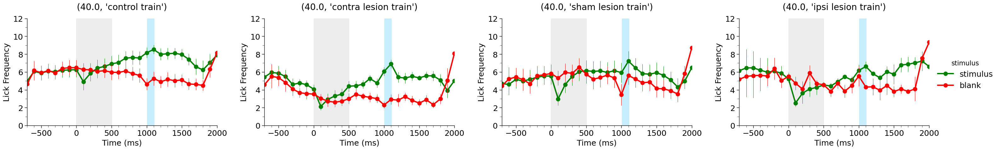

In [16]:
plot_lickfreq(means_full[(means_full.apply(lambda x: x['cond'] in conds, axis=1)) &
                         (means_full['Time (hr)'] == 40)
                       & (means_full['test_time'] == 'train')
                        ], col_order=['control train', 'contra lesion train', 'sham lesion train', 'ipsi lesion train'],
                        suptitle=None, col='condition', col_wrap=None, row='Time (hr)',errorbar='se', err_style='bars', err_kws={'lw':0.7}, xlim=[-700, 2000])

#### Reduction in pre-puff lick frequency is due to lesion, not due to data alignment

In [17]:
retrain = pd.read_csv(r'C:\Users\swind\Documents\lab_work\Barth\behavior_analysis\behavior_data\formatted\retrain_formatted.txt', dtype={'poke':int, 'lick':int,'condition code':int,'trial no':int}, parse_dates=['timestamp', 'Date', 'offset'])
retrain['delay'] = retrain['delay'].astype('timedelta64[ns]')
retrain['acc'] = retrain['acc'].astype('timedelta64[ns]')
retrain = get_first_sample(retrain, ['condition', 'animal', 'trial no'], 'timestamp', 'start_delta')
retrain['start_delta'] = retrain['timestamp'] - retrain['start_delta']
retrain = retrain[retrain['delay'] > pd.to_timedelta(0)]

In [19]:
index_trial = ['condition', 'animal', 'trial no']
index = ['condition', 'animal']
keep = ['Age', 'Strain', 'Cage', 'Date', 'stimulus', 'water','type', 'acc']
values = ['lick']
time = 'timestamp'
offset = 'offset'
puff = 'start_delta'

full_keys = {
        "millis bin":"start_delta",
        "Time (ms)":"Time (ms)",
        "stimulus type":"stimulus",
        "water delivery":"water",
        "trial no":"trial no",
        "time bin":"delta",
        "licks":"lick",
        "timestamp":"timestamp",
        "delay":"delay",
        "acc":"acc",
        'offset':'offset'
    }
mins = {
        "min_trials": 10,  # minimum number of trials in a bin to keep
        "min_blank": 1,   # minimum number of water trials
        "min_stimulus": 1 # minimum number of water trials 
        }
data = bin_by_time(retrain[retrain['delay'] > pd.to_timedelta(0)], 100, "ms", index_trial, values, keep + [time, offset], puff, origin=None)

# resampling for cross-trial sample alignment
data = bin_by_time(data, 100, "ms", index_trial, [], keep + [time, offset] + values, puff, origin=None)
data = time_to_float(data, "Time (ms)", puff, "ms")
data = align_to_timebin_and_day(data, 4*60, full_keys, keep + [puff,"Time (ms)"], index_trial, values)
keep = keep + ['Time (ms)', 'Time (hr)']

means, counts, perf = agg(data, full_keys, index, keep + ['Day'], values)
daytots = sum_trials(counts, index + ["Day"], keep, "trial no")
data_filtered = drop_group(data, mins, full_keys, "trial no", index, keep)
filtmeans, filtcounts, filtperf = agg(data_filtered, full_keys, index, keep + ['Day'], values)
filtdaytots = sum_trials(filtcounts, index + ["Day"], keep, "trial no")

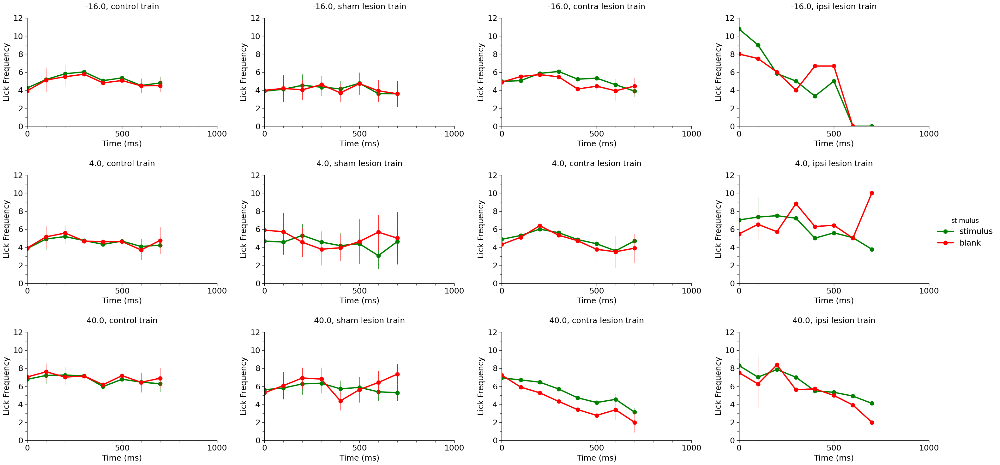

In [24]:
g = plot_lickfreq(filtmeans[((filtmeans['Time (hr)'] == -16) | (filtmeans['Time (hr)'] == 4) | (filtmeans['Time (hr)'] == 40))
                          & (filtmeans['condition'].str.contains('train'))], 
                        col_order=['control train', 'sham lesion train', 'contra lesion train',  'ipsi lesion train'],
                        suptitle=None, col='condition', row='Time (hr)',errorbar='se', col_wrap=None,
                        err_style='bars', err_kws={'lw':0.7}, xlim=[0, 1000], style=False)

for (row, col), ax in g.axes_dict.items():
    ax.set_title(f'{row}, {col}')

Text(0.5, 1.01, 'Pre-puff lick frequency')

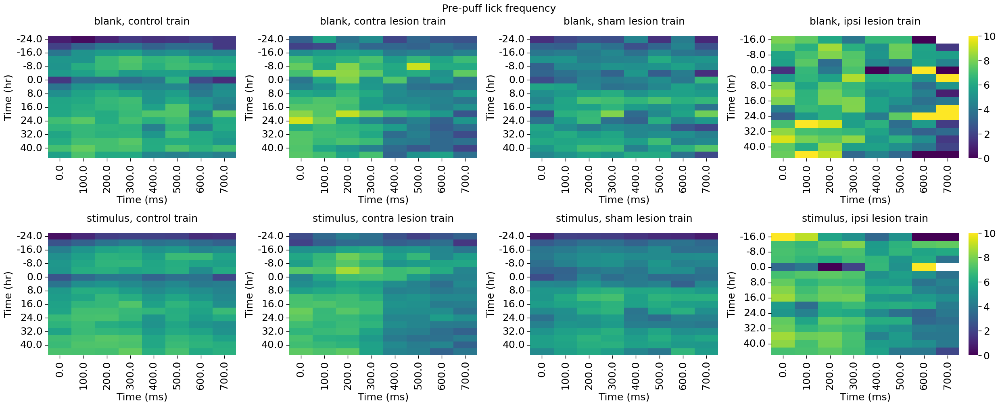

In [34]:
gpcols = ['condition', 'Time (hr)', 'Time (ms)', 'stimulus']
filtmeansmeans = get_means(filtmeans, gpcols)
conds = [ 'control train', 'contra lesion train', 'sham lesion train', 'ipsi lesion train']
heatmap_data = filtmeansmeans[(filtmeansmeans['Time (hr)'] >= -24) & (filtmeansmeans['Time (hr)'] < 48) 
                             & (filtmeansmeans.apply(lambda x: x['condition'] in conds, axis=1))
                            # & (filtmeansmeans['test_time'] == 'train')
                             #& (filtmeansmeans['stimulus'] == 'stimulus')
                             ]
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])
htmp_args=['Time (ms)', 'Time (hr)', 'lick']
fg = draw_facet(heatmap_data, htmp_args, draw_heatmap, col='condition',row='stimulus',
                col_order=conds,
                #row_order=['train', '5d test', '21d test'],
                cmap='viridis', vmin=0, vmax=10)
fg.suptitle('Pre-puff lick frequency', y=1.01)

#### Non lesioned animals have constant or increasing pre-puff lick frequency at 40h

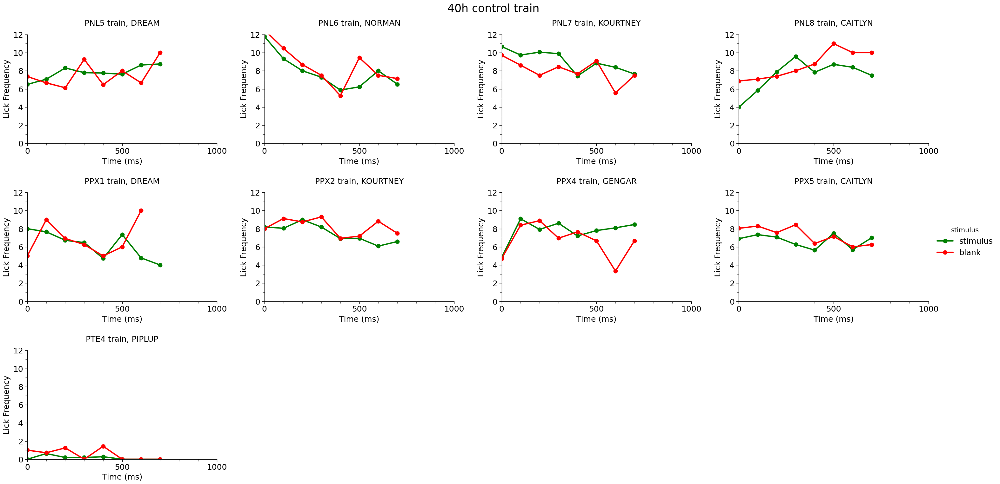

In [28]:
g = plot_lickfreq(filtmeans[(filtmeans['Time (hr)'] == 40)
                          & (filtmeans['condition'].str.contains('control train'))], 
                        suptitle='40h control train', col='animal',errorbar='se', col_wrap=4,
                        err_style='bars', err_kws={'lw':0.7}, xlim=[0, 1000], style=False)

for name, ax in g.axes_dict.items():
    ax.set_title(f'{name}, {filtmeans[filtmeans["animal"] == name]["Cage"].unique()[0]}')

#### Sham lesioned animals have constant or increasing pre-puff lick frequency at 40h

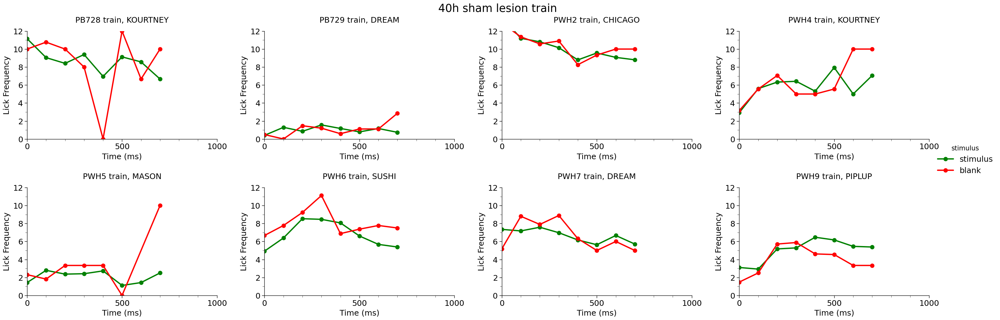

In [30]:
g = plot_lickfreq(filtmeans[(filtmeans['Time (hr)'] == 40)
                          & (filtmeans['condition'].str.contains('sham lesion train'))], 
                        suptitle='40h sham lesion train', col='animal',errorbar='se', col_wrap=4,
                        err_style='bars', err_kws={'lw':0.7}, xlim=[0, 1000], style=False)

for name, ax in g.axes_dict.items():
    ax.set_title(f'{name}, {filtmeans[filtmeans["animal"] == name]["Cage"].unique()[0]}')

#### Decreasing pre-puff lick frequency could be driven by cage-based effects

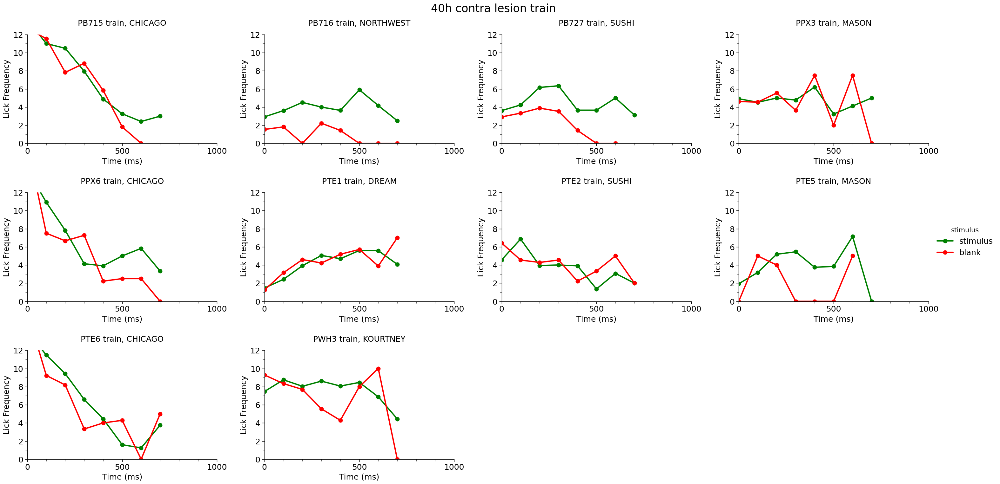

In [29]:
g = plot_lickfreq(filtmeans[(filtmeans['Time (hr)'] == 40)
                          & (filtmeans['condition'].str.contains('contra lesion train'))], 
                        suptitle='40h contra lesion train', col='animal',errorbar='se', col_wrap=4,
                        err_style='bars', err_kws={'lw':0.7}, xlim=[0, 1000], style=False)

for name, ax in g.axes_dict.items():
    ax.set_title(f'{name}, {filtmeans[filtmeans["animal"] == name]["Cage"].unique()[0]}')

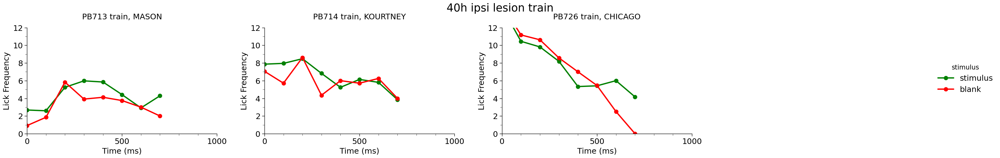

In [31]:
g = plot_lickfreq(filtmeans[(filtmeans['Time (hr)'] == 40)
                          & (filtmeans['condition'].str.contains('ipsi lesion train'))], 
                        suptitle='40h ipsi lesion train', col='animal',errorbar='se', col_wrap=4,
                        err_style='bars', err_kws={'lw':0.7}, xlim=[0, 1000], style=False)

for name, ax in g.axes_dict.items():
    ax.set_title(f'{name}, {filtmeans[filtmeans["animal"] == name]["Cage"].unique()[0]}')

#### Decreasing lick pre-puff lick frequency is not present in old dataset of lesioned animals

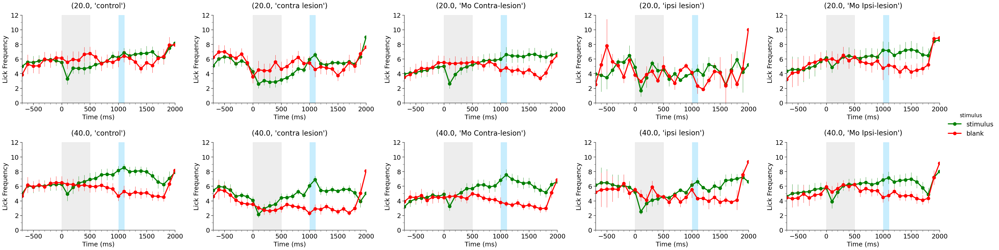

In [38]:
conds = ['control', 'contra lesion', 'Mo Contra-lesion', 'ipsi lesion', 'Mo Ipsi-lesion']
plot_lickfreq(means_full[(means_full.apply(lambda x: x['cond'] in conds, axis=1)) &
                         ((means_full['Time (hr)'] == 40) | (means_full['Time (hr)'] == 20))
                       & (means_full['test_time'] == 'train')
                        ], col_order=['control', 'contra lesion', 'Mo Contra-lesion', 'ipsi lesion', 'Mo Ipsi-lesion'],
                        suptitle=None, col='cond', col_wrap=None, row='Time (hr)',errorbar='se', err_style='bars', err_kws={'lw':0.7}, xlim=[-700, 2000])

### Lick frequency is lower at later  test times

#### Animals do a similar number of trials across time

In [81]:
tot = trials[(trials['Time (hr)'] >= 0) & (trials['Time (hr)'] < 48)].groupby(['condition', 'animal'])['trial no'].sum()
kp = trials[(trials['Time (hr)'] >= 0) & (trials['Time (hr)'] < 48)].groupby(['condition', 'animal'])[['Age', 'Strain', 'Date', 'Cage']].first()
tot = pd.concat([tot, kp], axis=1).reset_index().rename(columns={0:'trial no'})
format_condition(tot)
tot['an'] = tot['animal']
tot['animal'] = tot['animal'].str.rstrip('retraintest ')
tot

,condition,animal,trial no,Age,Strain,Date,Cage,cond,test_time,an
0,0.1 mg DCZ hm4di,OHQ3,427,28.0,SSTcre,u,CHICAGO,hM4Di + DCZ,train,OHQ3
1,0.1 mg DCZ hm4di,OHQ5,489,26.0,SSTcre,u,NORMAN,hM4Di + DCZ,train,OHQ5
2,0.1 mg DCZ hm4di,OHQ6,427,29.0,SSTcre,u,NORMAN,hM4Di + DCZ,train,OHQ6
3,0.1 mg DCZ hm4di,OKK4,606,29.0,SSTcre,u,NORMAN,hM4Di + DCZ,train,OKK4
4,0.1 mg DCZ hm4di,OKK7,394,29.0,SSTcre,u,CHICAGO,hM4Di + DCZ,train,OKK7
...,...,...,...,...,...,...,...,...,...,...
257,sham lesion train,PWH4,1121,41.0,C57,2024-04-24,KOURTNEY,sham lesion,train,PWH4 train
258,sham lesion train,PWH5,961,44.0,C57,2024-04-27,MASON,sham lesion,train,PWH5 train
259,sham lesion train,PWH6,1021,38.0,C57,2024-04-21,SUSHI,sham lesion,train,PWH6 train
260,sham lesion train,PWH7,1536,41.0,C57,2024-04-24,DREAM,sham lesion,train,PWH7 train


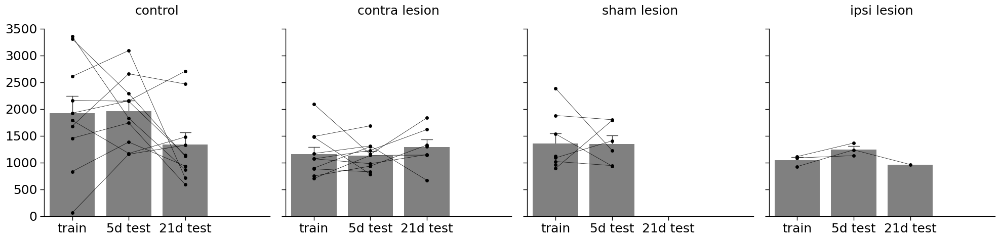

In [84]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
times = ['train', '5d test', '21d test']
g = plot_bar_strip(tot[(tot['cond'].str.contains(' lesion')) | (tot['cond'] == 'control')], 
                y='trial no', x='test_time', col='cond', order=times, col_order=conds,pt_color='k',connect=True,
                errorbar='se', color='grey', err_kws={'lw':1, 'zorder':0}, capsize=0.2, ylim=[0, 3500])

#### Control animals drank more water per day at 21d test time

Text(0.5, 1.02, 'control')

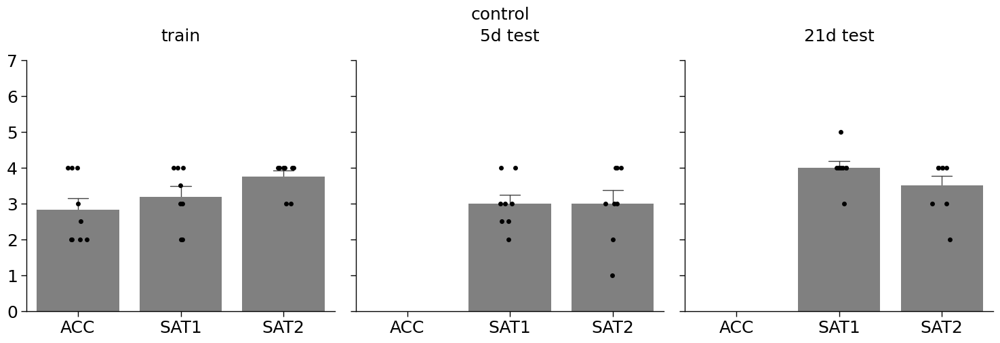

In [159]:
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
times = ['train', '5d test', '21d test']
g = plot_bar_strip(water_drank[water_drank['lesion'] == 'control'], 
                y='water drank (mL)', x='day', col='test_time',pt_color='k',connect=False,xlim=[-0.5, 2.5],
                errorbar='se', color='grey', err_kws={'lw':1, 'zorder':0}, capsize=0.2, ylim=[0, 7], jitter=True)
g.fig.suptitle('control', y=1.02)

#### (average, measured) droplet size is lower for contra lesioned animals, and was higher at 21d test for control animals

In [180]:
water_drank[water_drank['test_time'] == '5d test']

,Animal ID,animal,Sex,Strain,lesion,Cage,Date,Age,birth date,acc,droplet size,day,water drank (mL),calc droplet size (ul),trial no,test_time
92,PB713 retrain,PB713,M,C57,ipsi lesion,MASON,2024-04-13,51.0,2024-02-22,0.0,NaN,SAT1,4.0,5.747126,696.0,5d test
95,PB714 retrain,PB714,M,C57,ipsi lesion,KOURTNEY,2024-04-13,51.0,2024-02-22,0.0,NaN,SAT1,NaN,0,552.0,5d test
98,PB715 retrain,PB715,M,C57,contra lesion,CHICAGO,2024-04-13,51.0,2024-02-22,0.0,7.4,SAT1,3.0,4.316547,695.0,5d test
103,PB726 retrain,PB726,F,C57,ipsi lesion,CHICAGO,2024-04-10,48.0,2024-02-22,0.0,6.3,SAT1,4.0,5.633803,710.0,5d test
106,PB727 retrain,PB727,F,C57,contra lesion,SUSHI,2024-04-12,50.0,2024-02-22,0.0,5.2,SAT1,3.0,3.846154,780.0,5d test
109,PB728 retrain,PB728,F,C57,sham lesion,KOURTNEY,2024-04-17,55.0,2024-02-22,0.0,NaN,SAT1,NaN,0,742.0,5d test
114,PNL5 retrain,PNL5,F,.1-3/sscre,control,DREAM,2024-02-19,50.0,2023-12-31,0.0,NaN,SAT1,3.0,2.553191,1175.0,5d test
120,PNL7 retrain,PNL7,M,.1-3/sscre,control,KOURTNEY,2024-02-19,50.0,2023-12-31,0.0,NaN,SAT1,3.0,1.974984,1519.0,5d test
123,PNL8 retrain,PNL8,M,.1-3/sscre,control,CAITLYN,2024-02-19,50.0,2023-12-31,0.0,NaN,SAT1,2.5,2.50501,998.0,5d test
127,PPX1 retrain,PPX1,M,C57,control,DREAM,2024-03-01,42.0,2024-01-19,0.0,NaN,SAT1,2.5,2.06441,1211.0,5d test


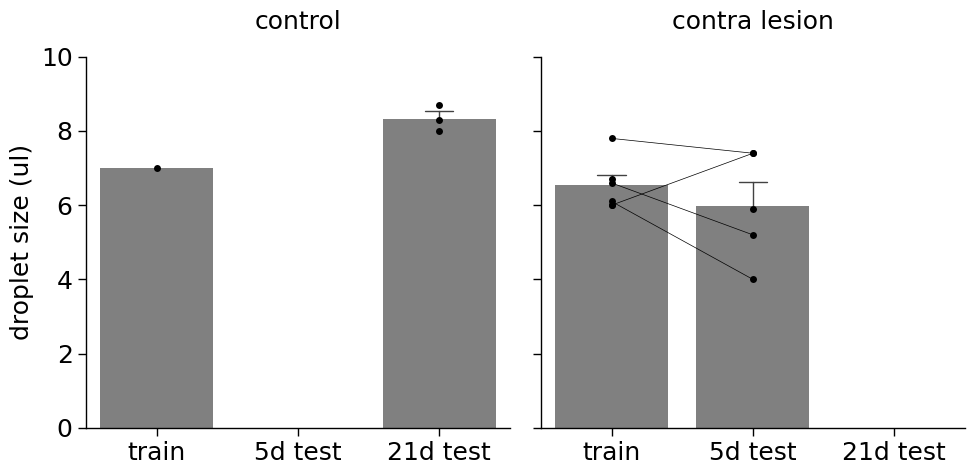

In [178]:
g = plot_bar_strip(water_drank[water_drank['day'] == 'SAT2'], x='test_time', 
                   y='droplet size', col='lesion',col_order=['control', 'contra lesion'],
                   order=['train', '5d test', '21d test'], xlim=[-0.5, 2.5],
                   errorbar='se', color='grey', err_kws={'lw':1, 'zorder':0}, capsize=0.2,
                   ylabel='droplet size (ul)', pt_color='black', jitter=False, connect=True)

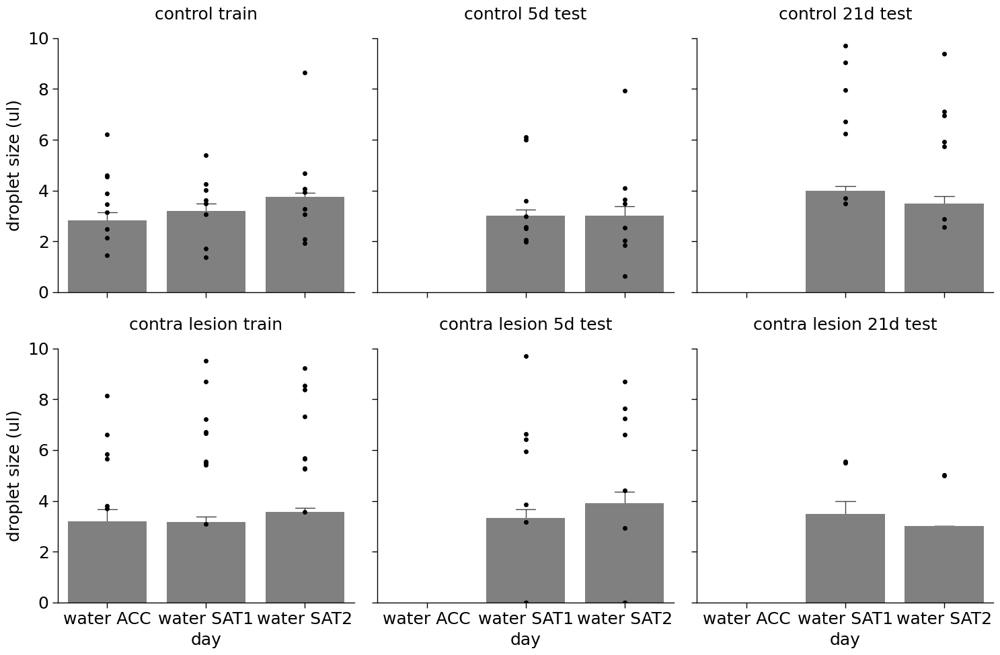

In [38]:
o = ['train', 'retrain', 'test']
g = sns.catplot(plt_water_drank, x='day', y='water drank (mL)', row='lesion',col='test_time',col_order=['train', 'retrain', 'test'],
    errorbar='se', color='grey', err_kws={'lw':1, 'zorder':0}, capsize=0.2,kind='bar', row_order=['no', 'contra'])
for (row, col), ax in g.axes_dict.items():
     sns.stripplot(plt_water_drank[(plt_water_drank['test_time'] == col) &(plt_water_drank['lesion']==row)],  ax=g.axes_dict[(row,col)], x='day', color='k', y='calc droplet size (ul)', dodge=False, jitter=False)
     ax.set_ylim([0, 10])
     ax.set_ylabel('droplet size (ul)')
     rows = {'no':'control', 'contra':'contra lesion', 'sham':'sham lesion'}
     cols = {'train':'train', 'retrain':'5d test', 'test':'21d test'}
     ax.set_title(f'{rows[row]} {cols[col]}')
     segs1 = []
     cdfilt = plt_water_drank[(plt_water_drank['test_time'] == col) & (plt_water_drank['lesion']==row)]
     for a in cdfilt["animal"].unique():
          anfilt = cdfilt[cdfilt["animal"] == a]
          pts = []
          for j in range(len(o)):
               op = list(anfilt[(anfilt["day"] == o[j])]["droplet size"])
               if (len(op) != 0):
                    pts.append([j, op[0]])
          if(len(pts) != 0):
               segs1.append(pts)
     linesegs = LineCollection(segs1,color='k', lw=0.5, zorder=1)
     g.axes_dict[(row, col)].add_collection(linesegs)

#### Measured droplet size is negatively correlated with trial number

In [135]:
tot = tot.set_index('an')
water_drank_data = water_drank_data.set_index('Animal ID')
tot.loc[((tot['cond'].str.contains(' lesion')) | (tot['cond'] == 'control')), 'droplet size'] = water_drank_data['droplet size'].dropna()
tot = tot.reset_index()
water_drank_data = water_drank_data.reset_index()
tot['droplet size'].unique()

array([nan, 7.4, 5.2, 5.9, 4. , 5.5, 8.6, 6. , 5.4, 8. , 7.8, 6.7, 6.6,
       6.1, 4.8, 8.7, 7.2, 8.3, 7. , 6.3, 7.3, 5.3])

In [138]:
def lin(x, b, a):
    return a*x + b

def inv(x, b, a):
    return a/x + b

slope: -137.657, y-int: 2071.497,R:-0.42245, pval:0.025



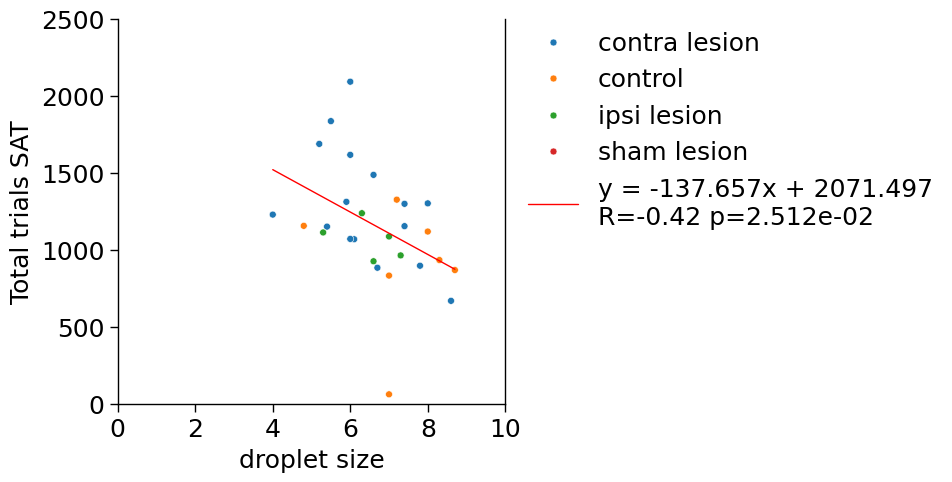

In [142]:
f, ax = plt.subplots(1,1, figsize=(5,5))
regress = tot[((tot['cond'].str.contains(' lesion')) | (tot['cond'] == 'control'))].dropna().sort_values('droplet size')

xdata = regress['droplet size']
ydata = regress['trial no']
res = stats.linregress(xdata, y=ydata)
popt = (res.intercept, res.slope)
sns.scatterplot(tot[((tot['cond'].str.contains(' lesion')) | (tot['cond'] == 'control'))], x='droplet size',y='trial no', hue='cond', ax=ax, legend=True)
ax.plot(xdata, lin(xdata, *popt), 'r-', lw=1, label='y = %5.3fx + %5.3f\nR=%1.2f p=%1.3e' % (res.slope, res.intercept, res.rvalue, res.pvalue))
ax.set_xlabel('droplet size')
ax.set_ylabel('Total trials SAT')
ax.get_legend().set_visible(False)
ax.set_ylim([0, 2500])
ax.set_xlim([0, 10])
f.legend(loc='upper right', bbox_to_anchor=(1.8, 0.9))
print('slope: %5.3f, y-int: %5.3f,R:%1.5f, pval:%1.3f\n' % (res.slope, res.intercept,res.rvalue, res.pvalue))




#### Measured droplet size and calculated droplet size (averaged across days) are almost positively correlated

slope: 0.568, y-int: 2.366,R:0.35686, pval:0.134



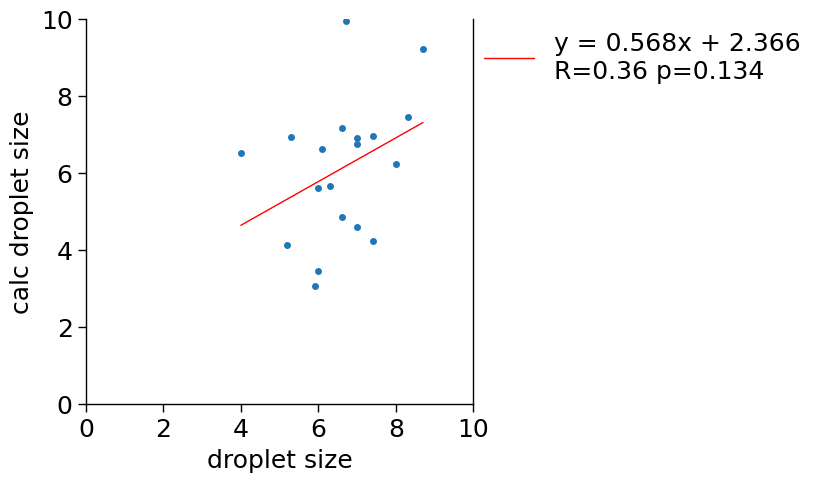

In [139]:
f, ax = plt.subplots(1,1, figsize=(5,5))

regress = water_drank.dropna()
regress = regress[~((regress['Animal ID'] == 'PB715 train'))]
regress = regress.groupby(['Animal ID', 'lesion'])[['calc droplet size (ul)', 'droplet size']].mean().reset_index()
regress = regress.sort_values('droplet size')
ydata = regress['calc droplet size (ul)']
xdata = regress['droplet size']
res = stats.linregress(xdata.astype(float), y=ydata.astype(float))
popt = (res.intercept, res.slope)
ax.plot(xdata, ydata, marker='o', ls='')
ax.plot(xdata, lin(xdata, *popt), 'r-', lw=1, label='y = %5.3fx + %5.3f\nR=%1.2f p=%1.3f' % (res.slope, res.intercept, res.rvalue, res.pvalue))
ax.set_xlabel('droplet size')
ax.set_ylabel('calc droplet size')
#ax.get_legend().set_visible(False)
ax.set_ylim([0, 10])
ax.set_xlim([0, 10])
f.legend(loc='upper right', bbox_to_anchor=(1.6, 0.9))
print('slope: %5.3f, y-int: %5.3f,R:%1.5f, pval:%1.3f\n' % (res.slope, res.intercept,res.rvalue, res.pvalue))

#### heatmap by animal

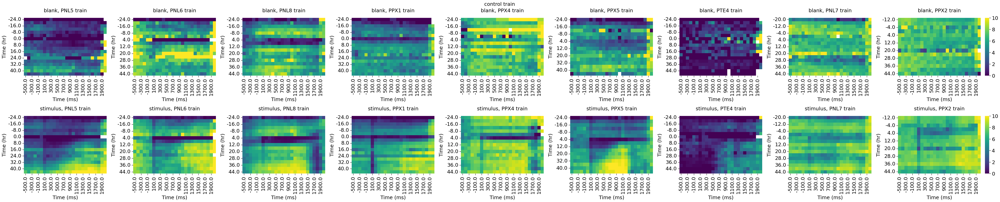

In [ ]:
heatmap_data = means_full[(means_full['Time (hr)'] >= -24) & (means_full['Time (hr)'] <= 48)]#.groupby(['condition', 'Time (hr)', 'Time (ms)', 'stimulus'])['lick'].mean().reset_index()
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])
conds = ['control train'] #['control train','contra lesion train', 'ipsi lesion train', 'SAT5', 'Contra-lesion', 'Ipsi-lesion',]
for c in conds:
    plt_data = heatmap_data[(heatmap_data['Time (ms)'] >=-500) &(heatmap_data['Time (ms)'] <= 2000) & (heatmap_data['condition'] == c) & (heatmap_data['animal'] != 'PTE3 train')]
    fg = draw_facet(plt_data, 
                            htmp_args,draw_heatmap, col='animal',cmap='viridis', row='stimulus', vmin=0, vmax=10)
    fg.suptitle(c, y=1.01)
#fg = draw_facet_heatmap(heatmap_data[(heatmap_data['stimulus'] == 'blank') &(heatmap_data['Time (ms)'] <= 2000)], htmp_args, col='condition', cmap='viridis', vmin=0, vmax=10)
#fg.suptitle('blank', y=1.01)

#### baseline

In [ ]:
baseline = means_full[(means_full['Time (ms)'] <= 0) & (means_full['Time (ms)'] >= -300)].groupby(['cond', 'test_time', 'animal', 'Time (hr)', 'stimulus'])['lick'].mean()
norm_filtmeans = means_full.pivot(index=['cond', 'test_time', 'animal', 'Time (hr)','stimulus'], columns='Time (ms)', values='lick').sub(baseline, axis=0)
norm_filtmeans = norm_filtmeans.stack().rename('lick').reset_index()

In [ ]:
plt_base = baseline.reset_index()
acc_baseline = plt_base[(plt_base['Time (hr)'] >= -12) & (plt_base['Time (hr)'] <= -4)].groupby(['cond', 'test_time', 'animal', 'stimulus'])['lick'].mean().rename('baseline')
acc_baseline

cond           test_time  animal       stimulus
contra lesion  train      PB716 train  blank       7.014319
                                       stimulus    7.059326
                          PB727 train  blank       5.882448
                                       stimulus    4.766163
                          PPX3 train   blank       6.287037
                                       stimulus    4.918959
                          PPX6 train   blank       7.628968
                                       stimulus    6.396500
                          PTE1 train   blank       5.206627
                                       stimulus    4.381102
                          PTE2 train   blank       8.028846
                                       stimulus    6.084952
                          PTE5 train   blank       3.416250
                                       stimulus    3.941665
                          PTE6 train   blank       7.231166
                                       stimulus    7

In [ ]:
fill_data =  plt_base[(plt_base['Time (hr)'] >= 0) & (plt_base['Time (hr)'] <= 48)].pivot(index=['condition', 'animal', 'stimulus'], columns='Time (hr)', values='lick').fillna(method='bfill', axis=1)
anova_data = pd.concat([acc_baseline, fill_data], axis=1).stack().reset_index().rename(columns={'level_3':'Time (hr)', 0:'lick'})
anova_data['Time (hr)'] = anova_data['Time (hr)'].astype(str)
#anova_data = plt_base[(plt_base['Time (hr)'] >= 0) & (plt_base['Time (hr)'] <= 48)]
aov = pg.mixed_anova(data=anova_data[anova_data['stimulus'] =='stimulus'], dv='lick', between='condition', within='Time (hr)', subject='animal')
print('stimulus')
pg.print_table(aov)
print('blank')
aov = pg.mixed_anova(data=anova_data[anova_data['stimulus'] =='blank'], dv='lick', between='condition', within='Time (hr)', subject='animal')
pg.print_table(aov)

In [ ]:
for cond in anova_data['condition'].unique():
    if cond in ['Contra-lesion', 'Ipsi-lesion', 'SAT 5', 'contra lesion train', 'control train']:
        print(cond)
        print('stimulus')
        aov = pg.rm_anova(data=anova_data[(anova_data['condition'] == cond) & (anova_data['stimulus'] == 'stimulus')], 
                        dv='lick', within=['Time (hr)'], subject='animal')
        pg.print_table(aov)
        res = pg.pairwise_tests(data=anova_data[(anova_data['condition'] == cond) & (anova_data['stimulus'] == 'stimulus')], dv='lick', within='Time (hr)', subject='animal', parametric=False)
        pg.print_table(res[res['p-unc'] <= 0.05])
        print('blank')
        aov = pg.rm_anova(data=anova_data[(anova_data['condition'] == cond) & (anova_data['stimulus'] == 'blank')], 
                        dv='lick', within=['Time (hr)'], subject='animal')
        pg.print_table(aov)
        res = pg.pairwise_tests(data=anova_data[(anova_data['condition'] == cond) & (anova_data['stimulus'] == 'blank')], dv='lick', within='Time (hr)', subject='animal', parametric=False)
        pg.print_table(res[res['p-unc'] <= 0.05])



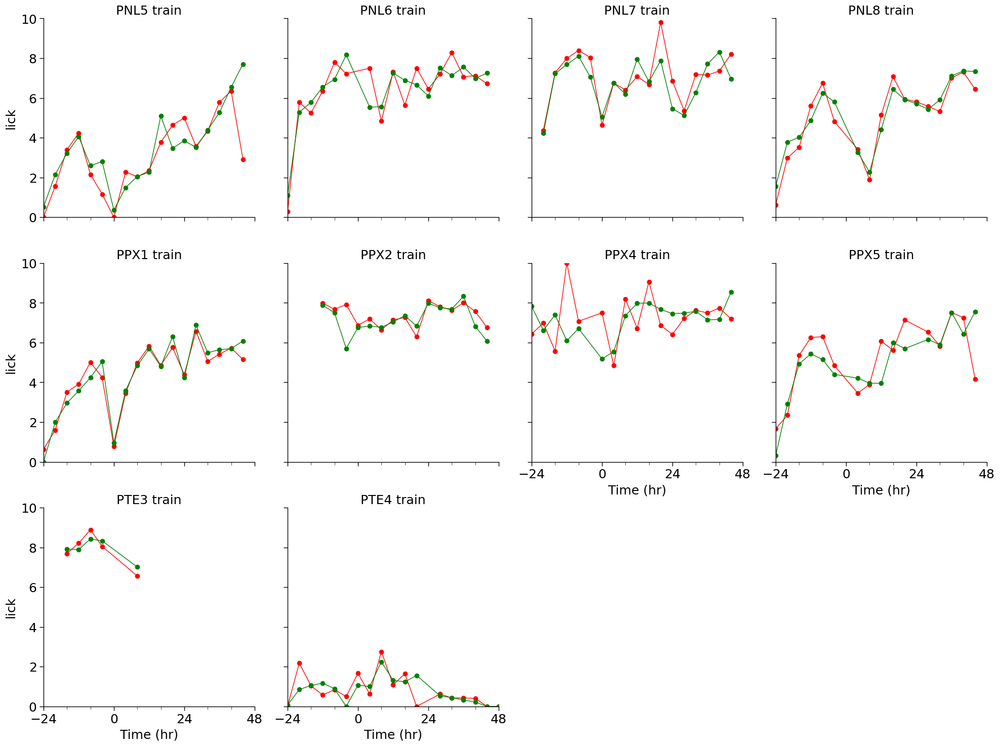

In [ ]:
#c = (plt_base['condition'] == 'contra lesion train') | (plt_base['condition'] == 'ipsi lesion train') | (plt_base['condition'] == 'control train') | (plt_base['condition'] == 'sham lesion train')
c = (plt_base['cond'] == 'control') & (plt_base['test_time'] == 'train')
cod = ['contra lesion train', 'ipsi lesion train', 'sham lesion train', 'control train']
g = sns.relplot(plt_base[c], x='Time (hr)', y='lick', hue='stimulus', 
            col='animal', hue_order=['blank', 'stimulus'], palette=['red', 'green'],#col_order=cod,
            kind='line', errorbar='se', err_style='bars', marker='o', ls='-', mec=None, ms=7, lw=1,col_wrap=4,
            err_kws={'lw':0.7}, legend=False)
markers=['o', 'v', '^', '<', '>', '8', 's', 'p', 'P', '*', 'h', 'X', 'D']
for name, ax in g.axes_dict.items():
#    tmp = plt_base[plt_base['condition']==name]
#    i=0
#    for a in tmp['animal'].unique():
#        sns.lineplot(plt_base[plt_base['animal']==a],x='Time (hr)', y='lick', hue='stimulus', palette=['#FFBDBD', '#C6FFBD'],
#                    marker=markers[i], ls='-', mec=None, ms=5, lw=1,legend=False, ax=ax, zorder=0)
#        i+=1
    ax.set_title(f'{name}', y=0.95)
    ax.set_xlim([-24, 48])
    ax.set_ylim([0, 10])
    ax.xaxis.set_major_locator(ticker.MultipleLocator(24))
    ax.xaxis.set_minor_locator(ticker.MultipleLocator(8))
plt.tight_layout()

In [ ]:
norm_filtmeans

,condition,animal,Time (hr),stimulus,Time (ms),lick
0,contra lesion retrain,PB715 retrain,0.0,blank,-800.0,-6.428571
1,contra lesion retrain,PB715 retrain,0.0,blank,-700.0,-1.428571
2,contra lesion retrain,PB715 retrain,0.0,blank,-600.0,-3.095238
3,contra lesion retrain,PB715 retrain,0.0,blank,-500.0,1.071429
4,contra lesion retrain,PB715 retrain,0.0,blank,-400.0,1.071429
...,...,...,...,...,...,...
83292,sham lesion train,PWH9 train,48.0,stimulus,6300.0,5.939552
83293,sham lesion train,PWH9 train,48.0,stimulus,6400.0,5.939552
83294,sham lesion train,PWH9 train,48.0,stimulus,6500.0,-4.060448
83295,sham lesion train,PWH9 train,48.0,stimulus,6600.0,-4.060448


Text(0.5, 1.01, 'blank normalized to baseline')

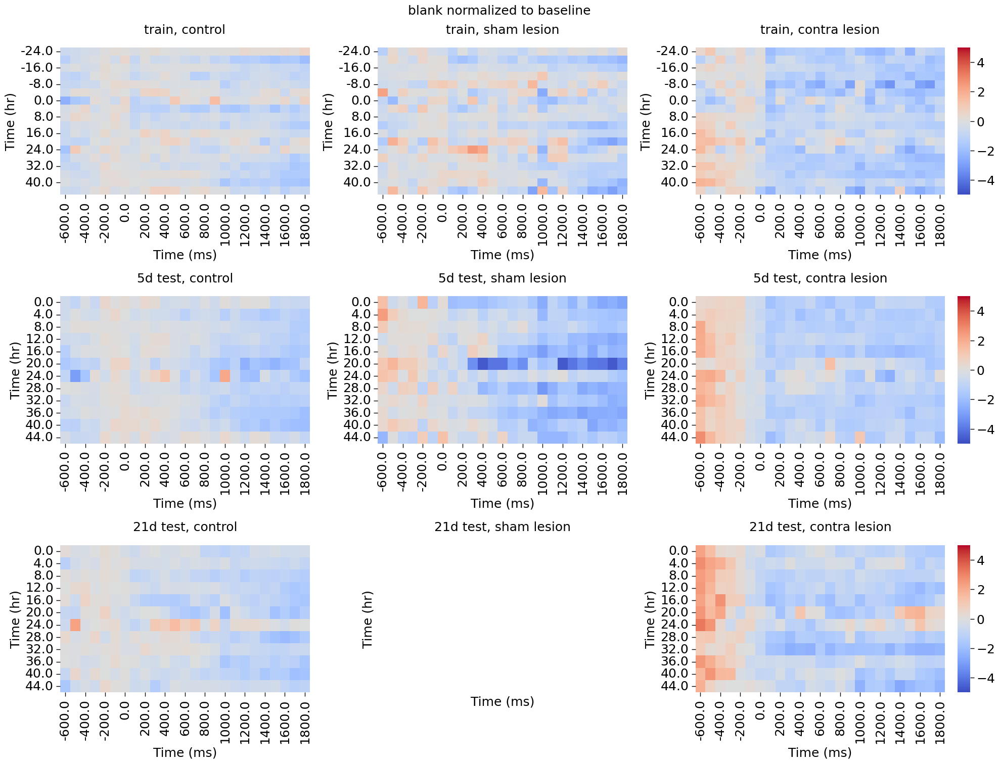

In [ ]:
heatmap_data = norm_filtmeans[(norm_filtmeans['Time (hr)'] >= -24) & (norm_filtmeans['Time (hr)'] < 48)].groupby(['cond','test_time', 'Time (hr)', 'Time (ms)', 'stimulus'])['lick'].mean().reset_index()
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])
conds = ['control', 'sham lesion', 'contra lesion']
fg = draw_facet(heatmap_data[(heatmap_data.apply(lambda x: x['cond'] in conds, axis=1)) & (heatmap_data['Time (ms)'] > -700) & (heatmap_data['Time (ms)'] <= 1800)
                             &(heatmap_data['stimulus'] =='blank')], 
                        htmp_args,draw_heatmap, row='test_time', col='cond', cmap='coolwarm', 
                        col_order=['control', 'sham lesion', 'contra lesion'],
                        row_order=['train', '5d test', '21d test'],
                        vmin=-5, vmax=5)
# fg.suptitle('MZ contra lesion norm to baseline', y=1.01)
# fg = draw_facet_heatmap(heatmap_data[(heatmap_data['condition'] == 'Ipsi-lesion') & (heatmap_data['Time (ms)'] > -200) & (heatmap_data['Time (ms)'] <= 2000)], 
#                         htmp_args, col='stimulus', cmap='coolwarm', vmin=-5, vmax=5)
fg.suptitle('blank normalized to baseline', y=1.01)

Text(0.5, 1.01, 'train norm to baseline')

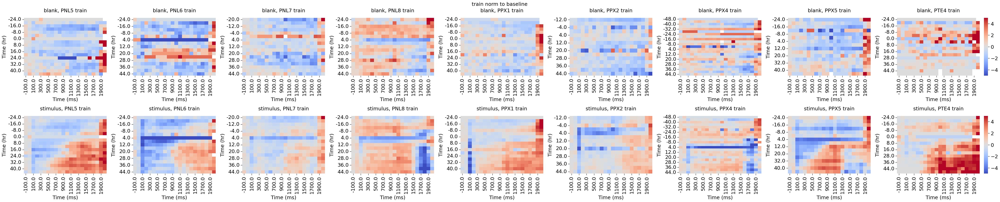

In [ ]:
#heatmap_data['animal']  = heatmap_data['animal'].str.rstrip('retains').str.rstrip(' ')
c = (norm_filtmeans['cond'] == 'control') & (norm_filtmeans['Time (ms)'] > -200) & (norm_filtmeans['Time (ms)'] <= 2000)
fg = draw_facet(norm_filtmeans[c & (norm_filtmeans['test_time'] =='train') & (norm_filtmeans['animal'] != 'PTE3 train')], 
                                htmp_args, draw_heatmap,col='animal',row='stimulus', cmap='coolwarm', 
                                vmin=-5, vmax=5)
fg.suptitle('train norm to baseline', y=1.01)

# #fg = draw_facet_heatmap(heatmap_data[c & (heatmap_data['time'] =='retrain')], 
#                                 htmp_args, col='animal', row='stimulus',cmap='coolwarm', 
#                                 vmin=-5, vmax=5)
# fg.suptitle('retrain norm to baseline', y=1.01)

In [ ]:
heatmap_data = norm_filtmeans[(norm_filtmeans['Time (hr)'] >= -24) & (filtmeans['Time (hr)'] <= 48)]#.groupby(['cond', 'time', 'Time (hr)', 'Time (ms)', 'stimulus'])['lick'].mean().reset_index()
heatmap_data = heatmap_data.sort_values(['Time (hr)', 'Time (ms)'])
for c in heatmap_data['cond'].unique():
    if c == 'contra lesion':
        c = (heatmap_data['cond'] == c) & (heatmap_data['Time (ms)'] > -200) & (heatmap_data['Time (ms)'] <= 2000)
        fg = draw_facet_heatmap(heatmap_data[(heatmap_data['stimulus'] == 'stimulus') & c], 
                                htmp_args,row='time', col='animal', cmap='coolwarm', vmin=-5, vmax=5)
        fg.suptitle('stimulus norm to baseline', y=1.01)
        fg = draw_facet_heatmap(heatmap_data[(heatmap_data['stimulus'] == 'blank') & c], 
                                htmp_args,row='time', col='animal', cmap='coolwarm', vmin=-5, vmax=5)
        fg.suptitle('blank norm to baseline', y=1.01)

#### instentanteous lick freq by hour

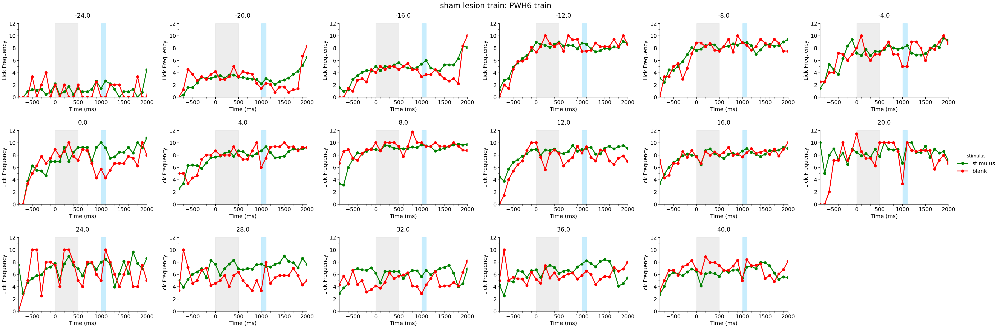

In [102]:
for c in means_full['condition'].unique():
    #if 'contra lesion train' in c:
        for a in means_full[(means_full['condition'] == c)]['animal'].unique():
            if a == 'PWH6 train':
                plot_lickfreq(means_full[(means_full['animal'] == a)], suptitle=f'{c}: {a}',
                            col_wrap=6,errorbar='se', err_style='bars', err_kws={'lw':0.7}, xlim=[-800, 2000])

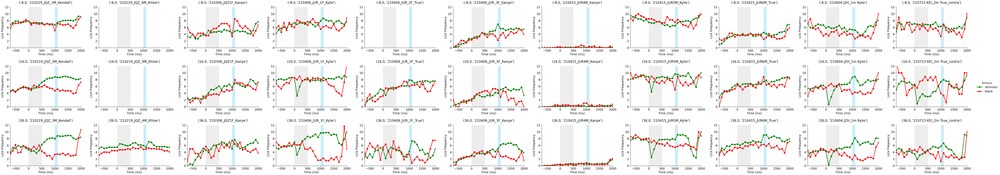

In [136]:
conds = ['Mo Contra-lesion']#, 'Mo Contra-lesion', 'ipsi lesion', 'Mo Ipsi-lesion']#, 'ipsi lesion']


#for c in means_full['condition'].unique():
#    if ' train' in c:
plot_lickfreq(means_full[(means_full.apply(lambda x: x['cond'] in conds, axis=1)) &
                        ((means_full['Time (hr)'] == -8) | (means_full['Time (hr)'] == 16) | (means_full['Time (hr)'] == 36)) #|(means_full['Time (hr)'] == 44)) 
                        & (means_full['test_time'] == 'train')
                        ], #col_order=['contra lesion', 'Mo Contra-lesion', 'ipsi lesion', 'Mo Ipsi-lesion'],
                        suptitle=None, col='animal', col_wrap=None, row='Time (hr)',errorbar='se', err_style='bars', err_kws={'lw':0.7}, xlim=[-700, 2000])

In [ ]:
cond1 = means_subset[(means_subset['stimulus'] == 'blank') & (means_subset['time (ms) group'] == 'consummatory') 
           & (means_subset['time (hr) group'] == 'SAT2') & (means_subset['test_time'] == 'train') 
           & (means_subset['cond'] == 'control')]['lick']
cond2 = means_subset[(means_subset['stimulus'] == 'blank') & (means_subset['time (ms) group'] == 'consummatory') 
           & (means_subset['time (hr) group'] == 'SAT2') & (means_subset['test_time'] == 'train') 
           & (means_subset['cond'] == 'contra lesion')]['lick']

stats.mannwhitneyu(cond1, cond2)

MannwhitneyuResult(statistic=69.0, pvalue=0.055013832353979004)

### anticipatory lick frequency

In [169]:
ant_means['Time (hr)'] = ant_means['Time (hr)'] + 2
ant_perf['Time (hr)'] = ant_perf['Time (hr)'] + 2
trials['Time (hr)'] = trials['Time (hr)'] + 2

In [170]:
# sum number of stimulus and blank trials together
tots = sum_trials(trials, ['condition', 'animal', 'Time (hr)'], ['Age','Strain', 'Date', 'Cage'], "trial no")

#### anticipatory lick frequency by animal

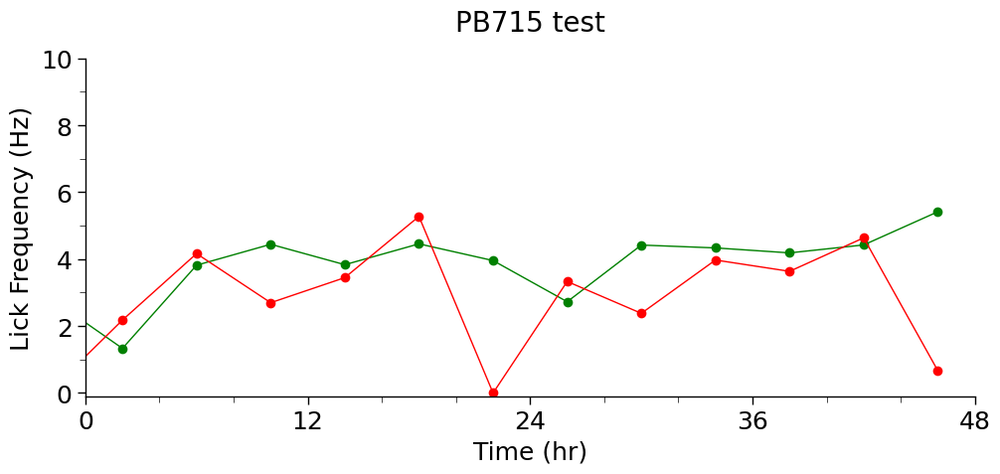

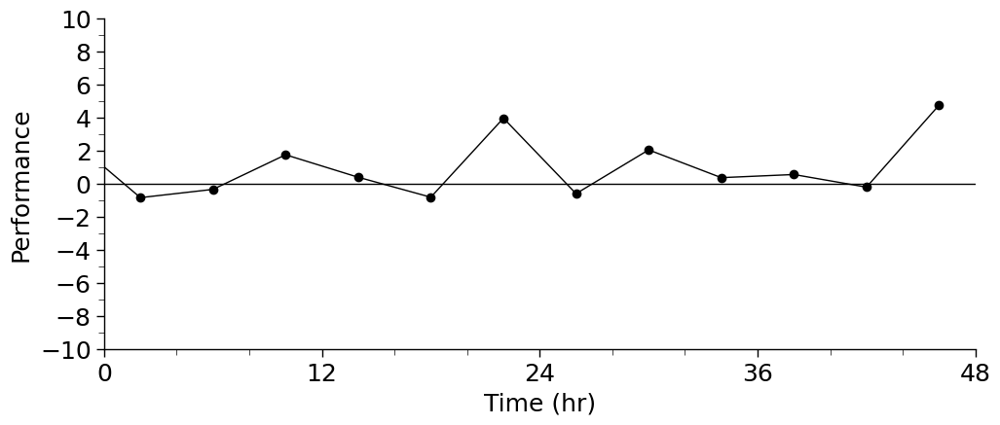

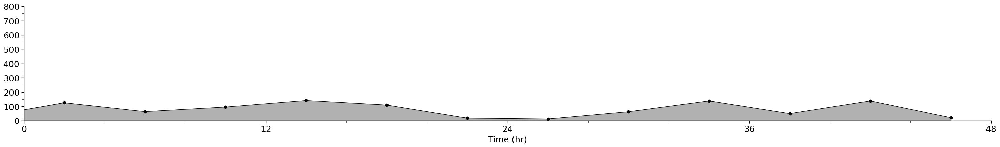

In [31]:
xlim=[0, 48]
for c in ant_means['condition'].unique():
    #if 'contra lesion test' in c:
    tmp = ant_means[ant_means['condition'] == c]
    for a in tmp["animal"].unique():          
        if 'PB715 test' in a:
                g = plot_ant_lickfreq(ant_means[(ant_means["animal"] == a)],y='lick',aspect=2,lw=1, ms=7, title=a,
                        legend=False, xlim=xlim, ylim=[-0.1, 10], errorbar='se', err_style='bars', err_kws={"lw":0.5})
                # g.axes[0][0].add_patch(Rectangle((48, -0.1), 120, 10 - (-0.1), color="#D0D0D0", alpha=0.5, 
                #                 zorder=0, fill=True))
                g = plot_ant_perf(ant_perf[(ant_perf["animal"] == a)], ylabel="Performance", aspect=2,lw=1, ms=7,
                                xlim=xlim, legend=False, ylim=[-10, 10], title='',errorbar='se', err_style='bars', err_kws={"lw":0.5})
                # g.axes[0][0].add_patch(Rectangle((48, -10), 120, 20, color="#D0D0D0", alpha=0.5, 
                #                 zorder=0, fill=True))
                g = plot_trial_hr(tots[(tots["animal"] == a)], xlim=xlim, 
                                ylim=[0, 800], aspect=6, title='', ms=7, lw=1,err_kws={"lw":0.5}, ylabel='')
                # g.axes[0][0].add_patch(Rectangle((48, 0), 120, 800, color="#D0D0D0", alpha=0.5, 
                #                 zorder=0, fill=True))
#g.figure.suptitle(c, y=1.05, x=0.5, fontsize=25)

### last and first 20% of trials

In [18]:
data_path = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\behavior_data\\analyzed\\'
cols =  ['condition', 'animal', 'Strain', 'Age', 'Cage','Date', 'Day', 'Time (hr)', 'lick']
conds = ['eunsol', 'dcz', 'joe', 'retrain', 'lesion']
last20_perf = load_data(data_path, 'last20', 'performance', conds, dtype_map, cols)
format_all(last20_perf)
last20_perf

,condition,animal,Strain,Age,Cage,Date,Day,Time (hr),lick,cond,test_time
0,100ACC80ACC,PNL1,.1-3 x SSTcre,27.0,PIPLUP,u,-2.0,-36.0,0.487734,100ACC80ACC,train
1,100ACC80ACC,PNL1,.1-3 x SSTcre,27.0,PIPLUP,u,-1.0,-12.0,0.060838,100ACC80ACC,train
2,100ACC80ACC,PNL1,.1-3 x SSTcre,27.0,PIPLUP,u,0.0,12.0,0.063706,100ACC80ACC,train
3,100ACC80ACC,PNL2,.1-3 x SSTcre,27.0,SUSHI,u,-2.0,-36.0,-1.204082,100ACC80ACC,train
4,100ACC80ACC,PNL2,.1-3 x SSTcre,27.0,SUSHI,u,-1.0,-12.0,-2.216425,100ACC80ACC,train
...,...,...,...,...,...,...,...,...,...,...,...
135,Mo Ipsi-lesion,210716_KEI_3F Kanye_ipsi,u,u,KANYE,210716,1.0,40.0,0.011137,Mo Ipsi-lesion,train
136,Mo Ipsi-lesion,210716_KEI_3F Kanye_ipsi,u,u,KANYE,210716,2.0,64.0,0.198413,Mo Ipsi-lesion,train
137,Mo Ipsi-lesion,210716_KEI_3F Kanye_ipsi,u,u,KANYE,210716,3.0,88.0,-0.022282,Mo Ipsi-lesion,train
138,Mo Ipsi-lesion,210716_KEI_3F Kanye_ipsi,u,u,KANYE,210716,4.0,112.0,2.473389,Mo Ipsi-lesion,train


In [56]:
data_path = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\behavior_data\\analyzed\\'
cols =  ['condition', 'animal', 'Strain', 'Age', 'Cage','Date', 'Day','stimulus', 'water', 'type', 'Time (hr)', 'lick', 'day_delta', 'trial no', 'delta']
conds = ['eunsol', 'dcz', 'joe', 'retrain', 'lesion']
ant_data = load_data(data_path, 'anticipatory', 'data', conds, dtype_map, cols)
last20_data = load_data(data_path, 'last20', 'data', ['retrain'], dtype_map, cols)

C:\Users\swind\AppData\Local\Temp\ipykernel_38860\1146329409.py:5: DtypeWarning: Columns (2,4) have mixed types. Specify dtype option on import or set low_memory=False.
  o_data = pd.read_csv(path + cond + '\\' + data_type + '_' + cond + '_' + data_name + '.txt', dtype=dtype_map)


In [20]:
keys = {
        "millis bin":None,
        "Time (ms)":"Time (ms)",
        "stimulus type":"stimulus",
        "water delivery":"water",
        "trial no":"trial no",
        "time bin":"day_delta",
        "licks":"lick",
        "timestamp":"timestamp",
        "delay":"delay",
        "acc":"acc",
        'offset':'offset'
    }

In [21]:
first20 = get_nth_part_day(ant_data, 5, 1)
keep = ['Strain', 'Age', 'Cage','Date', 'Day', 'trial no', 'stimulus', 'water', 'type', 'Time (hr)']
first20_means, first20_counts, first20_perf = agg(first20, keys, ['condition', 'animal'], keep, ['lick'])

format_all(first20_means)
format_all(first20_perf)
first20_means

,condition,animal,day_delta,stimulus,lick,Strain,Age,Cage,Date,Day,trial no,type,Time (hr),water,cond,test_time
0,0.1 mg DCZ hm4di,OHQ3,-1 days,blank,4.166667,SSTcre,28.0,CHICAGO,u,-1.0,369,no water & blank,-24.0,no water,hM4Di + DCZ,train
1,0.1 mg DCZ hm4di,OHQ3,-1 days,stimulus,3.625731,SSTcre,28.0,CHICAGO,u,-1.0,366,water & stimulus,-24.0,water,hM4Di + DCZ,train
2,0.1 mg DCZ hm4di,OHQ3,-2 days,blank,6.666667,SSTcre,28.0,CHICAGO,u,-2.0,3,no water & blank,-48.0,no water,hM4Di + DCZ,train
3,0.1 mg DCZ hm4di,OHQ3,-2 days,stimulus,4.210526,SSTcre,28.0,CHICAGO,u,-2.0,1,water & stimulus,-48.0,water,hM4Di + DCZ,train
4,0.1 mg DCZ hm4di,OHQ3,0 days,blank,4.833333,SSTcre,28.0,CHICAGO,u,0.0,695,no water & blank,0.0,no water,hM4Di + DCZ,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1827,sham lesion train,PWH9 train,0 days,stimulus,2.088889,C57,40.0,PIPLUP,2024-04-23,0.0,386,water & stimulus,0.0,water,sham lesion,train
1828,sham lesion train,PWH9 train,1 days,blank,3.076923,C57,40.0,PIPLUP,2024-04-23,1.0,857,no water & blank,24.0,no water,sham lesion,train
1829,sham lesion train,PWH9 train,1 days,stimulus,4.553991,C57,40.0,PIPLUP,2024-04-23,1.0,853,water & stimulus,24.0,water,sham lesion,train
1830,sham lesion train,PWH9 train,2 days,blank,0.000000,C57,40.0,PIPLUP,2024-04-23,2.0,1276,no water & blank,48.0,no water,sham lesion,train


In [22]:
first20_means['time'] = 'first 20%'
last20_means['time'] = 'last 20%'

first20_perf['time'] = 'first 20%'
last20_perf['time'] = 'last 20%'

firstlast20_means = pd.concat([first20_means, last20_means])
firstlast20_perf = pd.concat([first20_perf, last20_perf])

# drop times that are missing values
firstlast20_means = firstlast20_means.set_index(['animal', 'Day','time'])
firstlast20_means = firstlast20_means[firstlast20_means.groupby(['animal', 'Day', 'time']).count()['lick'] == 2]
firstlast20_means = firstlast20_means.reset_index()
firstlast20_perf = firstlast20_perf[~(firstlast20_perf['lick'].isna())]

In [23]:
firstlast20_means['Day_label'] = firstlast20_means["Day"].apply(day_to_label)
firstlast20_perf['Day_label'] = firstlast20_perf["Day"].apply(day_to_label)

firstlast20_means['daytime'] = firstlast20_means['Day_label'] + ' ' + firstlast20_means['time']
firstlast20_perf['daytime'] = firstlast20_perf['Day_label'] + ' ' + firstlast20_perf['time']

firstlast20_means['daytimetest'] = firstlast20_means['daytime'] + ' ' + firstlast20_means['test_time']
firstlast20_perf['daytimetest'] = firstlast20_perf['daytime'] + ' ' + firstlast20_perf['test_time']

In [145]:
firstlast20_perf[(firstlast20_perf.apply(lambda x: x['cond'] in conds, axis=1)) & (firstlast20_perf['daytimetest'] == days[0]) & (firstlast20_perf['lick'] > 2)][['cond', 'animal', 'lick']]

,cond,animal,lick
18,contra lesion,PTE1,3.765363
21,contra lesion,PTE2,3.954911
75,control,PNL5,2.124444
94,control,PPX4,2.281469
97,control,PPX5,2.847019
103,control,PTE4,2.658009
168,sham lesion,PWH4,2.413793


In [143]:
ans = firstlast20_perf[(firstlast20_perf.apply(lambda x: x['cond'] in conds, axis=1)) & (firstlast20_perf['daytimetest'] == days[0]) & (firstlast20_perf['lick'] > 2)]['animal']
ans = list(ans)

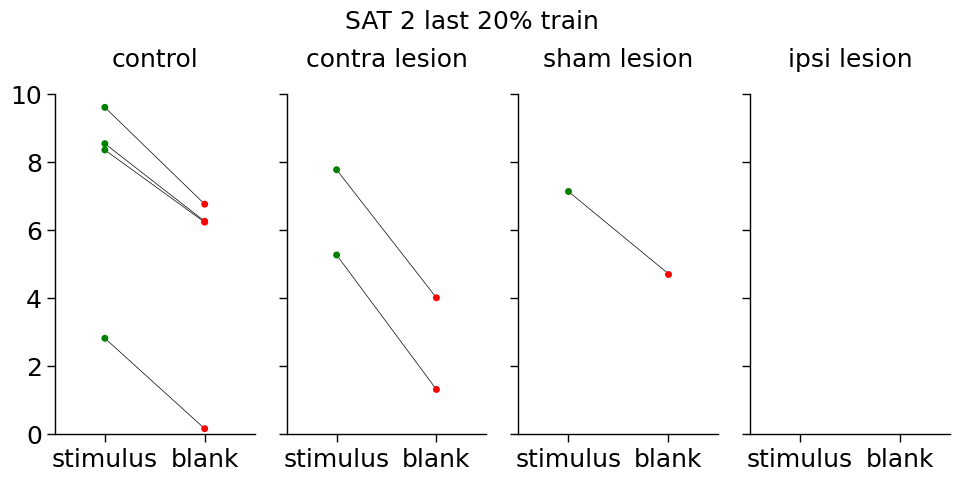

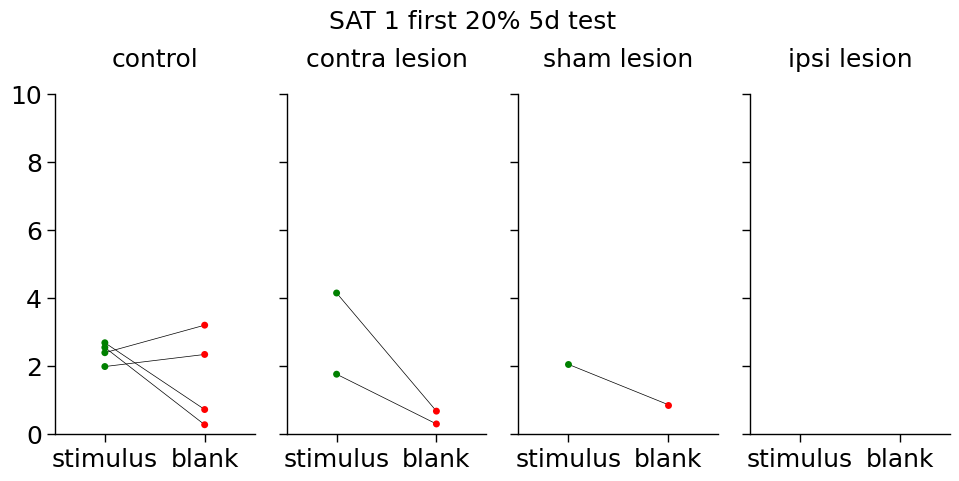

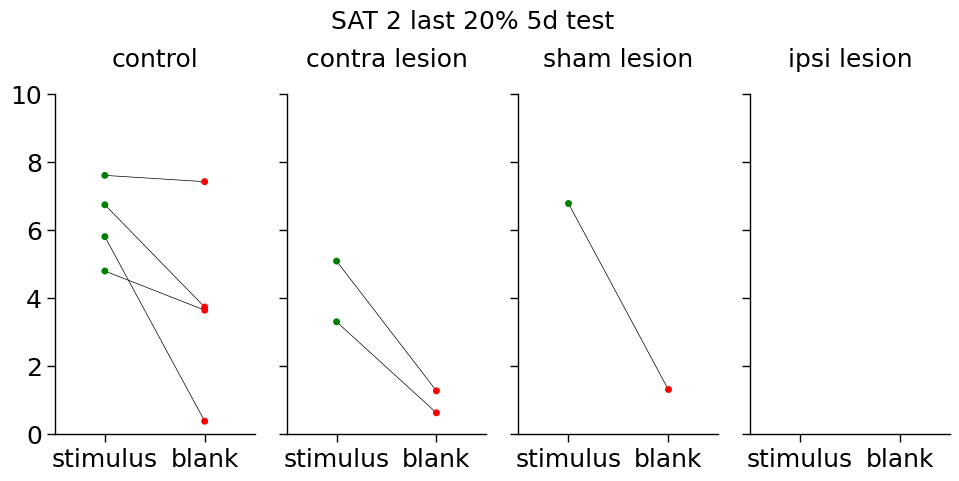

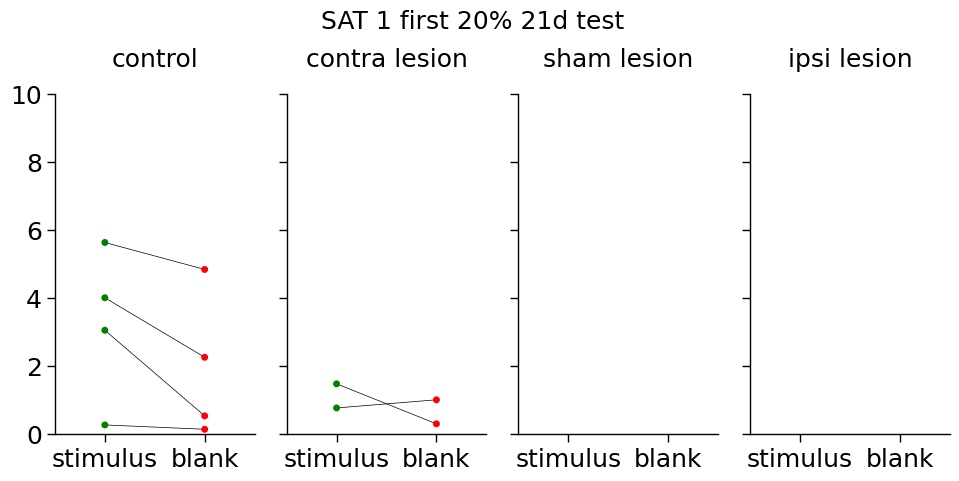

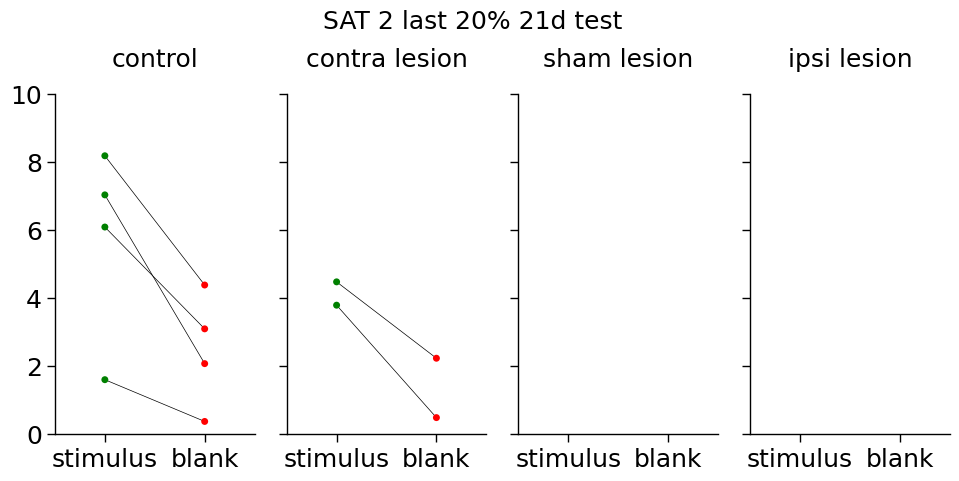

In [144]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
cdfilt = firstlast20_means[firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1) & firstlast20_means.apply(lambda x: x['animal'] in ans, axis=1)]

for day in days:
    dayfilt = cdfilt[cdfilt["daytimetest"] == day]
    g = plot_pair_strip(dayfilt, y="lick",x="stimulus", order=["stimulus", "blank"],
                        hue="stimulus", palette=["green", "red"], 
                        hue_order=["stimulus", "blank"],col_order=conds,
                        col="cond", jitter=False, aspect=0.5, legend=False, connect=True)
    g.fig.suptitle(day, y=1.03)

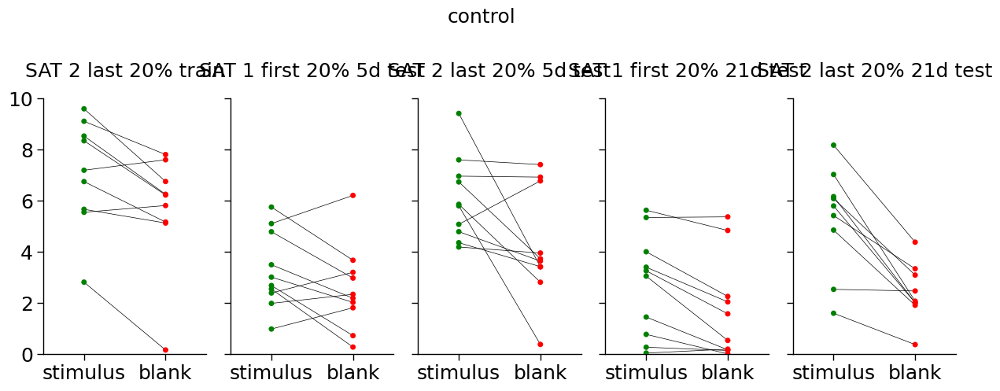

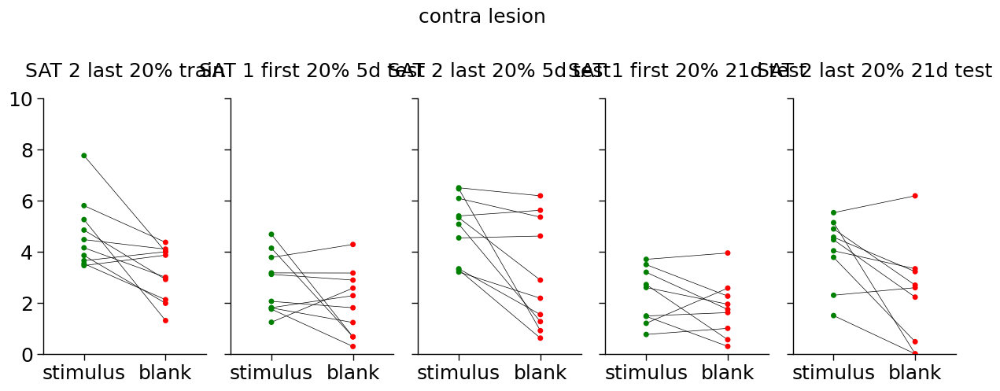

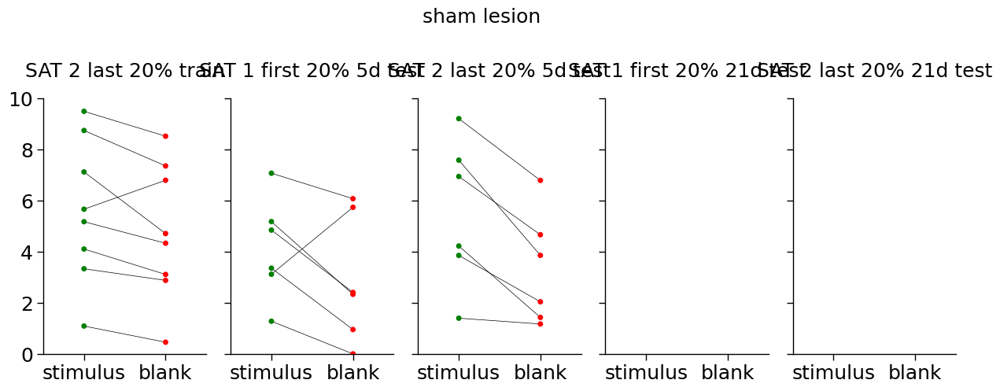

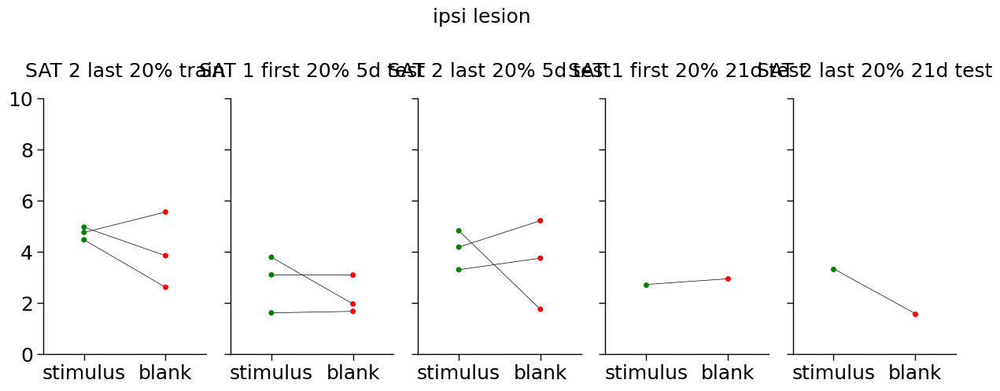

In [40]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
dayfilt = firstlast20_means[firstlast20_means.apply(lambda x: x['daytimetest'] in days, axis=1)]

for c in conds:
    cdfilt = dayfilt[dayfilt["cond"] == c]
    g = plot_pair_strip(cdfilt, y="lick",x="stimulus", order=["stimulus", "blank"],
                        hue="stimulus", palette=["green", "red"], 
                        hue_order=["stimulus", "blank"],col_order=days,
                        col="daytimetest", jitter=False, aspect=0.5, legend=False, connect=True)
    g.fig.suptitle(c, y=1)
    g.tight_layout()

In [25]:
res = []
firstlast20_means = firstlast20_means.sort_values(['condition', 'animal', 'daytimetest'])

stimcond = firstlast20_means["stimulus"] == "stimulus"
blankcond = firstlast20_means["stimulus"] == "blank"

conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
filt = (firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1)) & (firstlast20_means.apply(lambda x: x['daytimetest'] in days, axis=1))
ind = firstlast20_means[filt][["cond", "daytimetest"]].apply(tuple, axis=1).unique()

for c, day in ind:
    daycond = firstlast20_means["daytimetest"] == day
    ccond = firstlast20_means["cond"] == c
    #print(firstlast20_means[daycond])
    stim = firstlast20_means[stimcond & daycond & ccond]["lick"]
    san = firstlast20_means[stimcond & daycond & ccond][['animal',"lick"]]
    blank = firstlast20_means[blankcond & daycond & ccond]["lick"]
    ban = firstlast20_means[blankcond & daycond & ccond][['animal',"lick"]]
    #print(day, c,'stim', san,'blank', ban, '\n')
    res.append(stats.wilcoxon(stim, blank))

pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.Series(ind).apply(lambda x: x[0] + ", " + x[1]))

,statistic,pvalue
"contra lesion, SAT 1 first 20% 5d test",16.0,0.275391
"contra lesion, SAT 2 last 20% 5d test",3.0,0.009766
"contra lesion, SAT 1 first 20% 21d test",13.0,0.300781
"contra lesion, SAT 2 last 20% 21d test",3.0,0.019531
"contra lesion, SAT 2 last 20% train",4.0,0.013672
"control, SAT 1 first 20% 5d test",11.0,0.105469
"control, SAT 2 last 20% 5d test",6.0,0.027344
"control, SAT 1 first 20% 21d test",4.0,0.013672
"control, SAT 2 last 20% 21d test",0.0,0.003906
"control, SAT 2 last 20% train",6.0,0.013672


In [65]:
first20['time'] = 'first 20%'
last20_data['time'] = 'last 20%'
firstlast20 = pd.concat([first20, last20_data])
format_all(firstlast20)
firstlast20['Day_label'] = firstlast20["Day"].apply(day_to_label)
firstlast20['daytime'] = firstlast20['Day_label'] + ' ' + firstlast20['time']
firstlast20['daytimetest'] = firstlast20['daytime'] + ' ' + firstlast20['test_time']
firstlast20['animal'] = firstlast20['animal'].str.rstrip('reaints')

In [67]:
# first20
# last20_data
res = []
firstlast20 = firstlast20.sort_values(['condition', 'animal', 'daytimetest'])

stimcond = firstlast20["stimulus"] == "stimulus"
blankcond = firstlast20["stimulus"] == "blank"

conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
filt = (firstlast20.apply(lambda x: x['cond'] in conds, axis=1)) & (firstlast20.apply(lambda x: x['daytimetest'] in days, axis=1))
ind = firstlast20[filt][["cond", "animal", 'daytimetest']].apply(tuple, axis=1).unique()

for c, an, day in ind:
    daycond = firstlast20["daytimetest"] == day
    ccond = firstlast20["cond"] == c
    ancond = firstlast20['animal'] == an
    stim = firstlast20[stimcond & daycond & ccond & ancond]["lick"]
    blank = firstlast20[blankcond & daycond & ccond & ancond]["lick"]
    if len(stim) > 0 and len(blank) > 0:
        res.append(stats.mannwhitneyu(stim, blank))
    else:
        res.append((pd.NA, pd.NA))

out = pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.MultiIndex.from_tuples(ind))
out.to_clipboard()
out

statistic    pvalue
contra lesion PB715  SAT 1 first 20% 5d test    1505.5  0.423974
                     SAT 2 last 20% 5d test     1047.5  0.032301
              PB716  SAT 1 first 20% 5d test     494.5  0.713587
                     SAT 2 last 20% 5d test      463.5  0.670781
              PB727  SAT 1 first 20% 5d test    2918.0  0.000001
...                                                ...       ...
sham lesion   PWH4   SAT 2 last 20% train       1647.0  0.008515
              PWH5   SAT 2 last 20% train        891.0  0.475403
              PWH6   SAT 2 last 20% train        824.0  0.169672
              PWH7   SAT 2 last 20% train       2226.5  0.272335
              PWH9   SAT 2 last 20% train        600.0  0.315474

[138 rows x 2 columns]

In [75]:
out['pvalue'].unstack(level=2)[days].to_clipboard()

In [220]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
cdfilt = firstlast20_means[(firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1) & (firstlast20_means['Time (hr)'] < 48))
                        | ((firstlast20_means['condition'] == 'SAT5') & (firstlast20_means['Strain'] == 'C57'))]

cdfilt.loc[cdfilt['test_time'] == '5d test', 'Day'] += 2
cdfilt.loc[cdfilt['test_time'] == '21d test', 'Day'] += 4
cdfilt.loc[cdfilt['condition'] == 'SAT5', 'cond'] = 'SAT5'

cdfilt['Day_label'] = cdfilt["Day"].apply(day_to_label)
cdfilt['daytime'] = cdfilt['Day_label'] + ' ' + cdfilt['time']
cdfilt['daytimetest'] = cdfilt['daytime'] + ' ' + cdfilt['test_time']

# animal did not learn at SAT5 - inverted anticipatory licking data?
cdfilt = cdfilt[~(cdfilt['animal'] == 'OKE2')]

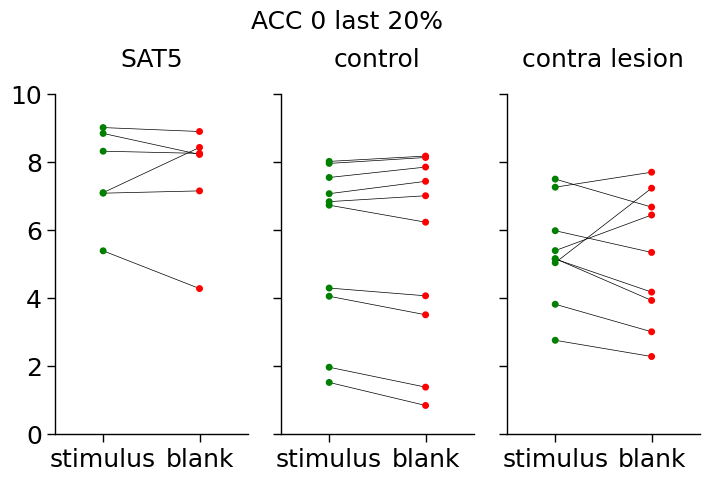

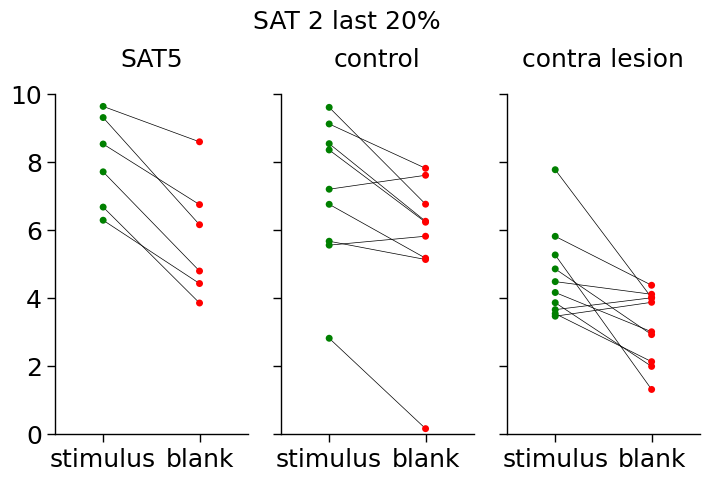

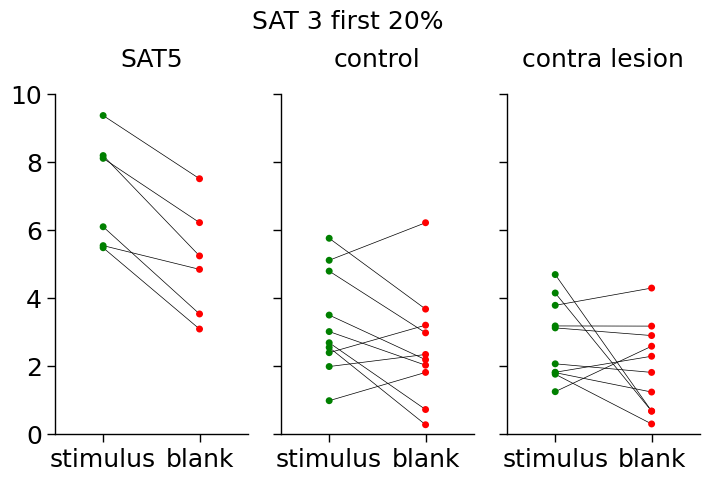

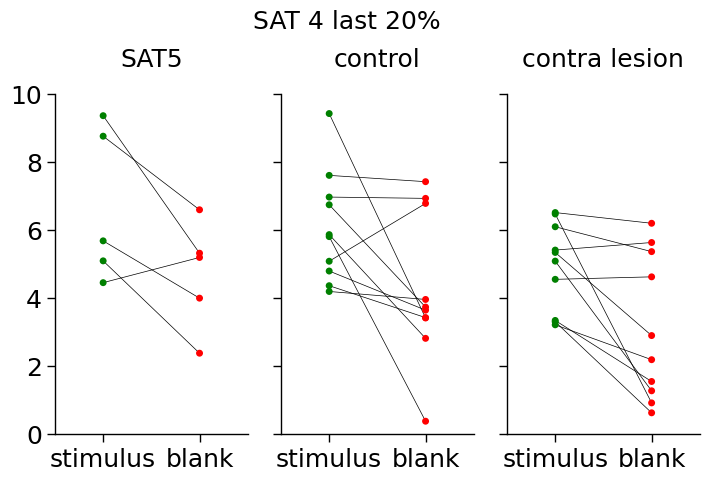

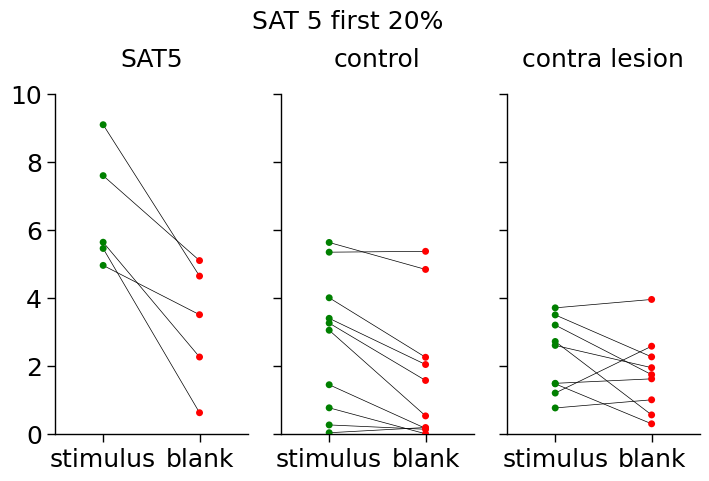

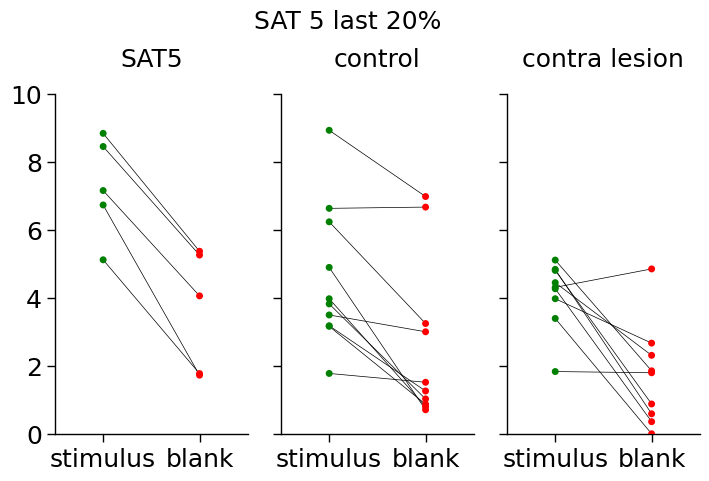

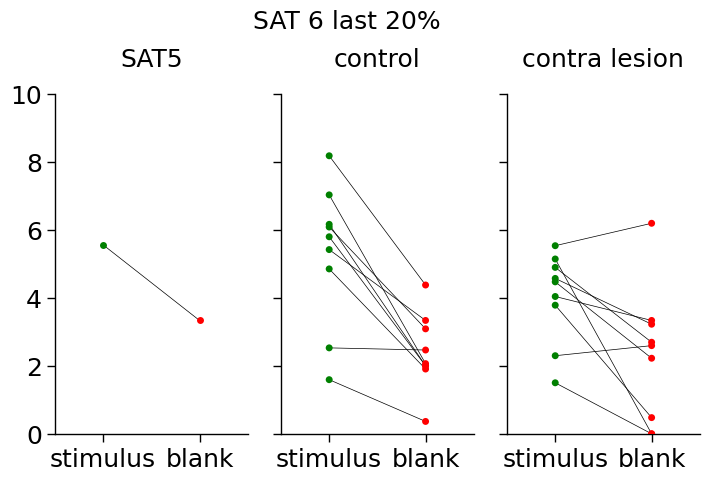

In [103]:
days = ['ACC 0 last 20%', 'SAT 2 last 20%', f'SAT 3 first 20%', f'SAT 4 last 20%', f'SAT 5 first 20%', 'SAT 5 last 20%', f'SAT 6 last 20%']
conds = ['SAT5', 'control', 'contra lesion']

for day in days:
    dayfilt = cdfilt[cdfilt["daytime"] == day]
    g = plot_pair_strip(dayfilt, y="lick",x="stimulus", order=["stimulus", "blank"],
                        hue="stimulus", palette=["green", "red"], 
                        hue_order=["stimulus", "blank"],col_order=conds,
                        col="cond", jitter=False, aspect=0.5, legend=False, connect=True)
    g.fig.suptitle(day, y=1.03)

In [104]:
res = []
cdfilt = cdfilt.sort_values(['condition', 'Day', 'time', 'animal'])

stimcond = cdfilt["stimulus"] == "stimulus"
blankcond = cdfilt["stimulus"] == "blank"

conds = ['SAT5', 'control', 'contra lesion']
days = ['ACC 0 last 20%', 'SAT 2 last 20%', f'SAT 3 first 20%', f'SAT 4 last 20%', f'SAT 5 first 20%', 'SAT 5 last 20%', f'SAT 6 last 20%']
filt = (cdfilt.apply(lambda x: x['cond'] in conds, axis=1)) & (cdfilt.apply(lambda x: x['daytime'] in days, axis=1))
ind = cdfilt[filt][["cond", "daytime"]].apply(tuple, axis=1).unique()
ind.sort()

for c, day in ind:
    daycond = cdfilt["daytime"] == day
    ccond = cdfilt["cond"] == c
    #print(firstlast20_means[daycond])
    stim = cdfilt[stimcond & daycond & ccond]["lick"]
    san = cdfilt[stimcond & daycond & ccond][['animal',"lick"]]
    blank = cdfilt[blankcond & daycond & ccond]["lick"]
    ban = cdfilt[blankcond & daycond & ccond][['animal',"lick"]]
    #print(day, c,'stim', san,'blank', ban, '\n')
    res.append(stats.wilcoxon(stim, blank))

pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.Series(ind).apply(lambda x: x[0] + ", " + x[1]))

,statistic,pvalue
"SAT5, ACC 0 last 20%",8.0,0.687500
"SAT5, SAT 2 last 20%",0.0,0.031250
"SAT5, SAT 3 first 20%",0.0,0.031250
"SAT5, SAT 4 last 20%",1.0,0.125000
"SAT5, SAT 5 first 20%",0.0,0.062500
"SAT5, SAT 5 last 20%",0.0,0.062500
"SAT5, SAT 6 last 20%",0.0,1.000000
"contra lesion, ACC 0 last 20%",17.0,0.570312
"contra lesion, SAT 2 last 20%",4.0,0.013672
"contra lesion, SAT 3 first 20%",16.0,0.275391


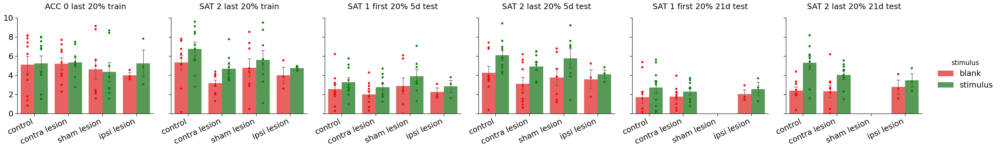

In [301]:
days = ['ACC 0 last 20% train', 'SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
plt_data = firstlast20_means[firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1) 
                              & (firstlast20_means.apply(lambda x: x['daytimetest'] in days, axis=1))]
plot_bar_strip(plt_data, y='lick', x='cond',hue='stimulus', col='daytimetest',
               col_order=days,errorbar='se',err_kws={'lw':1, 'zorder':0}, 
               alpha=0.7, palette=['red', 'green'], dodge=True,
               hue_order=['blank', 'stimulus'], order=conds,
               xlab_kws={'rotation':25, 'ha':'right'}, 
               )

In [302]:
res = []
res1 = []
days = ['ACC 0 last 20% train', 'SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
firstlast20_means = firstlast20_means.sort_values(['cond', 'daytimetest', 'stimulus','animal'])

filt = (firstlast20_means.apply(lambda x: x['daytimetest'] in days, axis=1)) & (firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1))
ind = firstlast20_means[filt][["cond", "stimulus"]].apply(tuple, axis=1).unique()

for t,s in ind:
    test = []
    tcond = firstlast20_means['cond'] == t
    scond = firstlast20_means['stimulus'] == s
    for c in days:
        ccond = firstlast20_means["daytimetest"] == c
        dat = firstlast20_means[ccond & tcond & scond]['lick']
        if len(dat) > 1:
            test.append(dat)
    if len(test) > 0:
        res.append(stats.f_oneway(*test))
        res1.append(stats.tukey_hsd(*test))
    else:
        res.append((pd.NA, pd.NA))
        res1.append(pd.NA)

pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.Series(ind).apply(lambda x: x[1] + ", " + x[0]))

,statistic,pvalue
"blank, contra lesion",5.302062,0.000536
"stimulus, contra lesion",8.506735,0.000007
"blank, control",5.292087,0.000500
"stimulus, control",5.858623,0.000215
"blank, ipsi lesion",1.670251,0.216058
"stimulus, ipsi lesion",1.929309,0.162825
"blank, sham lesion",0.811292,0.499186
"stimulus, sham lesion",0.910363,0.449533


In [239]:
#{0 : 'ACC 0 last 20% train', 1: 'SAT 2 last 20% train', 
# 2 : 'SAT 1 first 20% 5d test', 3 : 'SAT 2 last 20% 5d test', 
# 4 : 'SAT 1 first 20% 21d test', 5 : 'SAT 2 last 20% 21d test'}
for i in range(len(res1)):
    print(ind[i])
    print(res1[i])

('contra lesion', 'blank')
Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)      2.024     0.096    -0.209     4.257
 (0 - 2)      3.205     0.001     0.972     5.437
 (0 - 3)      2.071     0.083    -0.161     4.304
 (0 - 4)      3.419     0.001     1.128     5.710
 (0 - 5)      2.887     0.006     0.596     5.177
 (1 - 0)     -2.024     0.096    -4.257     0.209
 (1 - 2)      1.181     0.597    -0.993     3.354
 (1 - 3)      0.048     1.000    -2.126     2.221
 (1 - 4)      1.395     0.444    -0.838     3.628
 (1 - 5)      0.863     0.860    -1.370     3.096
 (2 - 0)     -3.205     0.001    -5.437    -0.972
 (2 - 1)     -1.181     0.597    -3.354     0.993
 (2 - 3)     -1.133     0.638    -3.306     1.040
 (2 - 4)      0.215     1.000    -2.018     2.447
 (2 - 5)     -0.318     0.998    -2.551     1.915
 (3 - 0)     -2.071     0.083    -4.304     0.161
 (3 - 1)     -0.048     1.000    -2.221     2.126
 (3 -

#### first and last 20% performance

In [79]:
firstlast20_perf['animal'] = firstlast20_perf['animal'].str.rstrip('traines ')
firstlast20_means['animal'] = firstlast20_means['animal'].str.rstrip('traines ')

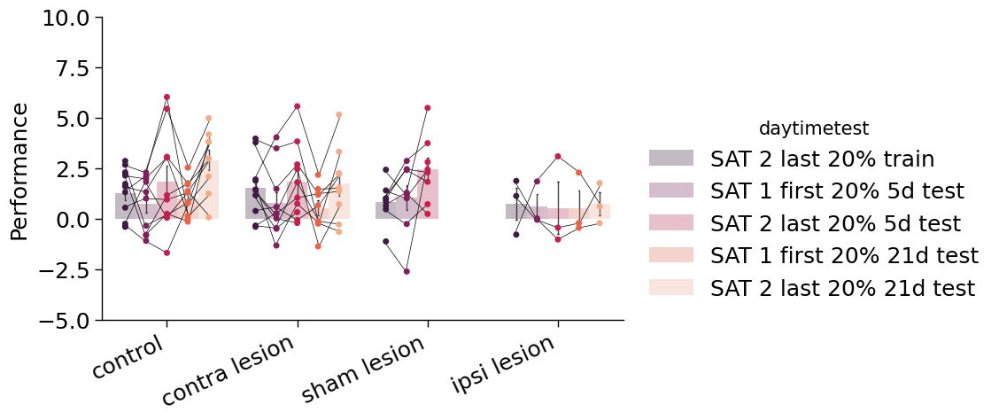

In [83]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
tmp = firstlast20_perf[firstlast20_perf.apply(lambda x: x["daytimetest"] in days, axis=1) & firstlast20_perf.apply(lambda x: x["cond"] in conds, axis=1)]
g = plot_bar_strip(tmp, x='cond', y='lick', hue='daytimetest', linestyle='none',palette='rocket',order=conds,
                errorbar='se',err_kws={'lw':1, 'zorder':0}, hue_order=days, ylim=[-5,10],
                dodge=0.5, capsize=0.05, alpha=0.3, aspect=1.5, zorder=0.1, legend=True, connect=True,
                xlab_kws={'rotation':25, 'ha':'right'}, ylabel='Performance')

#### first and last 20% difference after break

In [308]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
filt = firstlast20_means[firstlast20_means.apply(lambda x: x['cond'] in conds, axis=1)]
filt = filt.set_index(['cond', 'animal', 'stimulus'])
firstlastfilt = [filt[(filt['daytimetest'] == days[i])]['lick']
                    for i in range(len(days))]


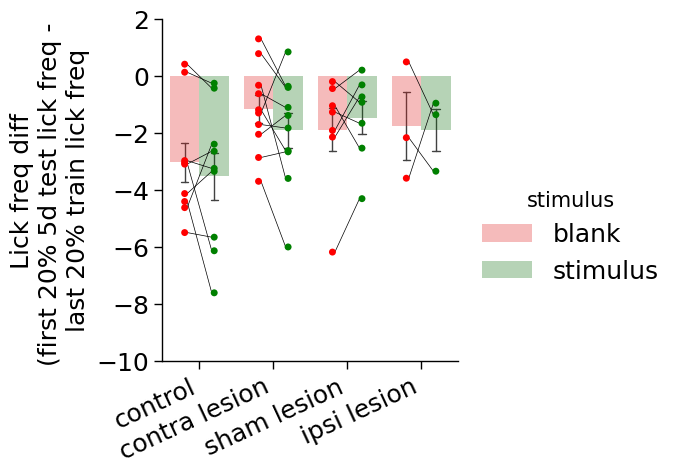

In [318]:
diff = (firstlastfilt[1] - firstlastfilt[0]).reset_index()
g = plot_bar_strip(diff, y='lick', x='cond', hue='stimulus', ylim=[-10, 2],
                errorbar='se',err_kws={'lw':1, 'zorder':0}, alpha=0.3, dodge=True, connect=True,
                palette=['red', 'green'], hue_order=['blank', 'stimulus'], order=conds,
                xlab_kws={'rotation':25, 'ha':'right'},
                ylabel='Lick freq diff\n(first 20% 5d test lick freq - \nlast 20% train lick freq')

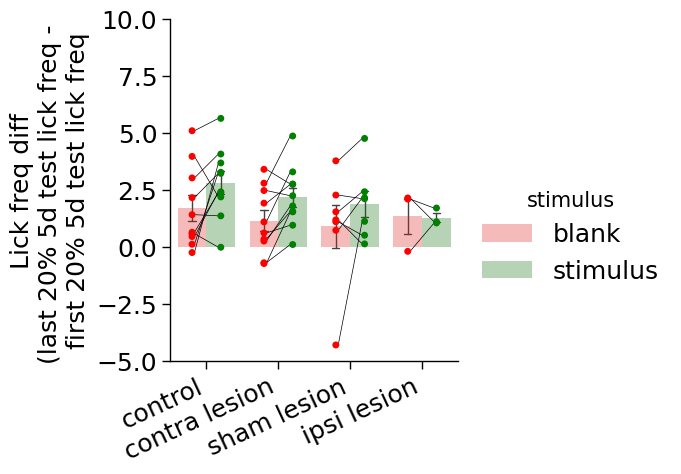

In [319]:
diff = (firstlastfilt[2] - firstlastfilt[1]).reset_index()
g = plot_bar_strip(diff, y='lick', x='cond', hue='stimulus', ylim=[-5, 10],
                errorbar='se',err_kws={'lw':1, 'zorder':0}, alpha=0.3, dodge=True, connect=True,
                palette=['red', 'green'], hue_order=['blank', 'stimulus'], order=conds,
                xlab_kws={'rotation':25, 'ha':'right'},
                ylabel='Lick freq diff\n(last 20% 5d test lick freq - \nfirst 20% 5d test lick freq')

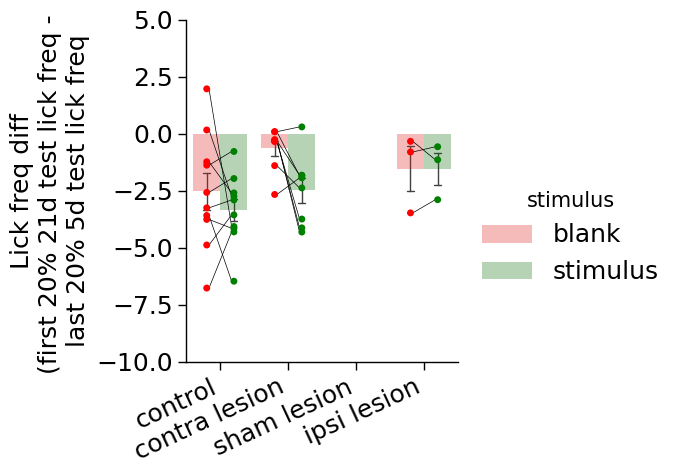

In [321]:
diff = (firstlastfilt[3] - firstlastfilt[2]).reset_index()
g = plot_bar_strip(diff, y='lick', x='cond', hue='stimulus', ylim=[-10, 5],
                errorbar='se',err_kws={'lw':1, 'zorder':0}, alpha=0.3, dodge=True, connect=True,
                palette=['red', 'green'], hue_order=['blank', 'stimulus'], order=conds,
                xlab_kws={'rotation':25, 'ha':'right'},
                ylabel='Lick freq diff\n(first 20% 21d test lick freq - \nlast 20% 5d test lick freq')

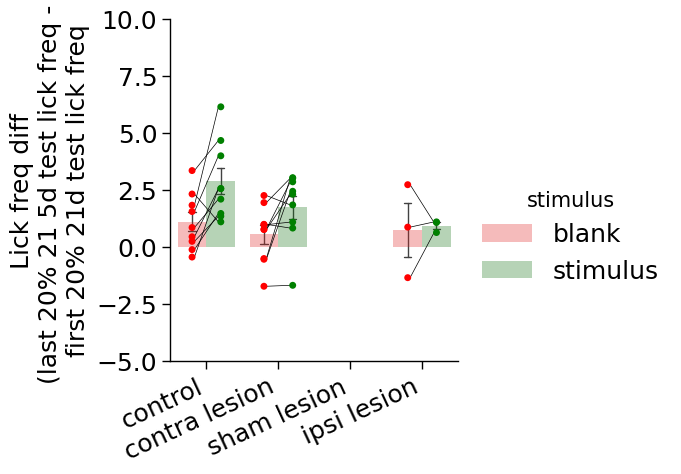

In [322]:
diff = (firstlastfilt[4] - firstlastfilt[3]).reset_index()
g = plot_bar_strip(diff, y='lick', x='cond', hue='stimulus', ylim=[-5, 10],
                errorbar='se',err_kws={'lw':1, 'zorder':0}, alpha=0.3, dodge=True, connect=True,
                palette=['red', 'green'], hue_order=['blank', 'stimulus'], order=conds,
                xlab_kws={'rotation':25, 'ha':'right'},
                ylabel='Lick freq diff\n(last 20% 21 5d test lick freq - \nfirst 20% 21d test lick freq')

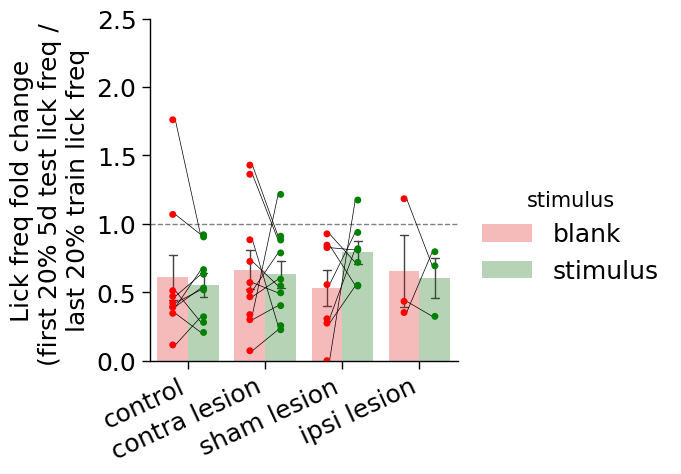

In [324]:
fold = (firstlastfilt[1]/firstlastfilt[0]).reset_index()
g = plot_bar_strip(fold, y='lick', x='cond', hue='stimulus', ylim=[0, 2.5],
                errorbar='se',err_kws={'lw':1, 'zorder':0}, alpha=0.3, dodge=True, connect=True,
                palette=['red', 'green'], hue_order=['blank', 'stimulus'], order=conds,
                xlab_kws={'rotation':25, 'ha':'right'},
                ylabel='Lick freq fold change\n(first 20% 5d test lick freq / \nlast 20% train lick freq')
g.axes[0][0].axhline(y=1, xmin=0, xmax=1, ls="--", color="grey", zorder=0, lw=1)


In [90]:
days = ['SAT 2 last 20% train', f'SAT 1 first 20% 5d test', f'SAT 2 last 20% 5d test', f'SAT 1 first 20% 21d test', f'SAT 2 last 20% 21d test']
conds = ['control', 'contra lesion', 'sham lesion', 'ipsi lesion']
filt = firstlast20_perf[firstlast20_perf.apply(lambda x: x['cond'] in conds, axis=1)]
filt = filt.set_index(['cond', 'animal'])
firstlastperffilt = [filt[(filt['daytimetest'] == days[i])]['lick']
                    for i in range(len(days))]

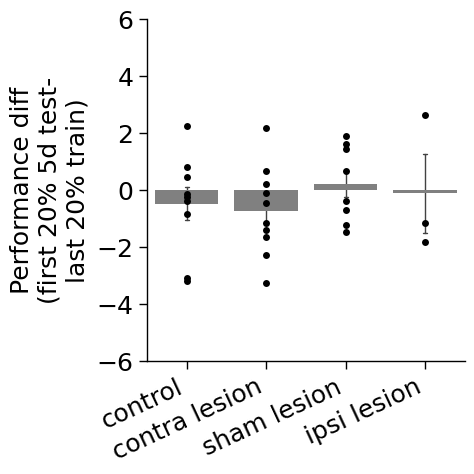

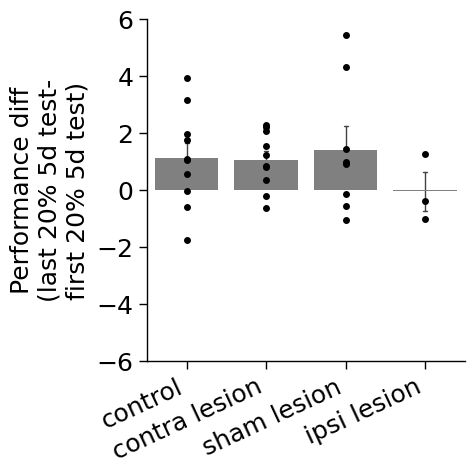

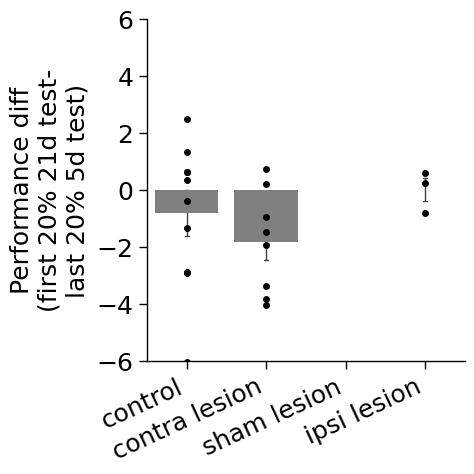

In [91]:
diff = (firstlastperffilt[1] - firstlastperffilt[0]).reset_index()
plot_bar_strip(diff,x='cond', y='lick', linestyle='none',order=conds, ylim=[-6, 6],
               errorbar='se',err_kws={'lw':1, 'zorder':0},color='grey',pt_color='k',
               dodge=0.5, capsize=0.05, alpha=1, aspect=1, zorder=0.1, 
               legend=True,xlab_kws={'rotation':25, 'ha':'right'},
               ylabel='Performance diff\n(first 20% 5d test-\nlast 20% train)')

diff = (firstlastperffilt[2] - firstlastperffilt[1]).reset_index()
plot_bar_strip(diff,x='cond', y='lick', linestyle='none',order=conds, ylim=[-6, 6],
               errorbar='se',err_kws={'lw':1, 'zorder':0},color='grey',pt_color='k',
               dodge=0.5, capsize=0.05, alpha=1, aspect=1, zorder=0.1, 
               legend=True,xlab_kws={'rotation':25, 'ha':'right'},
               ylabel='Performance diff\n(last 20% 5d test-\nfirst 20% 5d test)')

diff = (firstlastperffilt[3] - firstlastperffilt[2]).reset_index()
plot_bar_strip(diff,x='cond', y='lick', linestyle='none',order=conds, ylim=[-6, 6],
               errorbar='se',err_kws={'lw':1, 'zorder':0},color='grey',pt_color='k',
               dodge=0.5, capsize=0.05, alpha=1, aspect=1, zorder=0.1, 
               legend=True,xlab_kws={'rotation':25, 'ha':'right'},
               ylabel='Performance diff\n(first 20% 21d test-\nlast 20% 5d test)')

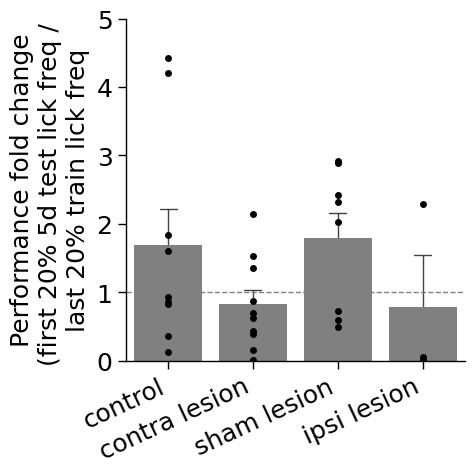

In [92]:
fold = (firstlastperffilt[1]/firstlastperffilt[0]).abs().reset_index()
g = plot_bar_strip(fold, y='lick', x='cond', ylim=[0, 5],
                errorbar='se',err_kws={'lw':1, 'zorder':0}, alpha=1, dodge=True,
                order=conds, color='grey', pt_color='k',
                xlab_kws={'rotation':25, 'ha':'right'},
                ylabel='Performance fold change\n(first 20% 5d test lick freq / \nlast 20% train lick freq')
g.axes[0][0].axhline(y=1, xmin=0, xmax=1, ls="--", color="grey", zorder=0, lw=1)

#### anticipatory lick frequency by condition

In [199]:
ant_means = ant_means[ant_means['Time (hr)'] < 48]
ant_perf = ant_perf[ant_perf['Time (hr)'] < 48]
tots = tots[tots['Time (hr)'] < 48]

In [190]:
ant_means.loc[ant_means['condition'].str.contains('retrain'), 'Time (hr)'] += 48 + 24
ant_means.loc[ant_means['condition'].str.contains('test'), 'Time (hr)'] += 48 + 48 + 24 + 24

ant_perf.loc[ant_perf['condition'].str.contains('retrain'), 'Time (hr)'] += 48 + 24
ant_perf.loc[ant_perf['condition'].str.contains('test'), 'Time (hr)'] += 48 + 48 + 24 + 24

tots.loc[tots['condition'].str.contains('retrain'), 'Time (hr)'] += 48 + 24
tots.loc[tots['condition'].str.contains('test'), 'Time (hr)'] += 48 + 48 + 24 + 24

In [178]:
recall = ['PNL5', 'PNL8', 'PPX1', 'PTE4', 'PTE2', 'PTE1', 'PB727']
maybe = ['PPX4', 'PPX5', 'PTE5', 'PB716', 'PWH3']
no = ['PPX2', 'PTE6', "PTE1", 'PNL6', 'PTE3', 'PNL1']

In [188]:
ant_means['animal'] = ant_means['animal'].str.rstrip('retraintest ')
ant_perf['animal'] = ant_perf['animal'].str.rstrip('retraintest ')
tots['animal'] = tots['animal'].str.rstrip('retraintest ')

TypeError: 'NoneType' object is not iterable

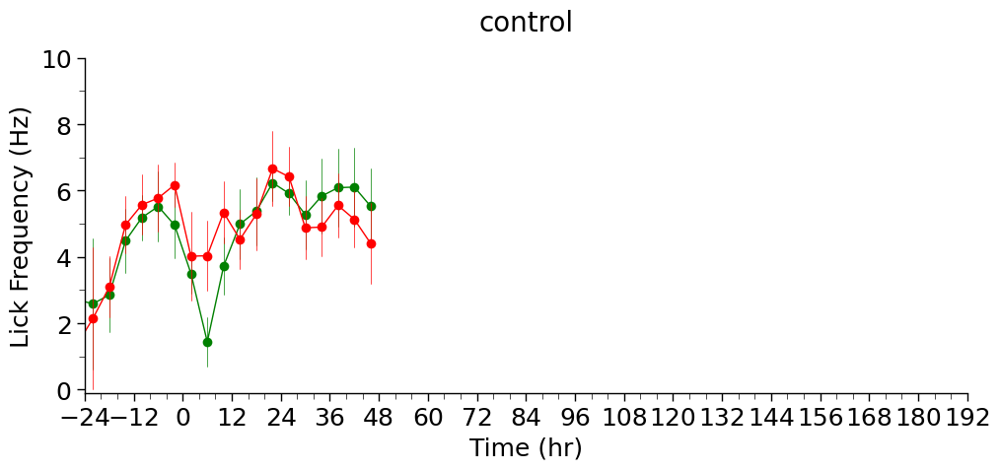

In [201]:
ylim = [-0.1, 10]
xlim = [-24, 192]
xticklab = ['', -24, -12, 0, 12, 24, 36, 48, '', 0, 12, 24, 36, 48, '', 0, 12, 24, 36, 48]
c = 'control'
g = plot_ant_lickfreq(ant_means[(ant_means['condition'].str.contains(c + ' train')) & (ant_means.apply(lambda x: x['animal'] not in recall, axis=1))]
                      ,y='lick',aspect=2,lw=1, ms=7,col='condition',
        title=c,legend=False, xlim=xlim, ylim=ylim, errorbar='se', err_style='bars', err_kws={"lw":0.5},
        wspace=0.15,style=False)
sns.lineplot(ant_means[(ant_means['condition'].str.contains(c + ' retrain')) & (ant_means.apply(lambda x: x['animal'] not in recall, axis=1))]
                      ,y='lick',lw=1, ms=7,ax=g.axes[0][0],x='Time (hr)',
        errorbar='se', err_style='bars', err_kws={"lw":0.5},hue='stimulus', 
        hue_order=['blank', 'stimulus'], palette=['red', 'green'], mec=None, marker='o', 
        legend=False)
sns.lineplot(ant_means[(ant_means['condition'].str.contains(c + ' test')) & (ant_means.apply(lambda x: x['animal'] not in recall, axis=1))]
                      ,y='lick',lw=1, ms=7,ax=g.axes[0][0],x='Time (hr)',
        errorbar='se', err_style='bars', err_kws={"lw":0.5},hue='stimulus', 
        hue_order=['blank', 'stimulus'], palette=['red', 'green'], mec=None, marker='o', 
        legend=False)
g.axes[0][0].set_xticklabels(xticklab)
xticks = g.axes[0][0].xaxis.get_major_ticks()
xticks[8].set_visible(False)
xticks[14].set_visible(False)
xticks = g.axes[0][0].xaxis.get_minor_ticks()
for i in [13, 14, 15, 16, 25, 26, 27, 28]:
        xticks[i].set_visible(False)
g.axes[0][0].text(12, -2, 'Train', ha='center')
g.axes[0][0].text(60, -0.6, '//', ha='center', va='bottom', fontsize=24)
g.axes[0][0].text(144-12, -0.6, '//', ha='center', va='bottom', fontsize=24)
g.axes[0][0].text(96, -2, '5d test', ha='center')
g.axes[0][0].text(168, -2, '21d test', ha='center')
g.axes[0][0].set_xlabel(g.axes[0][0].get_xlabel(), labelpad=28)

g = plot_ant_perf(ant_perf[(ant_perf['condition'].str.contains(c + ' train')) & (ant_perf.apply(lambda x: x['animal'] not in recall, axis=1))]
                  , ylabel="Performance\n$L_s - L_b$", aspect=2,lw=1, ms=7,
                title='',xlim=xlim,col='condition',
                legend=True, ylim=[-6, 6], errorbar='se', err_style='bars', err_kws={"lw":0.5},
                wspace=0.25
                )

sns.lineplot(ant_perf[(ant_perf['condition'].str.contains(c + ' retrain')) & (ant_perf.apply(lambda x: x['animal'] not in recall, axis=1))]
                      ,y='lick',lw=1, ms=7,ax=g.axes[0][0],x='Time (hr)',
        errorbar='se', err_style='bars', err_kws={"lw":0.5}, mec=None, marker='o', color='k',
        legend=False)
sns.lineplot(ant_perf[(ant_perf['condition'].str.contains(c + ' test')) & (ant_perf.apply(lambda x: x['animal'] not in recall, axis=1))]
                      ,y='lick',lw=1, ms=7,ax=g.axes[0][0],x='Time (hr)',
        errorbar='se', err_style='bars', err_kws={"lw":0.5},color='k', mec=None, marker='o', 
        legend=False)
g.axes[0][0].set_xticklabels(xticklab)
xticks = g.axes[0][0].xaxis.get_major_ticks()
xticks[8].set_visible(False)
xticks[14].set_visible(False)
xticks = g.axes[0][0].xaxis.get_minor_ticks()
for i in [13, 14, 15, 16, 25, 26, 27, 28]:
        xticks[i].set_visible(False)
g.axes[0][0].text(12, -8, 'Train', ha='center')
g.axes[0][0].text(60, -6.6, '//', ha='center', va='bottom', fontsize=24)
g.axes[0][0].text(144-11, -6.6, '//', ha='center', va='bottom', fontsize=24)
g.axes[0][0].text(96, -8, '5d test', ha='center')
g.axes[0][0].text(168, -8, '21d test', ha='center')
g.axes[0][0].set_xlabel(g.axes[0][0].get_xlabel(), labelpad=28)

g = plot_trial_hr(tots[(tots['condition'].str.contains(c  + ' train')) & (tots.apply(lambda x: x['animal'] not in recall, axis=1))],
                  xlim=xlim, col='condition',fill=False,
               ylim=[0, 400], aspect=3, title='', ms=7, lw=1,err_kws={"lw":0.5}, ylabel='Number of trials',
               wspace=0.04)
sns.lineplot(tots[(tots['condition'].str.contains(c + ' retrain'))& (tots.apply(lambda x: x['animal'] not in recall, axis=1))],
                      y='trial no',lw=1, ms=7,ax=g.axes[0][0],x='Time (hr)',
        errorbar='se', err_style='bars', err_kws={"lw":0.5},color='k', mec=None, marker='o', 
        legend=False)
sns.lineplot(tots[(tots['condition'].str.contains(c + ' test'))& (tots.apply(lambda x: x['animal'] not in recall, axis=1))],
                      y='trial no',lw=1, ms=7,ax=g.axes[0][0],x='Time (hr)',
        errorbar='se', err_style='bars', err_kws={"lw":0.5},color='k', mec=None, marker='o', 
        legend=False)
g.axes[0][0].set_xticklabels(xticklab)
xticks = g.axes[0][0].xaxis.get_major_ticks()
xticks[8].set_visible(False)
xticks[14].set_visible(False)
xticks = g.axes[0][0].xaxis.get_minor_ticks()
for i in [13, 14, 15, 16, 25, 26, 27, 28]:
        xticks[i].set_visible(False)
g.axes[0][0].text(12, -85, 'Train', ha='center')
g.axes[0][0].text(60, -25, '//', ha='center', va='bottom', fontsize=24)
g.axes[0][0].text(144-12, -25, '//', ha='center', va='bottom', fontsize=24)
g.axes[0][0].text(96, -85, '5d test', ha='center')
g.axes[0][0].text(168, -85, '21d test', ha='center')
g.axes[0][0].set_xlabel(g.axes[0][0].get_xlabel(), labelpad=28)
for i in range(len(g.axes[0][0].lines)):
        if i % 2 == 0:
                g.axes[0][0].fill_between(g.axes[0][0].lines[i].get_data()[0], g.axes[0][0].lines[i].get_data()[1], 
                                        color='k', alpha=0.3)
# for name, ax in g.axes_dict.items():
#         ax.spines[['right']].set_visible(True)
#         ax.spines[['left']].set_visible(False)
#         ax.xaxis.set_visible(False)
#         ax.yaxis.tick_right()

In [ ]:
res = []
res1 = []
trials_day = trials_day.sort_values(['condition', 'animal', 'Day'])

filt = ~(trials_day['condition'].str.contains('-')) & ~(trials_day['condition'].str.contains('SAT'))
ind = trials_day[filt][["Day", "time"]].apply(tuple, axis=1).unique()
#ind = daytotsfilt[filt]['time'].unique()
conds = trials_day[filt]['cond'].unique()

for d, t in ind:
    test = []
    tcond = trials_day['time'] == t
    dcond = trials_day['Day'] == d
    for c in conds:
        ccond = trials_day["cond"] == c
        dat = trials_day[ccond & tcond & dcond]['trial no']
        if len(dat) > 1:
            test.append(dat)
    #print(t, test)
    if len(test) > 0:
        res.append(stats.f_oneway(*test))
        res1.append(stats.tukey_hsd(*test))
    else:
        res.append(pd.NA)
        res1.append(pd.NA)

pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.Series(ind).apply(lambda x: x[1] + ", " + x[0]))


,statistic,pvalue
"retrain, SAT 1",5.730165,0.012525
"retrain, SAT 2",7.29253,0.005167
"test, SAT 1",0.139633,0.718355
"test, SAT 2",0.135453,0.723721
"train, SAT 1",3.760575,0.040184
"train, SAT 2",5.156077,0.015636
"train, ACC 0",6.322429,0.007450
"train, ACC -1",<NA>,NaN


In [ ]:
#0 - contra lesion, 1 - control, 2 - sham/ipsi
for i in range(len(ind)):
    print(ind[i])
    print(res1[i])

('contra lesion', 'retrain')
Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)    -43.250     0.498  -176.474    89.974
 (1 - 0)     43.250     0.498   -89.974   176.474

('contra lesion', 'test')
Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)     35.000     0.744  -367.304   437.304
 (1 - 0)    -35.000     0.744  -437.304   367.304

('contra lesion', 'train')
Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)    -58.333     0.865  -342.382   225.715
 (0 - 2)     19.944     0.984  -272.846   312.735
 (1 - 0)     58.333     0.865  -225.715   342.382
 (1 - 2)     78.278     0.783  -214.513   371.068
 (2 - 0)    -19.944     0.984  -312.735   272.846
 (2 - 1)    -78.278     0.783  -371.068   214.513

('control', 'retrain')
Tukey's HSD Pairwise Group Comparisons

control SAT 2 -  slope: -0.637, y-int: 1.262,R:-0.82686, pval:0.173


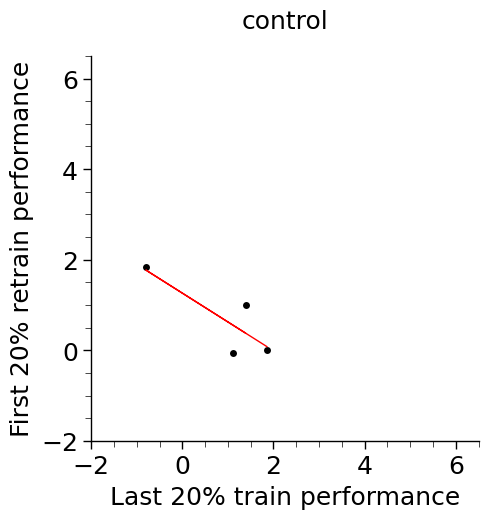

In [ ]:
#last 20% train vs first 20% 5d test

def lin(x, b, a):
    return a*x + b

def pw(x, a, b):
    return np.exp(a)*(x**b)

f, ax = plt.subplots(1,1, figsize=(5,5))
firstlast20_perf = firstlast20_perf.sort_values(['condition', 'animal', 'daytime'])         
xdata = firstlast20_perf[(firstlast20_perf['cond'] == 'sham and ipsi lesion') &(firstlast20_perf['daytime'] == 'train last 20% SAT 2') & 
                         ~((firstlast20_perf['animal'] == 'PTE1') | (firstlast20_perf['animal'] == 'PB716') | (firstlast20_perf['animal'] == 'PB729'))]['lick']
ydata = firstlast20_perf[(firstlast20_perf['cond'] == 'sham and ipsi lesion') &(firstlast20_perf['daytime'] == 'retrain first 20% SAT 1') 
                         & ~(firstlast20_perf['animal'] == 'PTE1')]['lick']

res = stats.linregress(xdata, y=ydata)
popt = (res.intercept, res.slope)

ax.plot(xdata, ydata, 'ko')
ax.plot(xdata, lin(xdata, *popt), 'r-', lw=1, label='y = %5.3fx + %5.3f' % (res.slope, res.intercept))
ax.set_xlim([-2, 6.5])
ax.set_ylim([-2, 6.5])
ax.set_xlabel('Last 20% train performance')
ax.set_ylabel('First 20% retrain performance')
ax.spines['right'].set_visible(False)
ax.xaxis.set_major_locator(ticker.MultipleLocator(2))
ax.xaxis.set_minor_locator(ticker.MultipleLocator(0.5))
ax.yaxis.set_major_locator(ticker.MultipleLocator(2))
ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.5))
ax.set_title('control')
#f.legend(loc='lower right', )
print('%s %s -  slope: %5.3f, y-int: %5.3f,R:%1.5f, pval:%1.3f' % (c,day,res.slope, res.intercept,res.rvalue, res.pvalue))
#ax.set_title(day)  
#f.suptitle(c)

# corrs_tot = corrs[(corrs['stimulus'] == 'stimulus') & (corrs['Day'] == "SAT 1")].sort_values('total trials')
# xdata = corrs_tot['total trials']
# ydata = corrs_tot['perf']
# res = stats.linregress(xdata, y=ydata)
# popt = (res.intercept, res.slope)
# f, axs = plt.subplots(1,1, figsize=(5,5))
# axs.plot(corrs_tot['total trials'], corrs_tot['perf'], 'ko', label='data')
# axs.plot(corrs_tot['total trials'],lin(corrs_tot['total trials'], *popt), 'r-',lw=1)
# print(res)


train SAT 2 -  slope: 0.036, y-int: 3.394,R:0.24284, pval:0.000

train SAT 2 -  slope: 0.006, y-int: 4.750,R:0.33295, pval:0.000



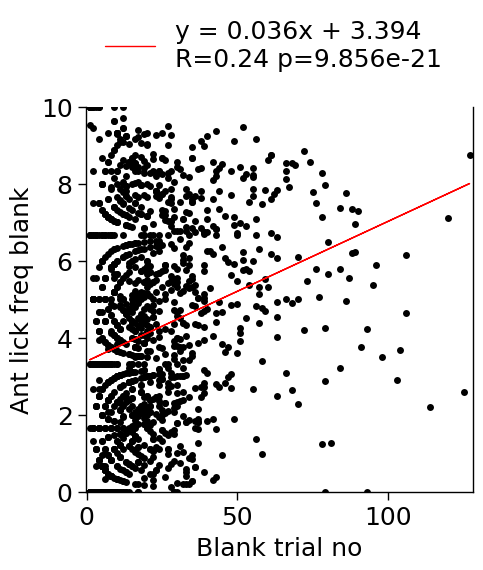

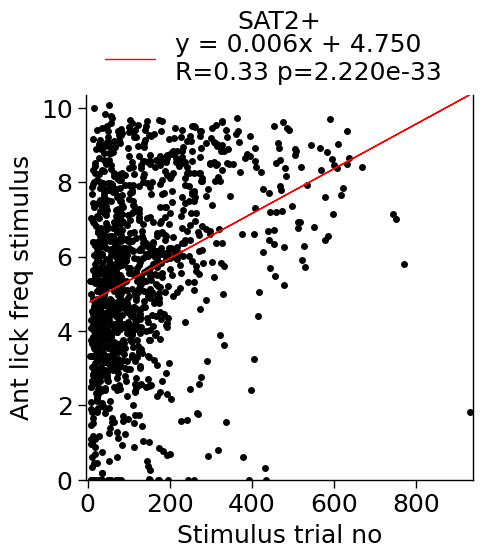

In [62]:
def lin(x, b, a):
    return a*x + b

def pw(x, a, b):
    return np.exp(a)*(x**b)

f, ax = plt.subplots(1,1, figsize=(5,5))
ydata = means_trials[(means_trials['Time (hr)']< 0) & (means_trials['stimulus'] == 'blank')]['lick']
xdata = means_trials[(means_trials['Time (hr)'] < 0) & (means_trials['stimulus'] == 'blank')]['trial no']
res = stats.linregress(xdata, y=ydata)
popt = (res.intercept, res.slope)
ax.plot(xdata, ydata, 'ko')
ax.plot(xdata, lin(xdata, *popt), 'r-', lw=1, label='y = %5.3fx + %5.3f\nR=%1.2f p=%1.3e' % (res.slope, res.intercept, res.rvalue, res.pvalue))
ax.set_xlabel('Blank trial no')
ax.set_ylabel('Ant lick freq blank')
f.legend(loc='upper center', bbox_to_anchor=(0.5, 1.1))
print('%s %s -  slope: %5.3f, y-int: %5.3f,R:%1.5f, pval:%1.3f\n' % ('train','SAT 2',res.slope, res.intercept,res.rvalue, res.pvalue))

f, ax = plt.subplots(1,1, figsize=(5,5))
ydata = means_trials[(means_trials['Time (hr)'] >=24)& (means_trials['stimulus'] == 'stimulus')]['lick']
xdata = means_trials[(means_trials['Time (hr)'] >=24) &(means_trials['stimulus'] == 'stimulus')]['trial no']
res = stats.linregress(xdata, y=ydata)
popt = (res.intercept, res.slope)
ax.plot(xdata, ydata, 'ko')
ax.plot(xdata, lin(xdata, *popt), 'r-', lw=1, label='y = %5.3fx + %5.3f\nR=%1.2f p=%1.3e' % (res.slope, res.intercept, res.rvalue, res.pvalue))
ax.set_xlabel('Stimulus trial no')
ax.set_ylabel('Ant lick freq stimulus')
f.legend(loc='upper center',  bbox_to_anchor=(0.5, 1.05))
ax.set_title('SAT2+', y=1.1)
print('%s %s -  slope: %5.3f, y-int: %5.3f,R:%1.5f, pval:%1.3f\n' % ('train','SAT 2',res.slope, res.intercept,res.rvalue, res.pvalue))


In [8]:
import sklearn
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import umap

In [9]:
ant_perf.set_index(['condition', 'animal', 'Time (hr)'])

Strain   Age    Cage  \
condition      animal                   Time (hr)                             
100ACC80ACC    PNL1                     -48.0      .1-3/sscre  27.0  Piplup   
                                        -44.0      .1-3/sscre  27.0  Piplup   
                                        -40.0      .1-3/sscre  27.0  Piplup   
                                        -36.0      .1-3/sscre  27.0  Piplup   
                                        -32.0      .1-3/sscre  27.0  Piplup   
...                                                       ...   ...     ...   
Mo Ipsi-lesion 210716_KEI_3F Kanye_ipsi  104.0              u     u   Kanye   
                                         108.0              u     u   Kanye   
                                         112.0              u     u   Kanye   
                                         116.0              u     u   Kanye   
                                         120.0              u     u   Kanye   

                                                     Date     acc  Day  \
condition      animal                   Time (hr)                        
100ACC80ACC    PNL1                     -48.0           u  2 days -2.0   
                                        -44.0           u  2 days -2.0   
                                        -40.0           u  2 days -2.0   
                                        -36.0           u  2 days -2.0   
                                        -32.0           u  2 days -2.0   
...                                                   ...     ...  ...   
Mo Ipsi-lesion 210716_KEI_3F Kanye_ipsi  104.0     210716  1 days  4.0   
                                         108.0     210716  1 days  4.0   
                                         112.0     210716  1 days  4.0   
                                         116.0     210716  1 days  4.0   
                                         120.0     210716  1 days  5.0   

                                                       lick  
condition      animal                   Time (hr)            
100ACC80ACC    PNL1                     -48.0     -1.111111  
                                        -44.0      0.655680  
                                        -40.0     -0.609879  
                                        -36.0     -1.070699  
                                        -32.0      0.713805  
...                                                     ...  
Mo Ipsi-lesion 210716_KEI_3F Kanye_ipsi  104.0     2.817982  
                                         108.0     2.868143  
                                         112.0     2.216692  
                                         116.0     3.059792  
                                         120.0     4.403794  

[3885 rows x 7 columns]

In [15]:
data = means_trials[(means_trials['Time (hr)'] < 240)].pivot(index=['condition', 'animal', 'Time (hr)'], values=['lick', 'trial no'], columns=['stimulus'])
data.columns = [' '.join(col).strip() for col in data.columns.values]
data['perf'] = ant_perf.set_index(['condition', 'animal', 'Time (hr)'])['lick']
data = data.reset_index()
data['cond time'] = data['condition'] + ' ' + data['Time (hr)'].astype(str)
data

,condition,animal,Time (hr),lick blank,lick stimulus,trial no blank,trial no stimulus,perf,cond time
0,0.1 mg DCZ hm4di,OHQ3,-40.0,6.527778,4.514768,24.0,79.0,-2.013010,0.1 mg DCZ hm4di -40.0
1,0.1 mg DCZ hm4di,OHQ3,-36.0,2.738095,2.767857,28.0,112.0,0.029762,0.1 mg DCZ hm4di -36.0
2,0.1 mg DCZ hm4di,OHQ3,-32.0,3.518519,3.428571,18.0,70.0,-0.089947,0.1 mg DCZ hm4di -32.0
3,0.1 mg DCZ hm4di,OHQ3,-28.0,3.333333,1.166667,8.0,20.0,-2.166667,0.1 mg DCZ hm4di -28.0
4,0.1 mg DCZ hm4di,OHQ3,-24.0,0.000000,2.698413,1.0,21.0,2.698413,0.1 mg DCZ hm4di -24.0
...,...,...,...,...,...,...,...,...,...
3869,sham lesion train,PWH9 train,28.0,3.888889,4.404762,6.0,28.0,0.515873,sham lesion train 28.0
3870,sham lesion train,PWH9 train,32.0,3.015873,3.956386,21.0,107.0,0.940513,sham lesion train 32.0
3871,sham lesion train,PWH9 train,36.0,3.137255,4.298246,17.0,76.0,1.160991,sham lesion train 36.0
3872,sham lesion train,PWH9 train,40.0,3.950617,4.563107,27.0,103.0,0.612490,sham lesion train 40.0


In [22]:
pca = PCA()
out = pca.fit_transform(data)
print(pca.explained_variance_ratio_)
out

[0.58510362 0.25817539 0.14601823 0.01070276]


array([[-1.8192501 , -0.82461321,  0.42317062, -0.00315206],
       [ 0.59616687, -2.19676185, -0.26442199,  0.00608921],
       [-1.65637808, -0.43695829,  0.41765867, -0.00384631],
       ...,
       [ 1.34859055, -0.28590977, -0.41872832,  0.0049827 ],
       [-1.84488118, -0.99754561,  0.54421956, -0.00500231],
       [ 1.12492963, -0.4525567 , -0.80382027,  0.01233822]])

In [24]:
umap

<module 'umap' from 'c:\\Users\\swind\\miniconda3\\envs\\behavior\\Lib\\site-packages\\umap\\__init__.py'>

In [23]:
reducer = umap.UMAP()
embedding = reducer.fit_transform()

AttributeError: module 'umap' has no attribute 'UMAP'